# Navigation Panel
<a href="#section1">1. Data Exploration (Apr 1) </a>

<a href="#section2">2. Training + Testing: Sets hardcoded (May 24) </a>

<a href="#section3">3. ARIMA (June 8 ~) </a>

In [1]:
import numpy as np
import pandas as pd
import bqplot
import matplotlib.pyplot as plt
import random
import seaborn as sns
import sklearn
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import cross_validate as cv
from sklearn.metrics import mean_squared_error, r2_score

from statsmodels.tsa.arima_model import ARIMA
from sklearn.metrics import mean_squared_error
from math import sqrt


# import tsfresh lib: capture 
## Swap out algorithms!

D:\Anaconda\lib\site-packages\statsmodels\tools\_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


## 1. Data Exploration (Apr 1) <a id= "section1"></a>

##### Interpretation 1: 
(1) Sales change by Department throughout days

In [2]:
calendar = pd.DataFrame(pd.read_csv("../calendar.csv"))

train_sales = pd.DataFrame(pd.read_csv("../sales_train_validation.csv"))

train_sales

# Mean of sales
# Linear trend of sales
# last time the sales reached maximum
# ** 56 classification / regression tasks
# Cartessian 
# Each data has 3 or more dimensions (distance to mean) K-means

# fourier
# tree-based mdls for interactions between features

,id,item_id,dept_id,cat_id,store_id,state_id,d_1,d_2,d_3,d_4,...,d_1904,d_1905,d_1906,d_1907,d_1908,d_1909,d_1910,d_1911,d_1912,d_1913
0,HOBBIES_1_001_CA_1_validation,HOBBIES_1_001,HOBBIES_1,HOBBIES,CA_1,CA,0,0,0,0,...,1,3,0,1,1,1,3,0,1,1
1,HOBBIES_1_002_CA_1_validation,HOBBIES_1_002,HOBBIES_1,HOBBIES,CA_1,CA,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
2,HOBBIES_1_003_CA_1_validation,HOBBIES_1_003,HOBBIES_1,HOBBIES,CA_1,CA,0,0,0,0,...,2,1,2,1,1,1,0,1,1,1
3,HOBBIES_1_004_CA_1_validation,HOBBIES_1_004,HOBBIES_1,HOBBIES,CA_1,CA,0,0,0,0,...,1,0,5,4,1,0,1,3,7,2
4,HOBBIES_1_005_CA_1_validation,HOBBIES_1_005,HOBBIES_1,HOBBIES,CA_1,CA,0,0,0,0,...,2,1,1,0,1,1,2,2,2,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
30485,FOODS_3_823_WI_3_validation,FOODS_3_823,FOODS_3,FOODS,WI_3,WI,0,0,2,2,...,2,0,0,0,0,0,1,0,0,1
30486,FOODS_3_824_WI_3_validation,FOODS_3_824,FOODS_3,FOODS,WI_3,WI,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
30487,FOODS_3_825_WI_3_validation,FOODS_3_825,FOODS_3,FOODS,WI_3,WI,0,6,0,2,...,2,1,0,2,0,1,0,0,1,0
30488,FOODS_3_826_WI_3_validation,FOODS_3_826,FOODS_3,FOODS,WI_3,WI,0,0,0,0,...,0,0,1,0,0,1,0,3,1,3


### Aggregation Level 5
#### Unit sales of all products, aggregated for each department

In [3]:
sales_pd_lvl5 = train_sales.groupby(['dept_id']).sum().iloc[:, :].transpose().reset_index()
#sales_pd_lvl5['dept_id'] = sales_pd_lvl5['dept_id'].str.slice(2, -1, 1)
#real_headers = sales_pd_lvl5.iloc(0)
#real_data = sales_pd_lvl5[1:]
#print(real_headers)
#print(real_data)

sales_pd_lvl5['index']  = sales_pd_lvl5['index'].str.slice(2).astype(int)
sales_pd_lvl5 = sales_pd_lvl5.rename(columns={"index": "day"})
sales_pd_lvl5.columns.name = "Idx"
sales_pd_lvl5

Idx,day,FOODS_1,FOODS_2,FOODS_3,HOBBIES_1,HOBBIES_2,HOUSEHOLD_1,HOUSEHOLD_2
0,1,2343,4094,16741,3610,154,4105,1584
1,2,2216,4209,16333,3172,185,3858,1776
2,3,1657,3174,12343,2497,185,2827,1100
3,4,1508,3606,13764,2531,138,2732,1133
4,5,1209,2869,10525,1714,100,1802,927
...,...,...,...,...,...,...,...,...
1908,1909,2657,4734,16241,3141,331,6393,1846
1909,1910,2639,4446,16232,3014,339,6580,1783
1910,1911,3169,4974,18561,3678,407,7762,1966
1911,1912,3712,5524,22691,4397,390,9545,2703


Text(0, 0.5, 'Unit Sales')

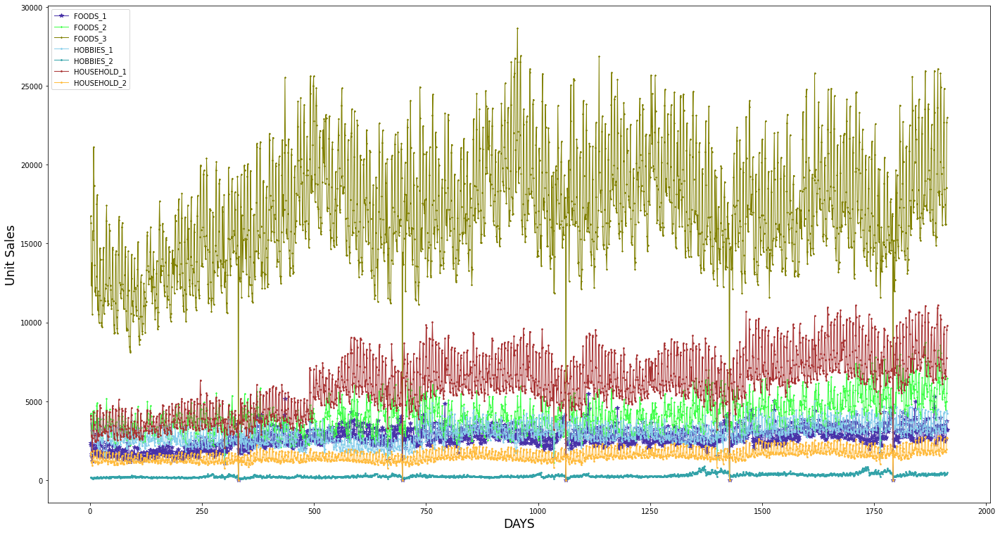

In [4]:
# multiple line plot
# plt.plot( 'index', 'FOODS_1', data=sales_pd_lvl5, marker='o', markerfacecolor='green', markersize=7, color='skyblue', linewidth=3)
plt.figure(figsize=(24,13))
plt.plot( 'day', 'FOODS_1', data=sales_pd_lvl5, marker='*', color='#4832a8', linewidth=1)
plt.plot( 'day', 'FOODS_2', data=sales_pd_lvl5, marker='*', markersize=2, color='#3dff47', linewidth=1)
plt.plot( 'day', 'FOODS_3', data=sales_pd_lvl5, marker='*', markersize=2, color='olive', linewidth=1)
plt.plot( 'day', 'HOBBIES_1', data=sales_pd_lvl5, marker='p', markersize=2, color='skyblue', linewidth=1)
plt.plot( 'day', 'HOBBIES_2', data=sales_pd_lvl5, marker='p', markersize=2, color='#32a2a8', linewidth=1)
plt.plot( 'day', 'HOUSEHOLD_1', data=sales_pd_lvl5, marker='p', markersize=2, color='#a83232', linewidth=1)
plt.plot( 'day', 'HOUSEHOLD_2', data=sales_pd_lvl5, marker='p', markersize=2, color='#ffbb3d', linewidth=1)

plt.legend()
plt.xlabel('DAYS', fontsize = 'xx-large')
plt.ylabel('Unit Sales', fontsize = 'xx-large')

## 2. Training & Testing: Sets hardcoded (May 24) <a id= "section2"></a>
### The methods herein are referenced from: 

- https://machinelearningmastery.com/k-fold-cross-validation/
- https://www.databriefing.com/coding/predict-sales-1/

In [5]:
train_data_lvl5 = sales_pd_lvl5[:-56]
test_data_lvl5 = sales_pd_lvl5[-56:]

train_data_lvl5

Idx,day,FOODS_1,FOODS_2,FOODS_3,HOBBIES_1,HOBBIES_2,HOUSEHOLD_1,HOUSEHOLD_2
0,1,2343,4094,16741,3610,154,4105,1584
1,2,2216,4209,16333,3172,185,3858,1776
2,3,1657,3174,12343,2497,185,2827,1100
3,4,1508,3606,13764,2531,138,2732,1133
4,5,1209,2869,10525,1714,100,1802,927
...,...,...,...,...,...,...,...,...
1852,1853,2558,4183,15220,2949,355,7060,1743
1853,1854,2498,3896,16012,3023,291,7151,1744
1854,1855,3222,4050,16936,3614,343,7503,1981
1855,1856,3577,5493,21997,3957,432,9810,2621


Coefficients: 
 [ 0.08199105 -0.07994154  0.0833547   0.01686524  0.84610894  0.1194878
 -0.00721733]
Mean squared error: 148996.14
Coefficient of determination: 0.55


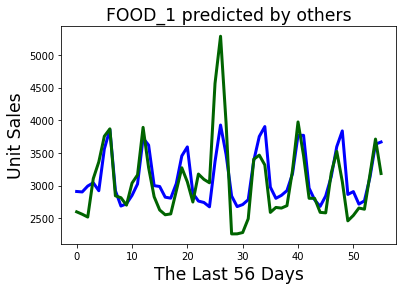

In [6]:
X_train = train_data_lvl5[['day','FOODS_2','FOODS_3','HOBBIES_1','HOBBIES_2','HOUSEHOLD_1','HOUSEHOLD_2']]
Y_train = train_data_lvl5['FOODS_1'].astype('int')


X_test = test_data_lvl5[['day','FOODS_2','FOODS_3','HOBBIES_1','HOBBIES_2','HOUSEHOLD_1','HOUSEHOLD_2']]
Y_test = test_data_lvl5['FOODS_1'].astype('int')


lr = LinearRegression()
lr.fit(X_train, Y_train)

Y_pred = lr.predict(X_test)

print('Coefficients: \n', lr.coef_)
# The mean squared error~~no idea what this 
print('Mean squared error: %.2f'
      % mean_squared_error(Y_test, Y_pred))
# The coefficient of determination: means the prediction is flawless
print('Coefficient of determination: %.2f'
      % r2_score(Y_test, Y_pred))


# Plot outputs
#plt.scatter(X_test, Y_test,  color='black')

plt.plot(Y_pred, color='blue', linewidth=3)
plt.plot(Y_test.values.tolist(), color='darkgreen', linewidth=3)

#plt.xticks(())
#plt.yticks(())
plt.title("FOOD_1 predicted by others", fontsize = "xx-large")
plt.xlabel("The Last 56 Days", fontsize = "xx-large")
plt.ylabel("Unit Sales", fontsize = "xx-large")
plt.show()

In [7]:
# "X" as in the data with features, and "y" as in 

#X_F1 = sales_by_dpt_by_day.drop(['FOODS_1'], axis=1).values
#y_F1 = sales_by_dpt_by_day.FOODS_1.values
#print("The training dataset has {} examples and {} features.".format(X_F1.shape[0], X_F1.shape[1]))
# This is, of course, grossly detached from reality. Will have to replace these with other features.


In [8]:
# lr = LinearRegression()
#kfolds = sklearn.model_selection.KFold(X_F1.shape[0], shuffle=True, random_state=42)
#scores = sklearn.model_selection.cross_val_score(LinearRegression(), X_F1, y_F1, cv=kfolds)

#print("Accuracy: %0.2f (+/- %0.2f)" % (scores.mean(), scores.std()))

In [9]:
X_train = train_data_lvl5[['day','FOODS_2','FOODS_3','HOBBIES_1','HOBBIES_2','HOUSEHOLD_1','HOUSEHOLD_2']]
Y_train = train_data_lvl5['FOODS_1'].astype('int')


X_test = test_data_lvl5[['day','FOODS_2','FOODS_3','HOBBIES_1','HOBBIES_2','HOUSEHOLD_1','HOUSEHOLD_2']]
Y_test = test_data_lvl5['FOODS_1'].astype('int')


### Aggregation Level 9
#### Unit sales of all products, aggregated for each store and department

In [10]:
sales_pd_lvl9 = train_sales.groupby(['dept_id', 'store_id']).sum().iloc[:, :].transpose().reset_index()
#sales_pd_lvl9['dept_id'] = sales_pd_lvl9['dept_id'].str.slice(2, -1, 1)
#real_headers = sales_pd_lvl9.iloc(0)
#real_data = sales_pd_lvl9[1:]
#print(real_headers)
#print(real_data)

sales_pd_lvl9['index']  = sales_pd_lvl9['index'].str.slice(2).astype(int)
sales_pd_lvl9 = sales_pd_lvl9.rename(columns={"index": "day"})
sales_pd_lvl9.columns.name = "Idx"
sales_pd_lvl9

dept_id    day FOODS_1                                          ...  \
store_id          CA_1 CA_2 CA_3 CA_4 TX_1 TX_2 TX_3 WI_1 WI_2  ...   
0            1     297  406  341  113  152  210  138  343  191  ...   
1            2     284  408  326  124  154  169  123  306  184  ...   
2            3     214  238  260   75  109  159  113  208  154  ...   
3            4     175  240  231   97  126  107   84  145  205  ...   
4            5     182  220  220  107  108  128   61    0   96  ...   
...        ...     ...  ...  ...  ...  ...  ...  ...  ...  ...  ...   
1908      1909     287  422  306  201  176  221  247  282  335  ...   
1909      1910     297  334  276  190  198  207  302  301  307  ...   
1910      1911     331  579  335  229  201  235  259  339  400  ...   
1911      1912     419  623  510  250  218  280  250  430  408  ...   
1912      1913     329  520  423  257  221  220  209  342  347  ...   

dept_id  HOUSEHOLD_2                                               
store_id        CA_1 CA_2 CA_3 CA_4 TX_1 TX_2 TX_3 WI_1 WI_2 WI_3  
0                181  234  286   64  106  199  120  148   98  148  
1                170  267  341   89  148  183  138  151   94  195  
2                114  158  231   73   69  117   97   66   69  106  
3                123  164  264   79   91  108   83   47   80   94  
4                135  151  272   73   67   98   46    0   32   53  
...              ...  ...  ...  ...  ...  ...  ...  ...  ...  ...  
1908             204  255  314  157  157  182  158  158  113  148  
1909             186  250  259  127  175  187  161  169  127  142  
1910             205  323  320  125  133  211  131  192  160  166  
1911             319  486  414  183  227  260  185  203  194  232  
1912             324  432  465  177  228  244  191  224  177  201  

[1913 rows x 71 columns]

In [11]:
sales_pd_lvl9.columns = sales_pd_lvl9.columns.map('_'.join)

In [12]:
#for col in sales_pd_lvl9.columns: 
#    print(col) 

Text(0, 0.5, 'Unit Sales of all products')

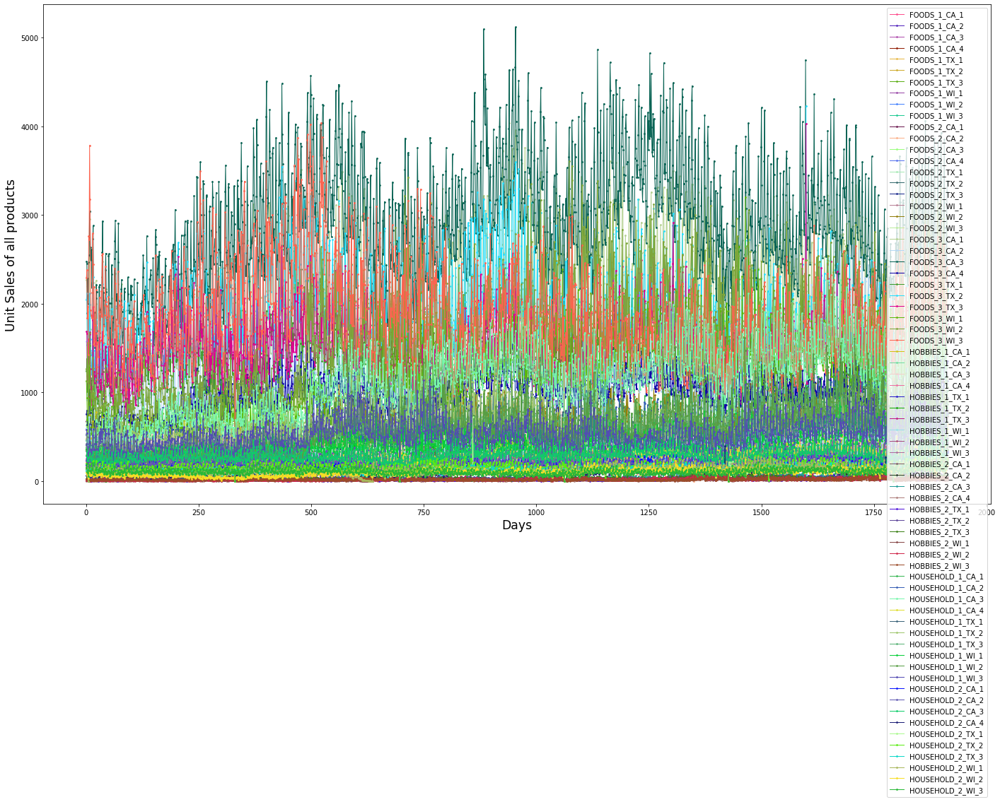

In [13]:
plt.figure(figsize=(24,13))
for each_series in sales_pd_lvl9.columns[1:]:
    plt.plot('day_', each_series, data=sales_pd_lvl9, marker='p', markersize=2, color=(random.random(), random.random(), random.random()), linewidth=1)
plt.legend()
plt.xlabel('Days', fontsize = 'xx-large')
plt.ylabel('Unit Sales of all products', fontsize = 'xx-large')

In [14]:
train_data_lvl9 = sales_pd_lvl9[:-56]
test_data_lvl9 = sales_pd_lvl9[-56:]

train_data_lvl9

Idx,day_,FOODS_1_CA_1,FOODS_1_CA_2,FOODS_1_CA_3,FOODS_1_CA_4,FOODS_1_TX_1,FOODS_1_TX_2,FOODS_1_TX_3,FOODS_1_WI_1,FOODS_1_WI_2,...,HOUSEHOLD_2_CA_1,HOUSEHOLD_2_CA_2,HOUSEHOLD_2_CA_3,HOUSEHOLD_2_CA_4,HOUSEHOLD_2_TX_1,HOUSEHOLD_2_TX_2,HOUSEHOLD_2_TX_3,HOUSEHOLD_2_WI_1,HOUSEHOLD_2_WI_2,HOUSEHOLD_2_WI_3
0,1,297,406,341,113,152,210,138,343,191,...,181,234,286,64,106,199,120,148,98,148
1,2,284,408,326,124,154,169,123,306,184,...,170,267,341,89,148,183,138,151,94,195
2,3,214,238,260,75,109,159,113,208,154,...,114,158,231,73,69,117,97,66,69,106
3,4,175,240,231,97,126,107,84,145,205,...,123,164,264,79,91,108,83,47,80,94
4,5,182,220,220,107,108,128,61,0,96,...,135,151,272,73,67,98,46,0,32,53
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1852,1853,253,317,410,187,127,242,306,194,285,...,185,237,266,96,199,171,183,147,135,124
1853,1854,181,369,433,172,155,213,239,253,285,...,150,193,288,95,182,189,149,150,188,160
1854,1855,375,432,479,273,200,270,257,262,422,...,197,285,281,106,187,251,167,197,163,147
1855,1856,427,566,599,227,224,264,225,344,436,...,298,494,413,124,239,241,187,236,174,215


In [15]:
wholeList = train_data_lvl9.columns.tolist()
wholeList.remove('day_')
xList = wholeList
print(xList)

['FOODS_1_CA_1', 'FOODS_1_CA_2', 'FOODS_1_CA_3', 'FOODS_1_CA_4', 'FOODS_1_TX_1', 'FOODS_1_TX_2', 'FOODS_1_TX_3', 'FOODS_1_WI_1', 'FOODS_1_WI_2', 'FOODS_1_WI_3', 'FOODS_2_CA_1', 'FOODS_2_CA_2', 'FOODS_2_CA_3', 'FOODS_2_CA_4', 'FOODS_2_TX_1', 'FOODS_2_TX_2', 'FOODS_2_TX_3', 'FOODS_2_WI_1', 'FOODS_2_WI_2', 'FOODS_2_WI_3', 'FOODS_3_CA_1', 'FOODS_3_CA_2', 'FOODS_3_CA_3', 'FOODS_3_CA_4', 'FOODS_3_TX_1', 'FOODS_3_TX_2', 'FOODS_3_TX_3', 'FOODS_3_WI_1', 'FOODS_3_WI_2', 'FOODS_3_WI_3', 'HOBBIES_1_CA_1', 'HOBBIES_1_CA_2', 'HOBBIES_1_CA_3', 'HOBBIES_1_CA_4', 'HOBBIES_1_TX_1', 'HOBBIES_1_TX_2', 'HOBBIES_1_TX_3', 'HOBBIES_1_WI_1', 'HOBBIES_1_WI_2', 'HOBBIES_1_WI_3', 'HOBBIES_2_CA_1', 'HOBBIES_2_CA_2', 'HOBBIES_2_CA_3', 'HOBBIES_2_CA_4', 'HOBBIES_2_TX_1', 'HOBBIES_2_TX_2', 'HOBBIES_2_TX_3', 'HOBBIES_2_WI_1', 'HOBBIES_2_WI_2', 'HOBBIES_2_WI_3', 'HOUSEHOLD_1_CA_1', 'HOUSEHOLD_1_CA_2', 'HOUSEHOLD_1_CA_3', 'HOUSEHOLD_1_CA_4', 'HOUSEHOLD_1_TX_1', 'HOUSEHOLD_1_TX_2', 'HOUSEHOLD_1_TX_3', 'HOUSEHOLD_1_WI_1',

### Predict Unit Sales on Aggregation Level 9:

Coefficient of determination: 0.76
RMSE: 39.835


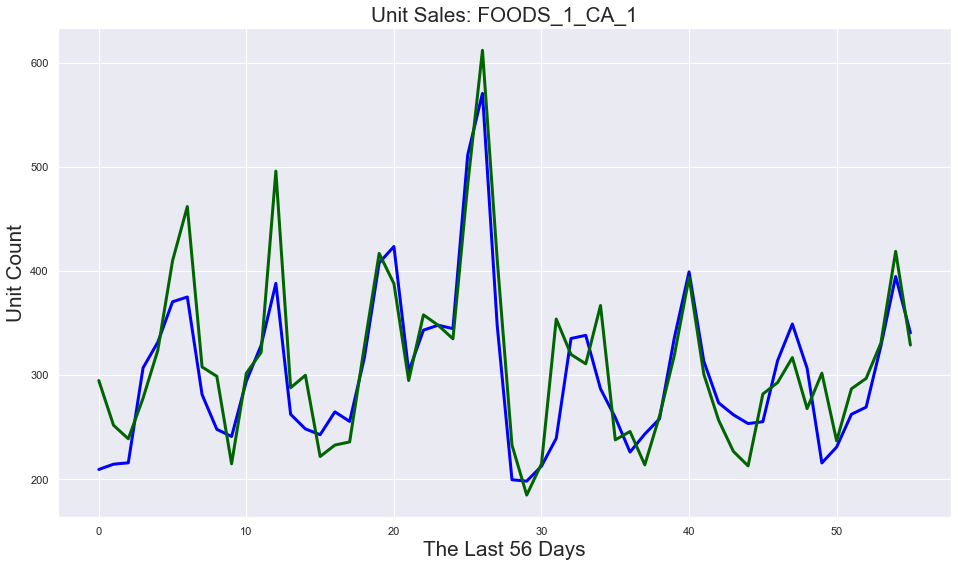

Coefficient of determination: 0.72
RMSE: 62.081


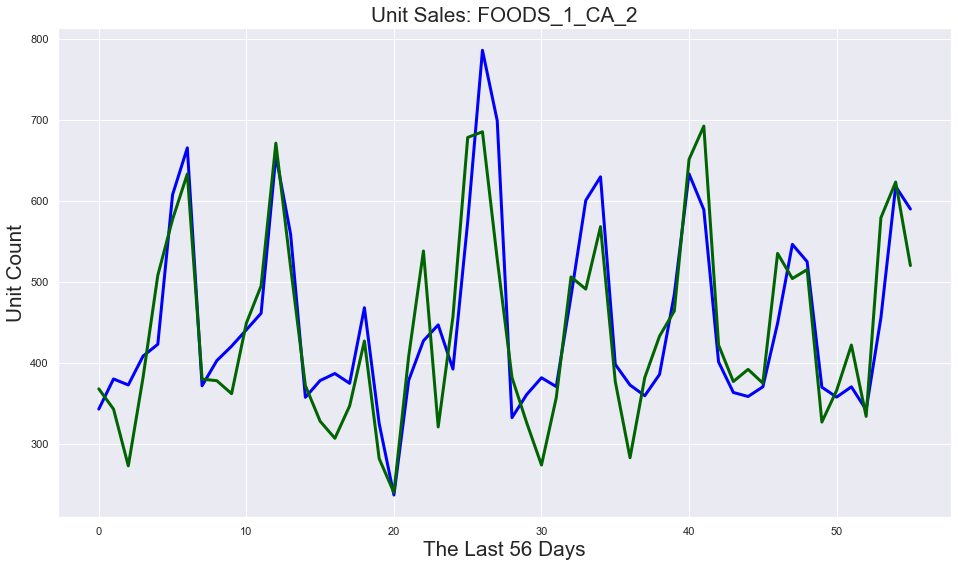

Coefficient of determination: 0.57
RMSE: 60.219


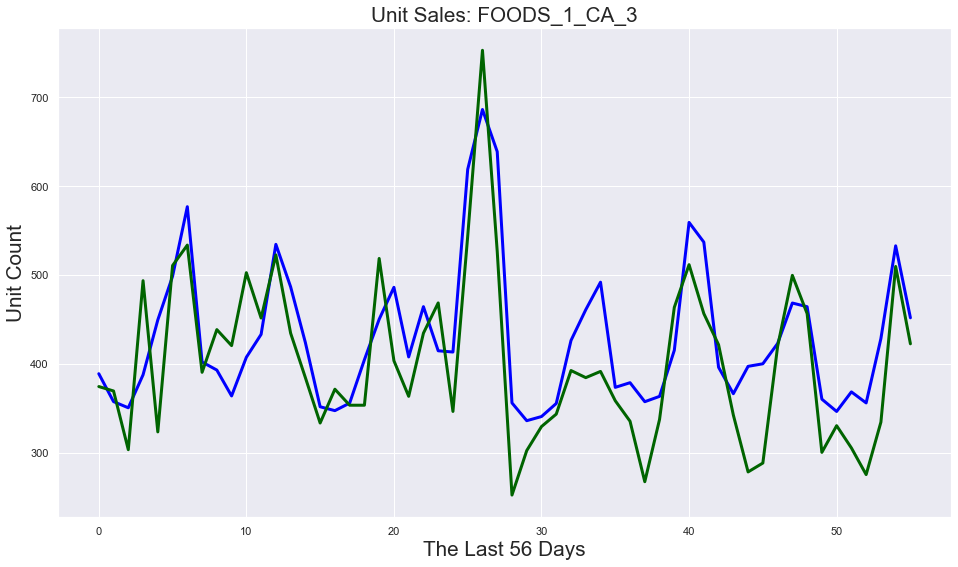

Coefficient of determination: 0.08
RMSE: 36.364


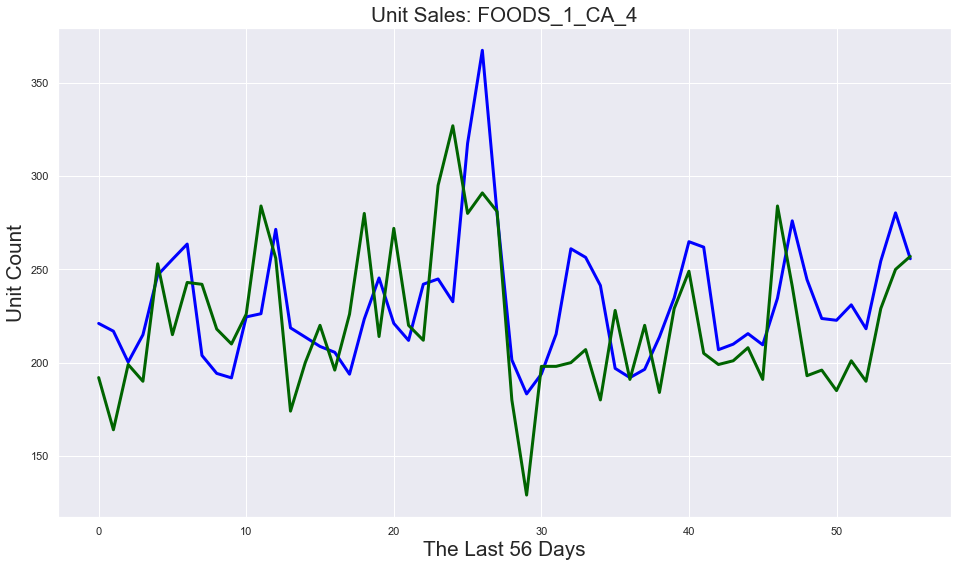

Coefficient of determination: 0.28
RMSE: 38.251


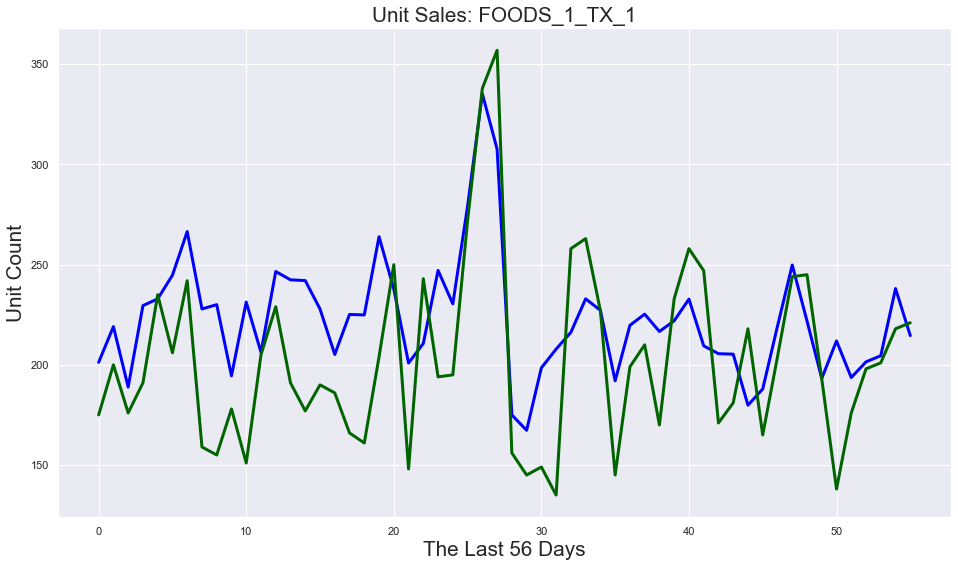

Coefficient of determination: 0.59
RMSE: 37.750


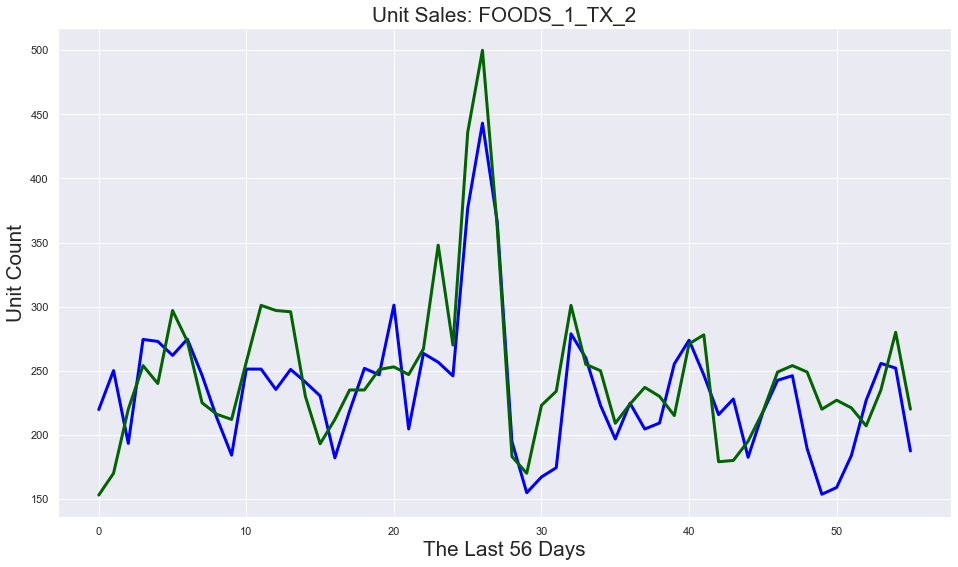

Coefficient of determination: 0.52
RMSE: 38.469


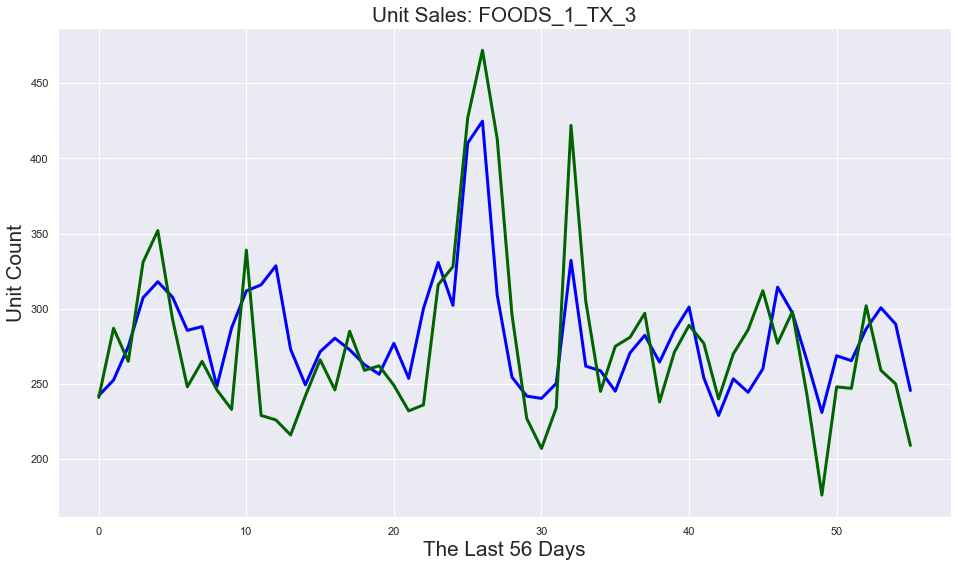

Coefficient of determination: 0.72
RMSE: 53.406


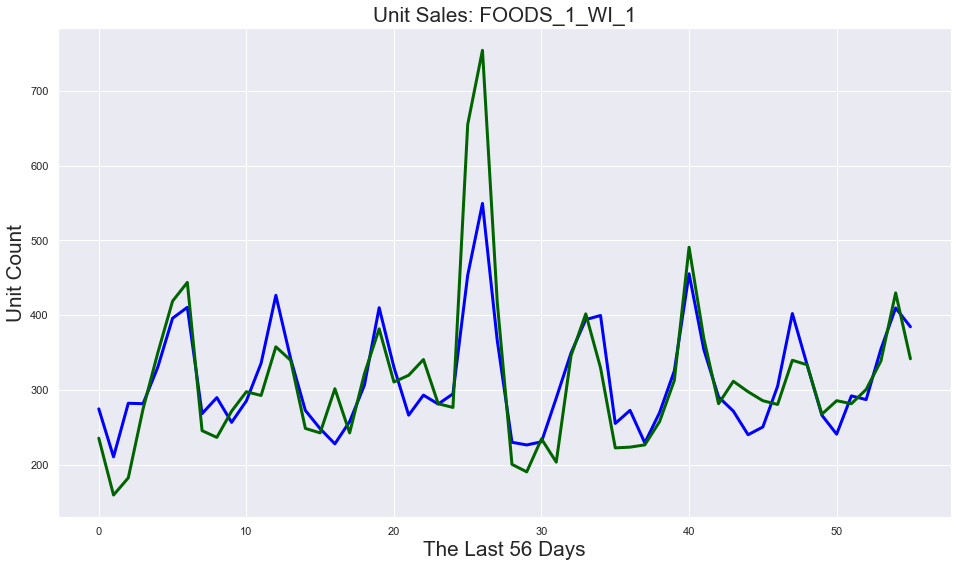

Coefficient of determination: 0.34
RMSE: 60.662


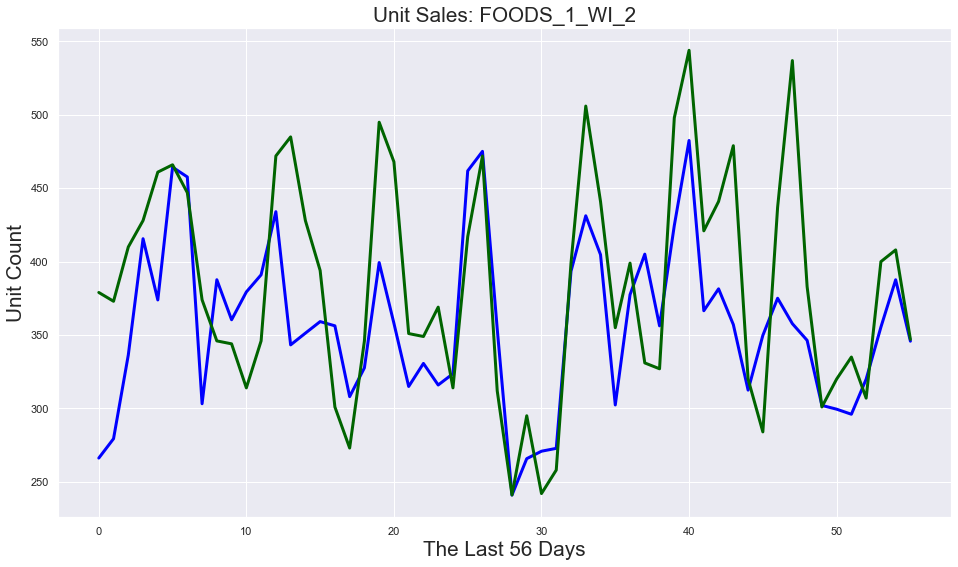

Coefficient of determination: 0.00
RMSE: 63.173


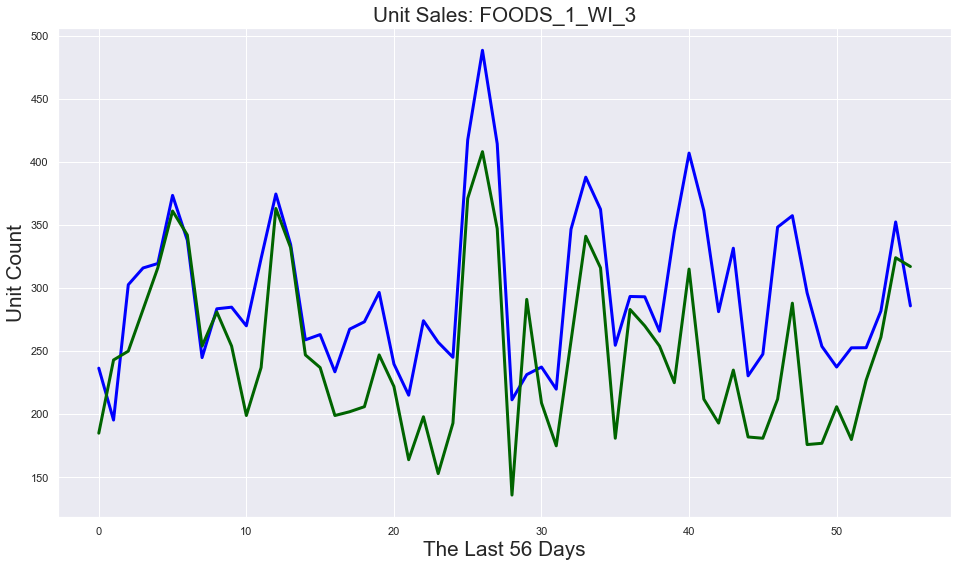

Coefficient of determination: 0.85
RMSE: 51.813


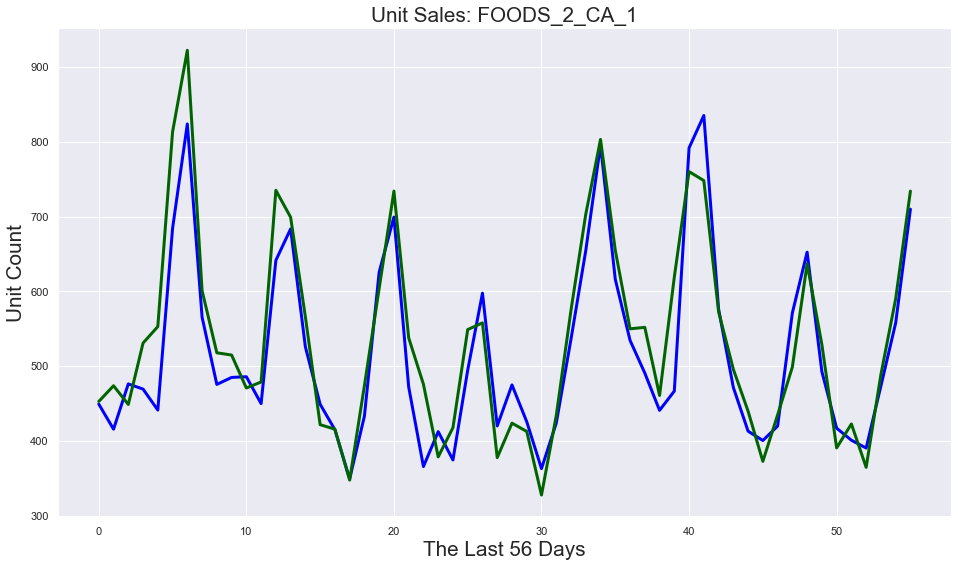

Coefficient of determination: 0.71
RMSE: 82.961


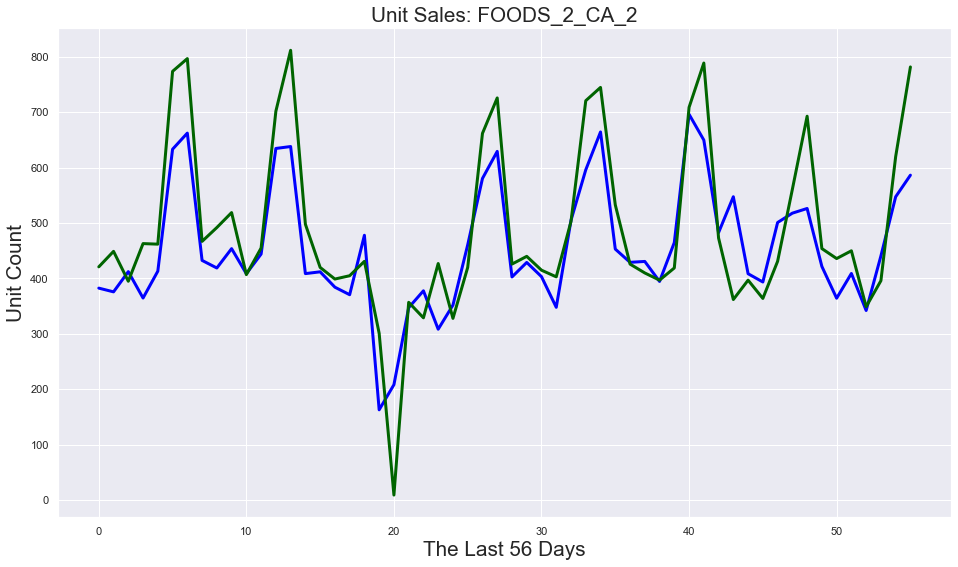

Coefficient of determination: 0.73
RMSE: 68.194


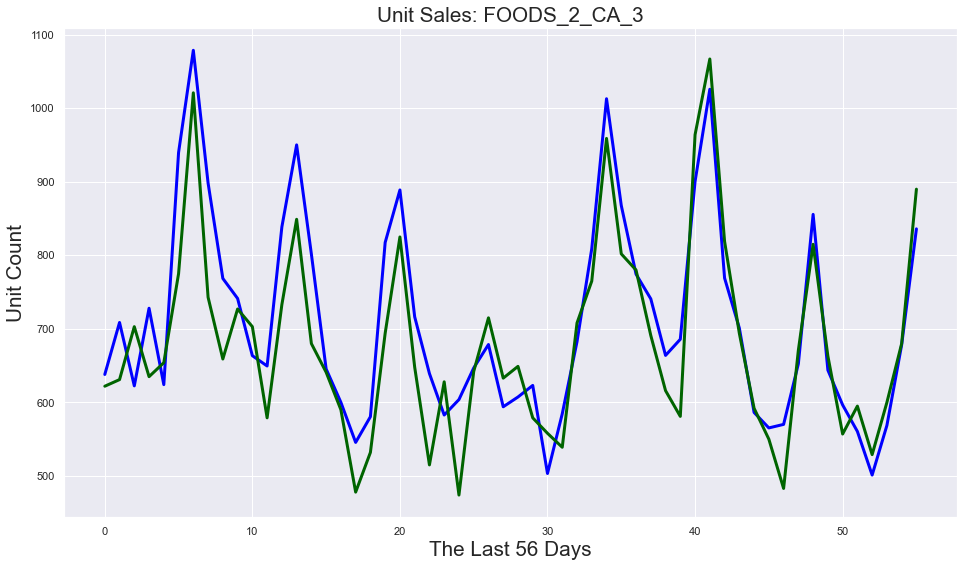

Coefficient of determination: 0.61
RMSE: 39.059


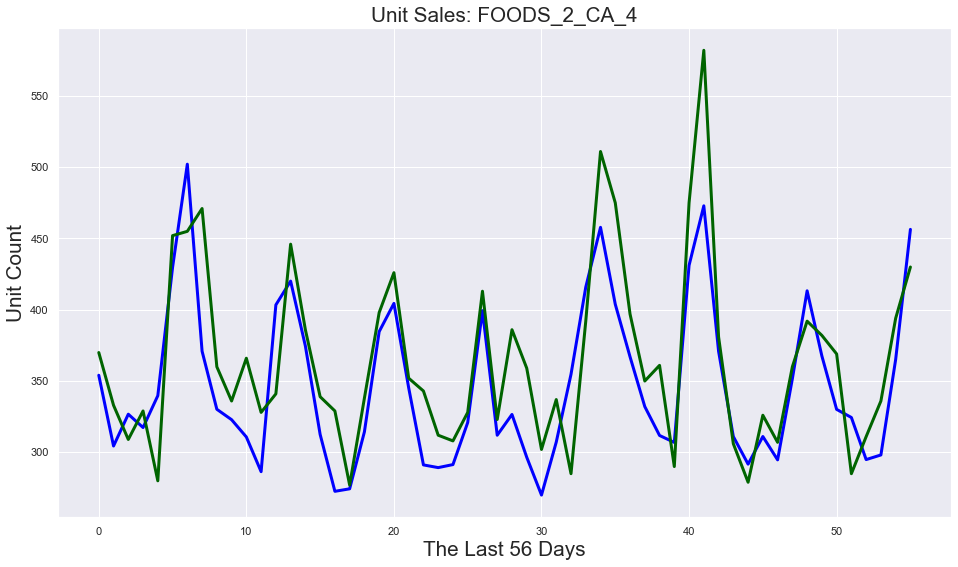

Coefficient of determination: 0.57
RMSE: 42.376


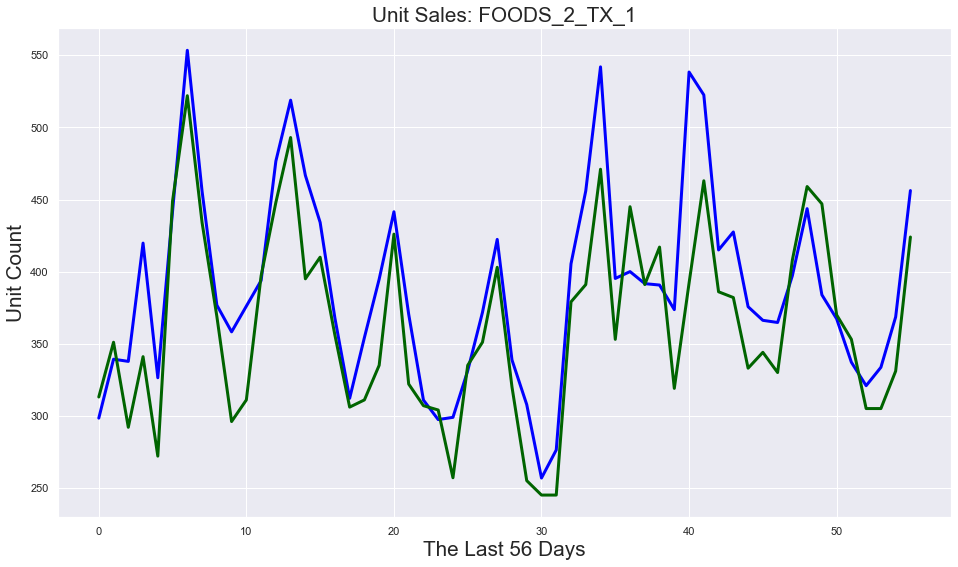

Coefficient of determination: 0.07
RMSE: 70.378


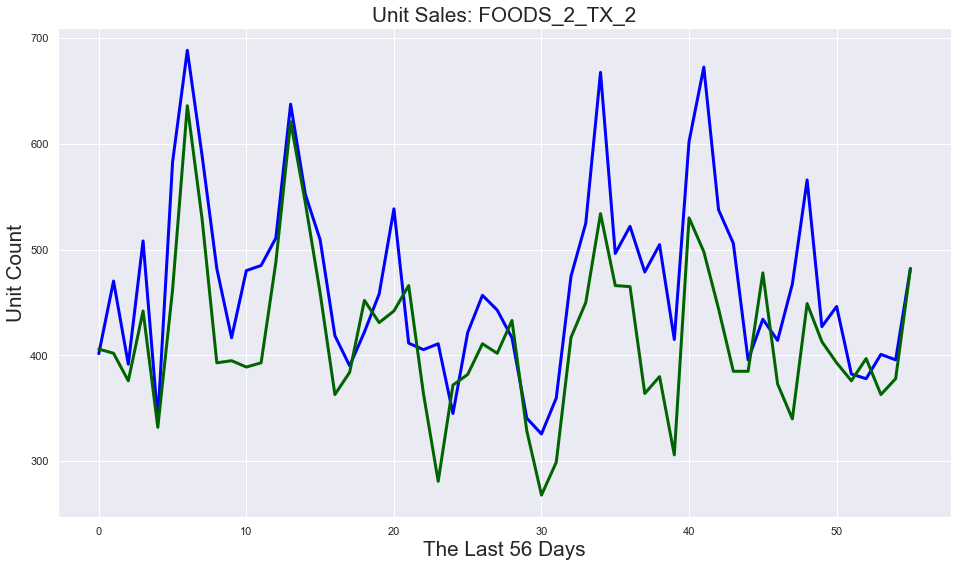

Coefficient of determination: 0.62
RMSE: 57.366


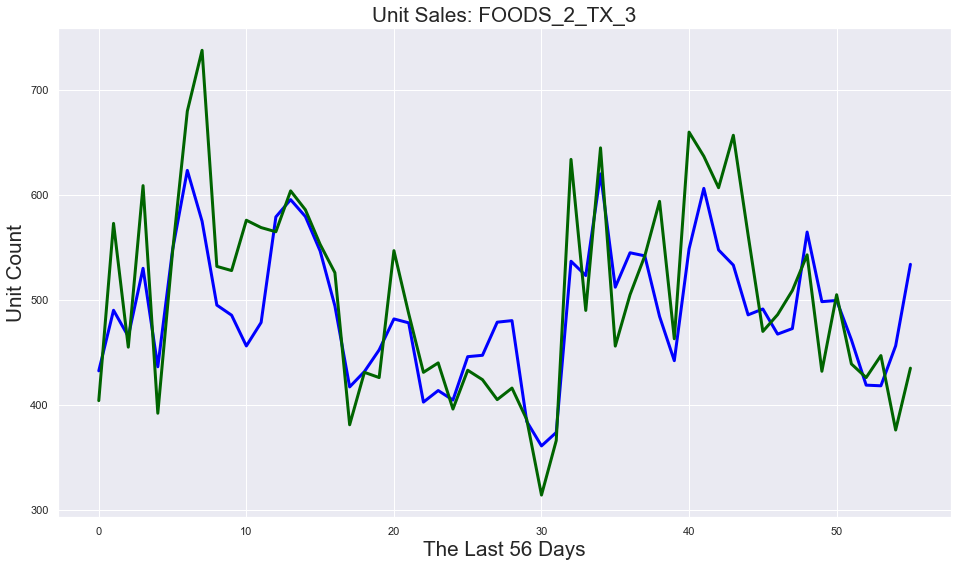

Coefficient of determination: 0.85
RMSE: 67.036


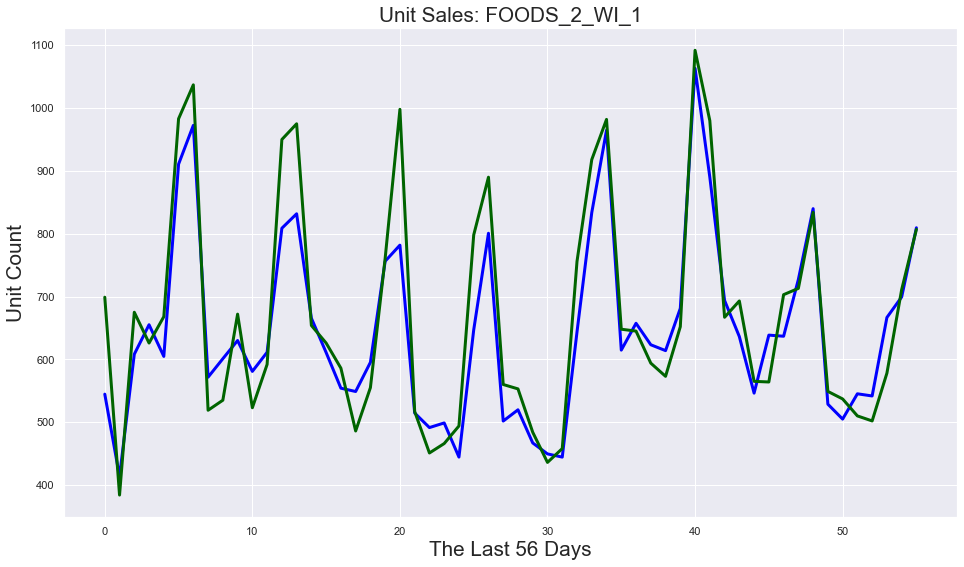

Coefficient of determination: 0.73
RMSE: 184.223


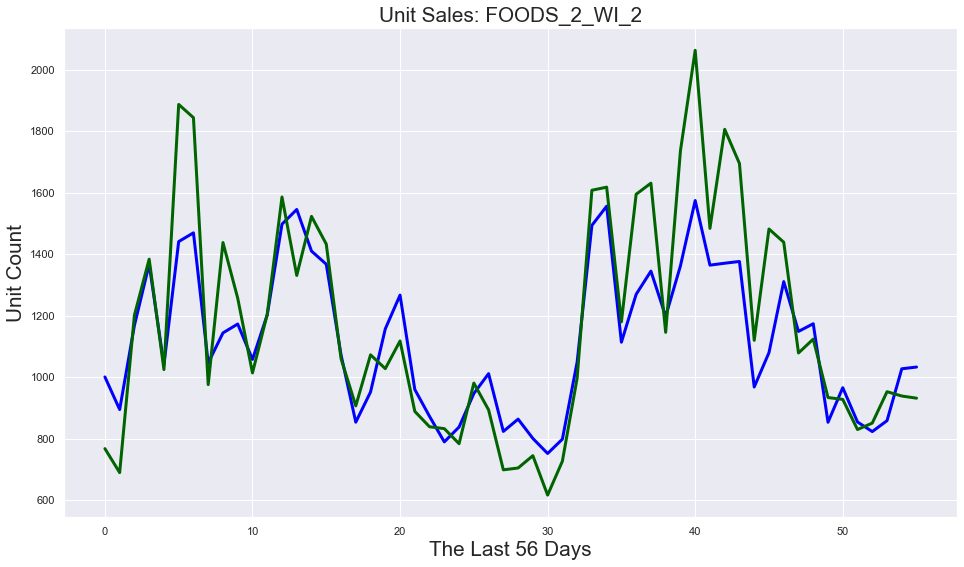

Coefficient of determination: 0.61
RMSE: 92.271


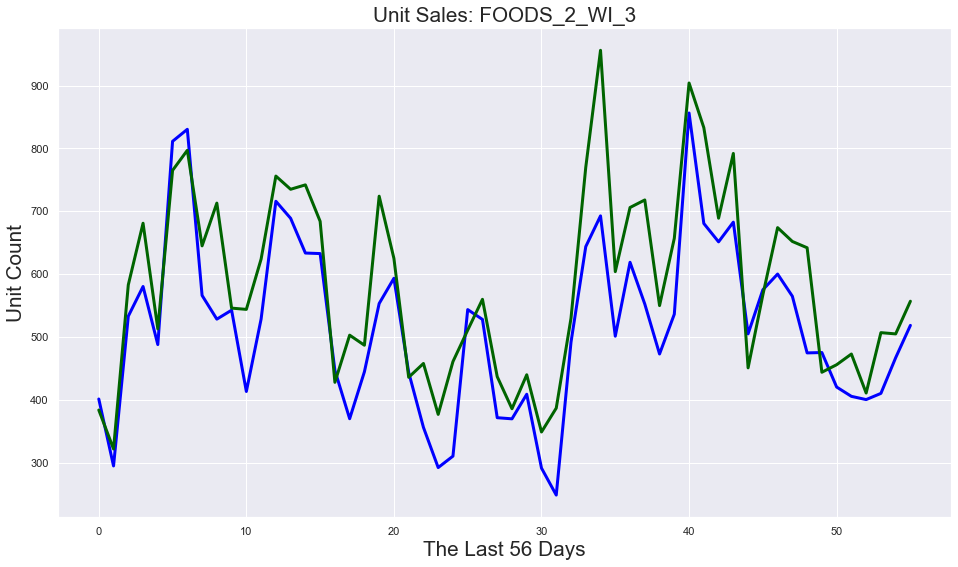

Coefficient of determination: 0.90
RMSE: 148.391


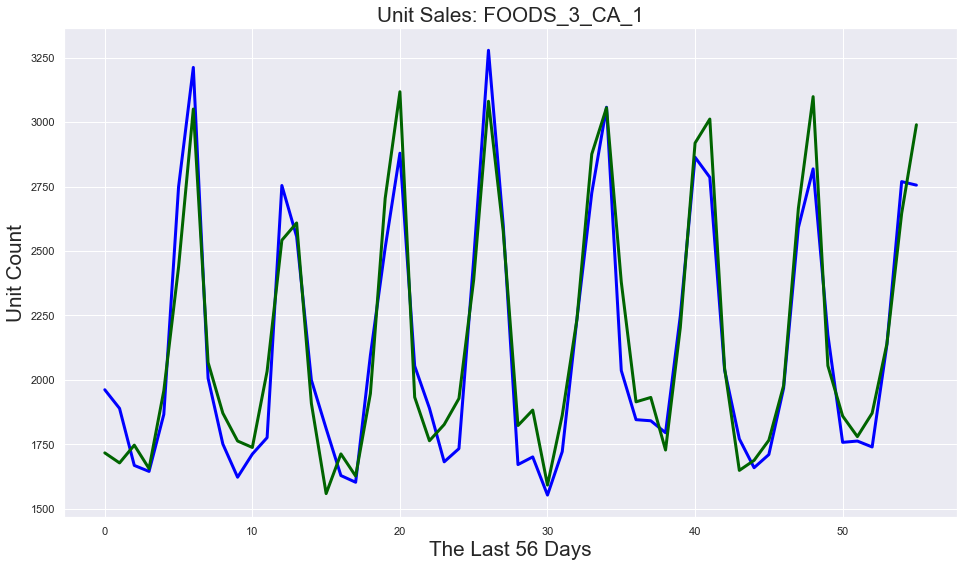

Coefficient of determination: 0.89
RMSE: 163.354


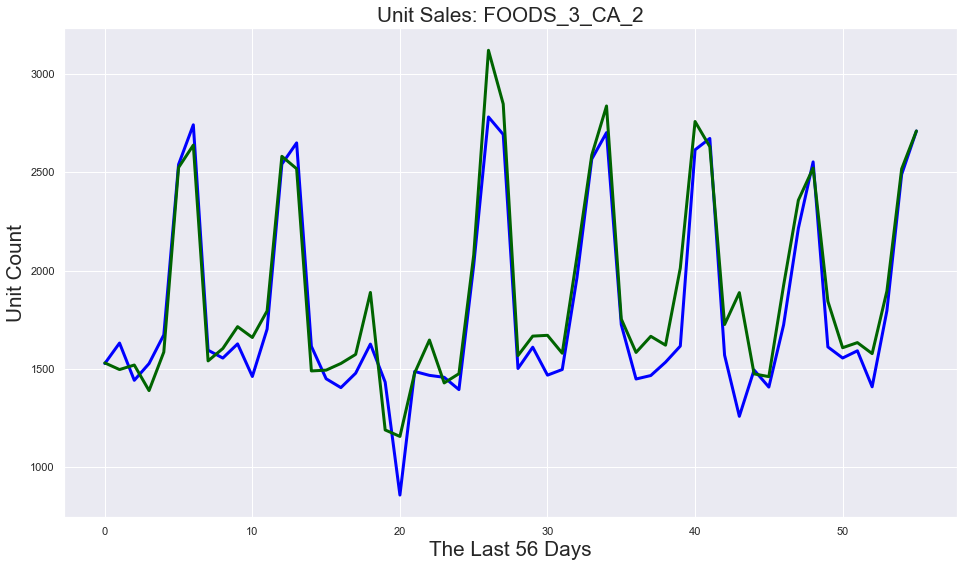

Coefficient of determination: 0.59
RMSE: 298.738


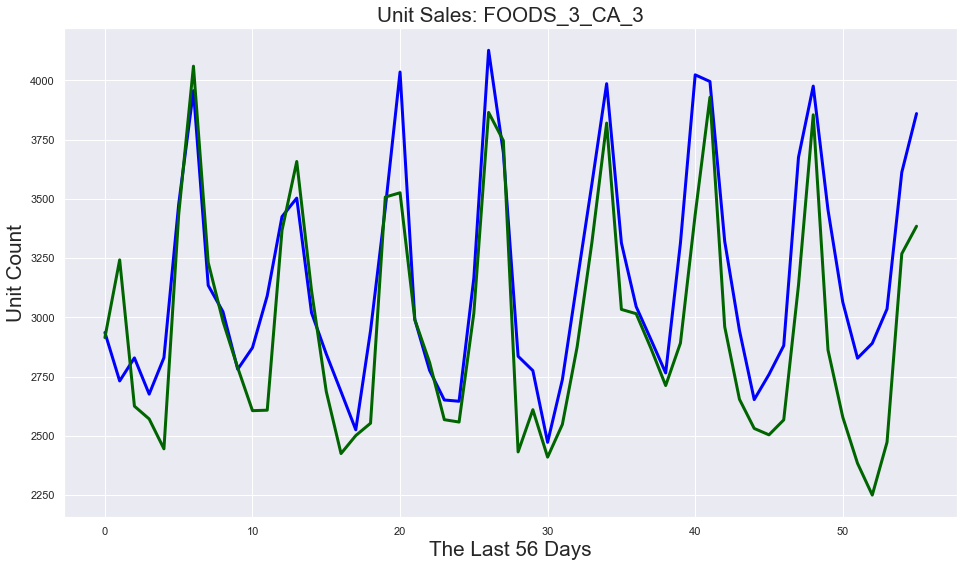

Coefficient of determination: 0.63
RMSE: 95.337


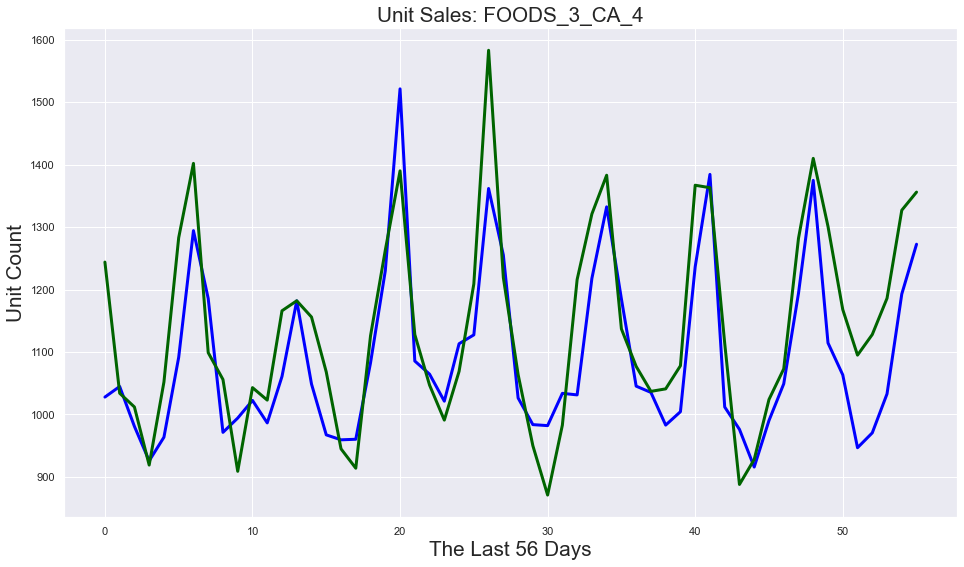

Coefficient of determination: 0.58
RMSE: 169.569


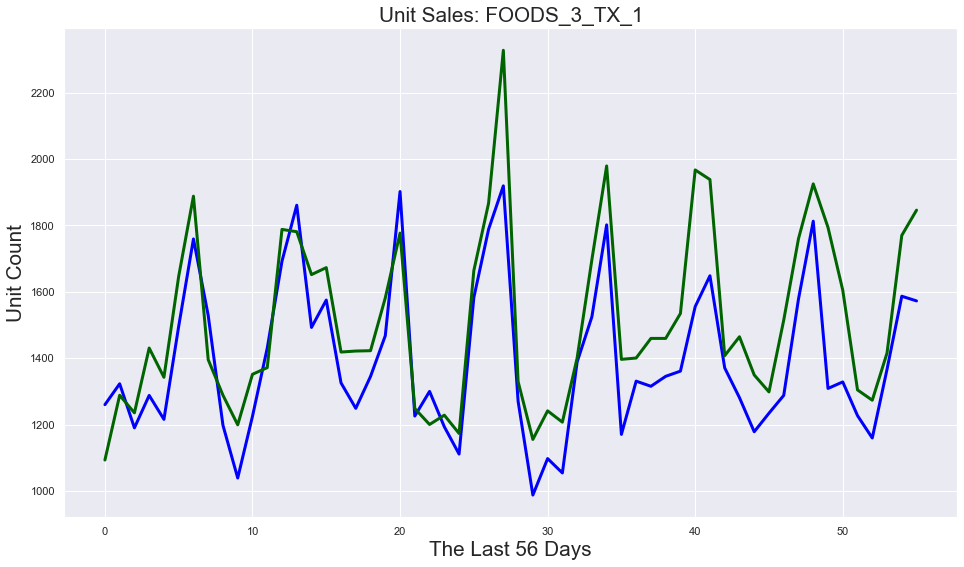

Coefficient of determination: 0.83
RMSE: 143.678


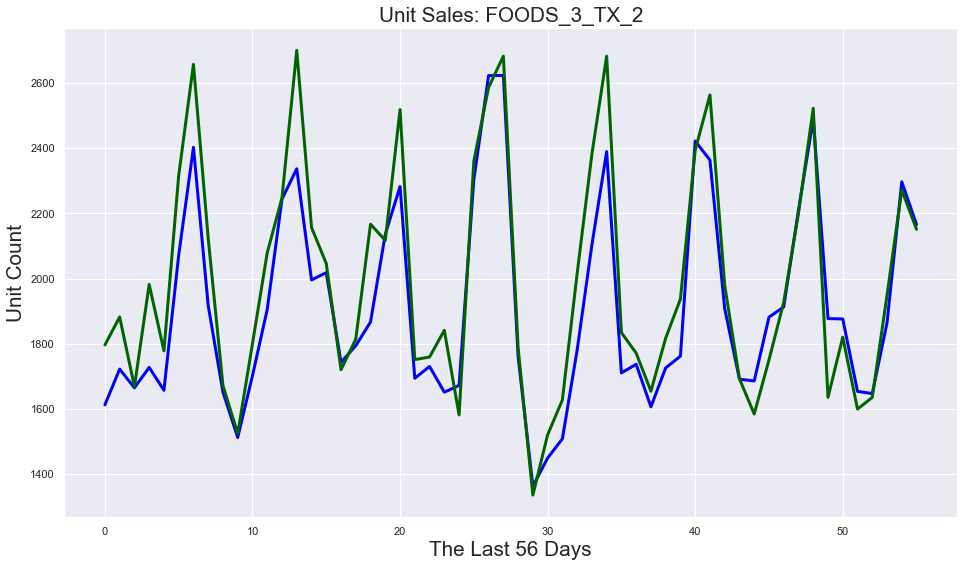

Coefficient of determination: 0.55
RMSE: 150.121


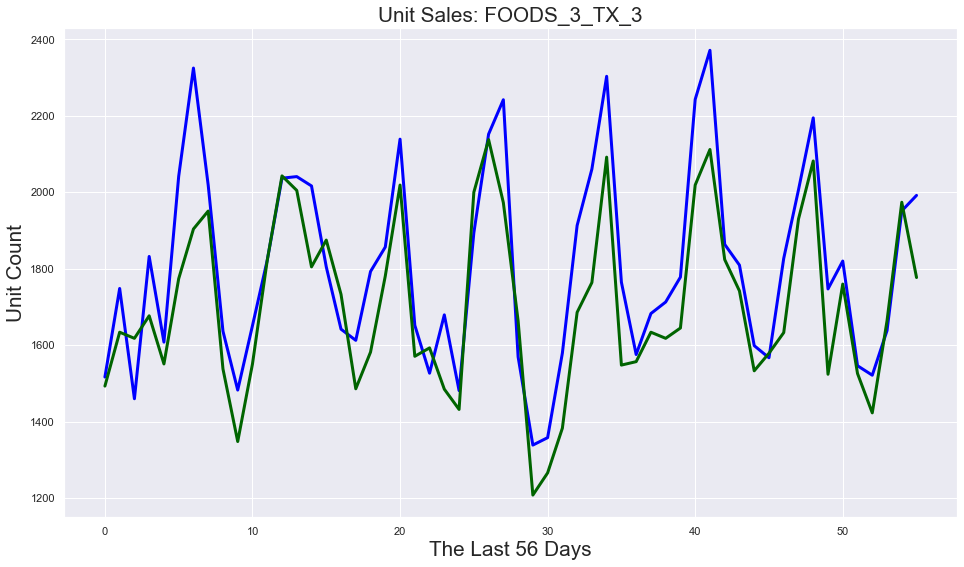

Coefficient of determination: 0.86
RMSE: 153.313


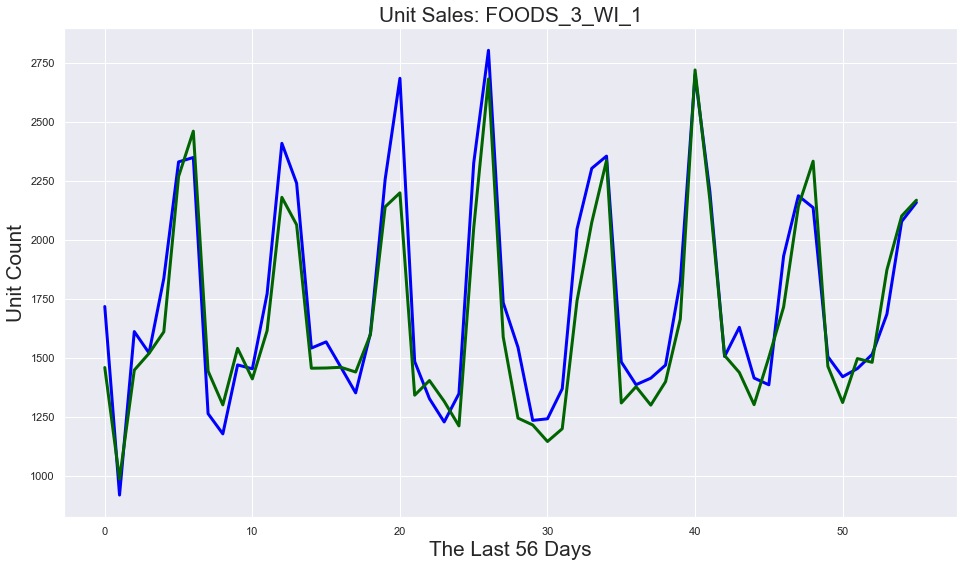

Coefficient of determination: 0.76
RMSE: 216.456


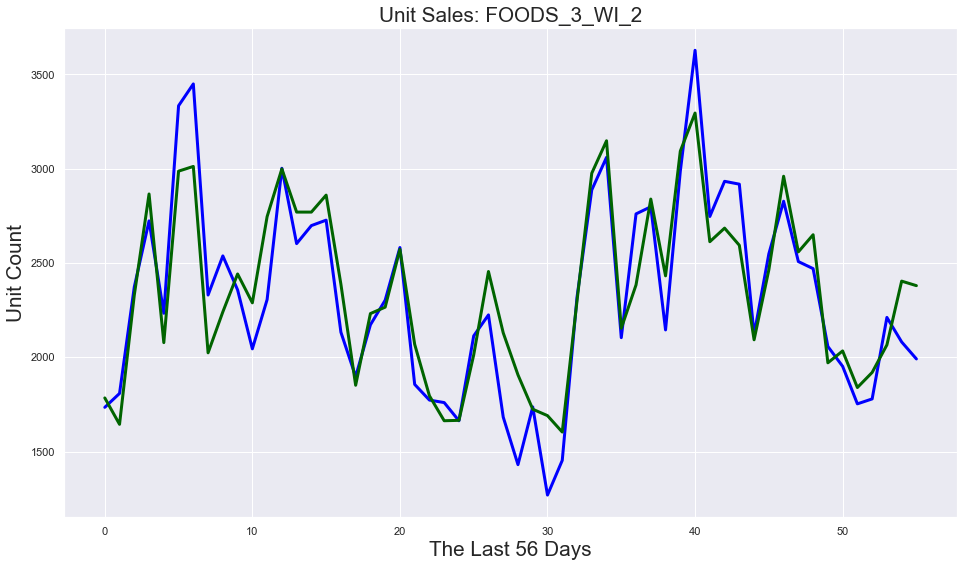

Coefficient of determination: 0.78
RMSE: 195.485


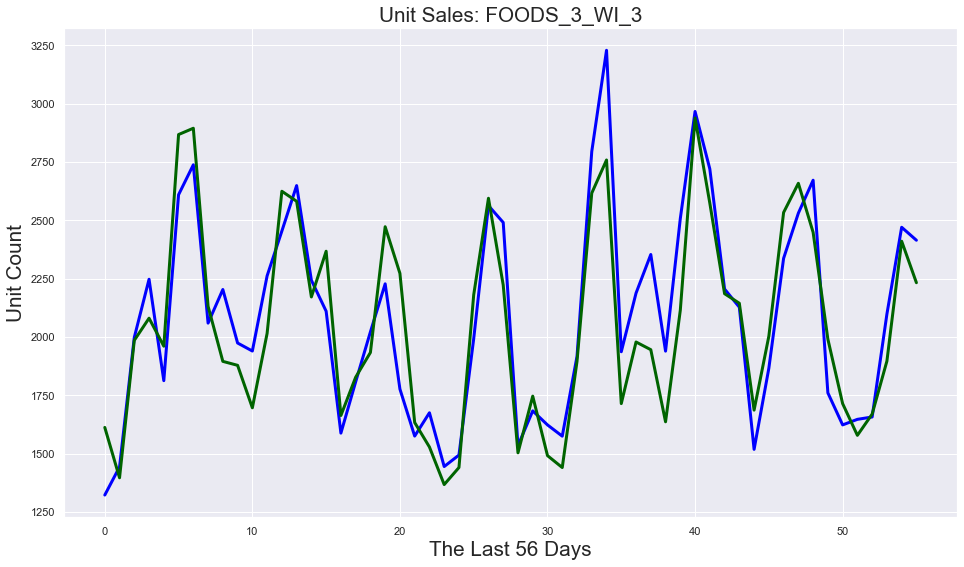

Coefficient of determination: 0.42
RMSE: 83.121


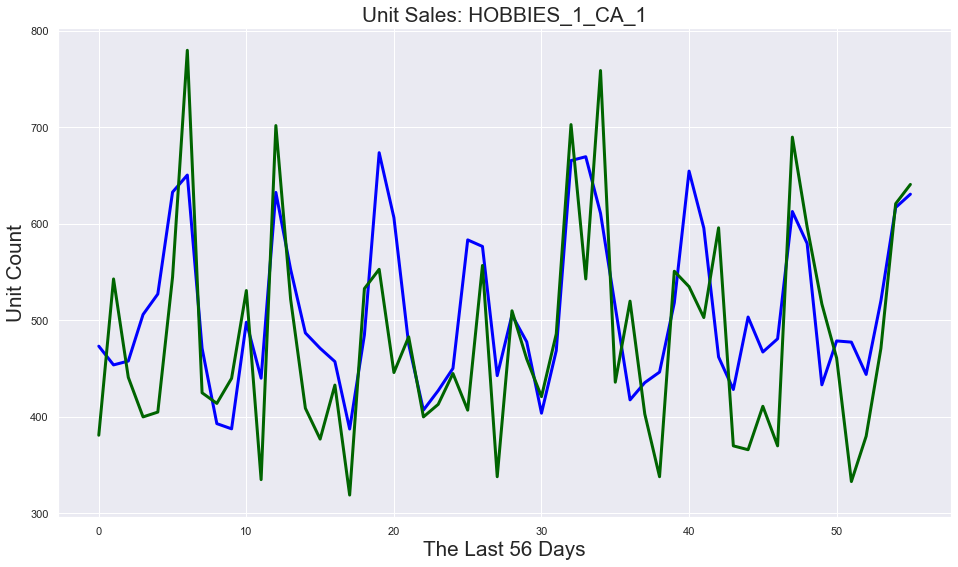

Coefficient of determination: 0.62
RMSE: 58.687


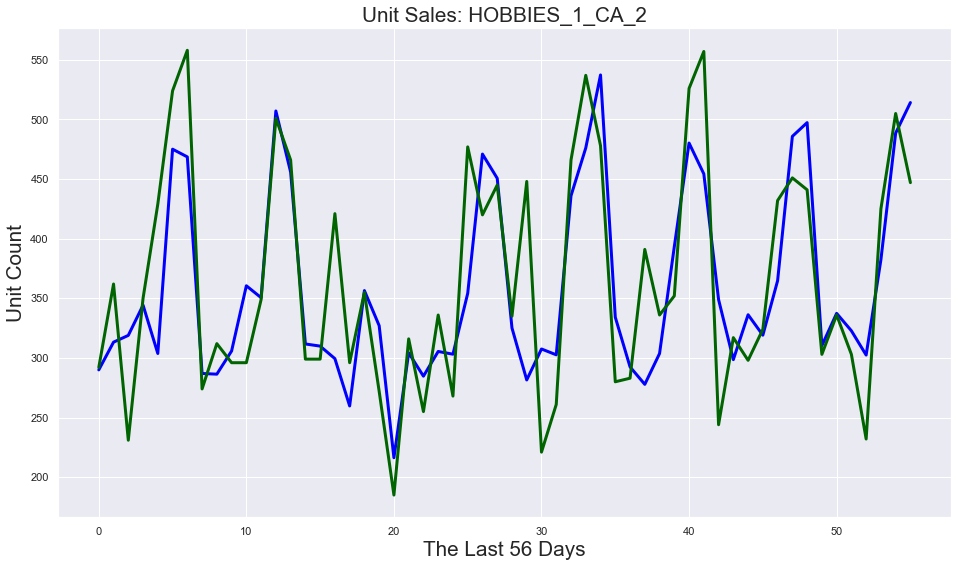

Coefficient of determination: 0.27
RMSE: 76.159


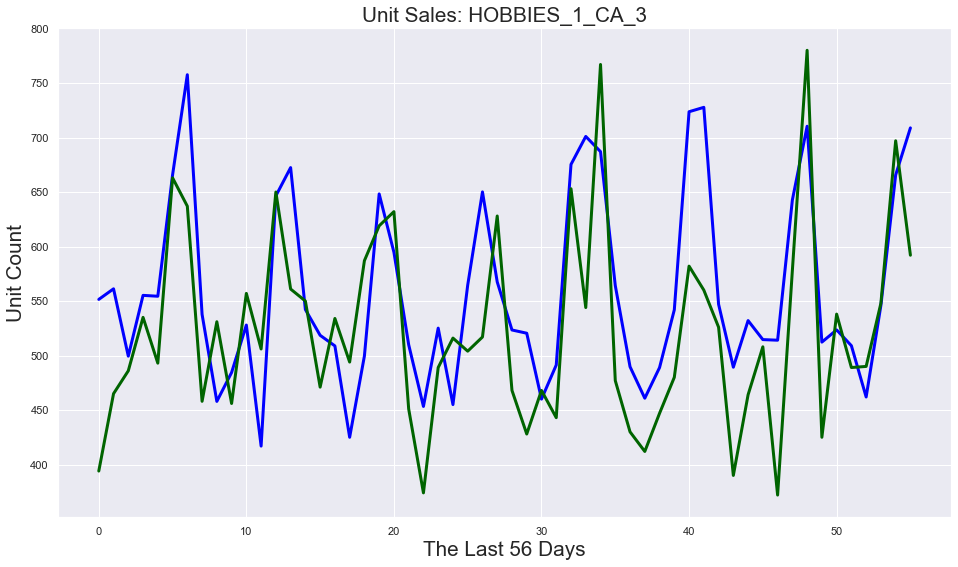

Coefficient of determination: -0.50
RMSE: 73.206


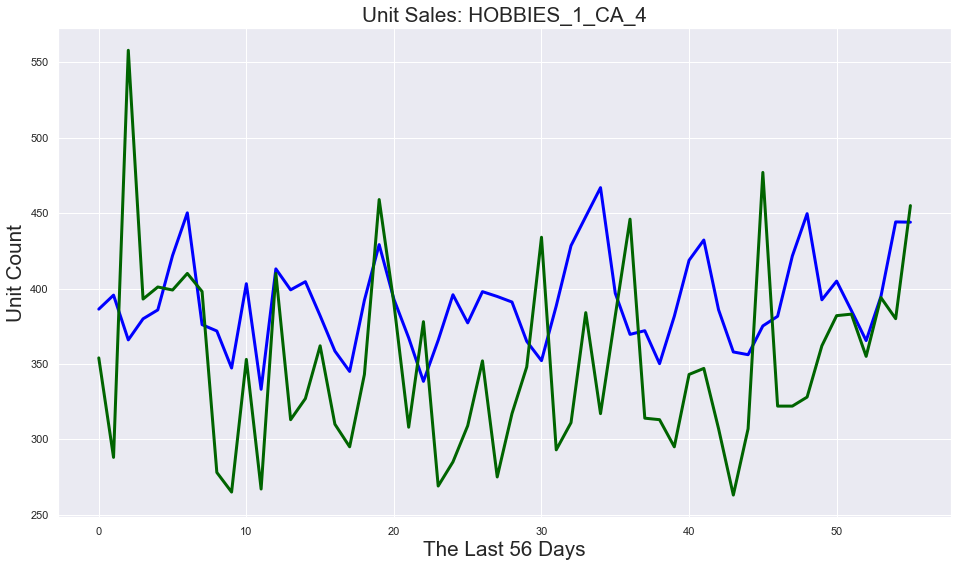

Coefficient of determination: 0.49
RMSE: 42.345


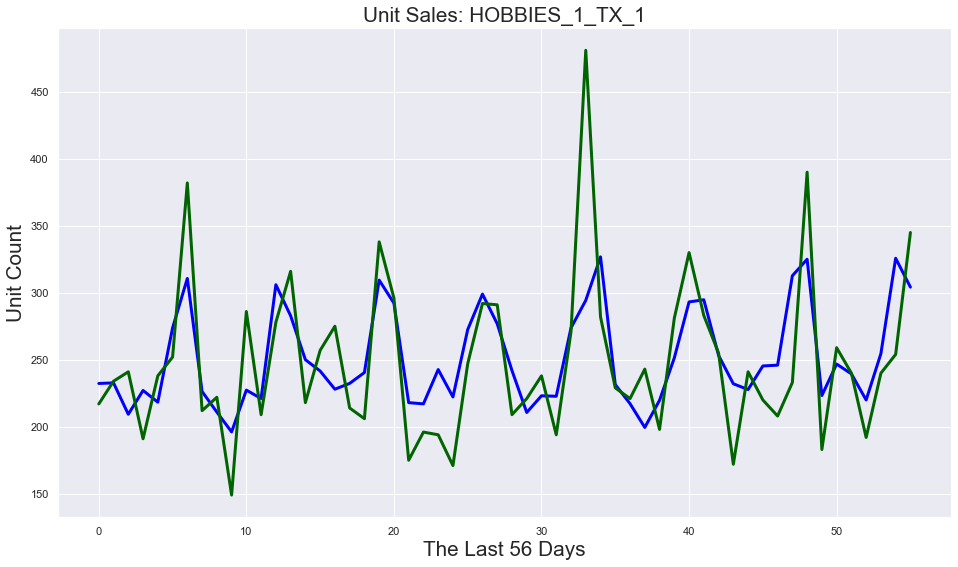

Coefficient of determination: 0.20
RMSE: 45.470


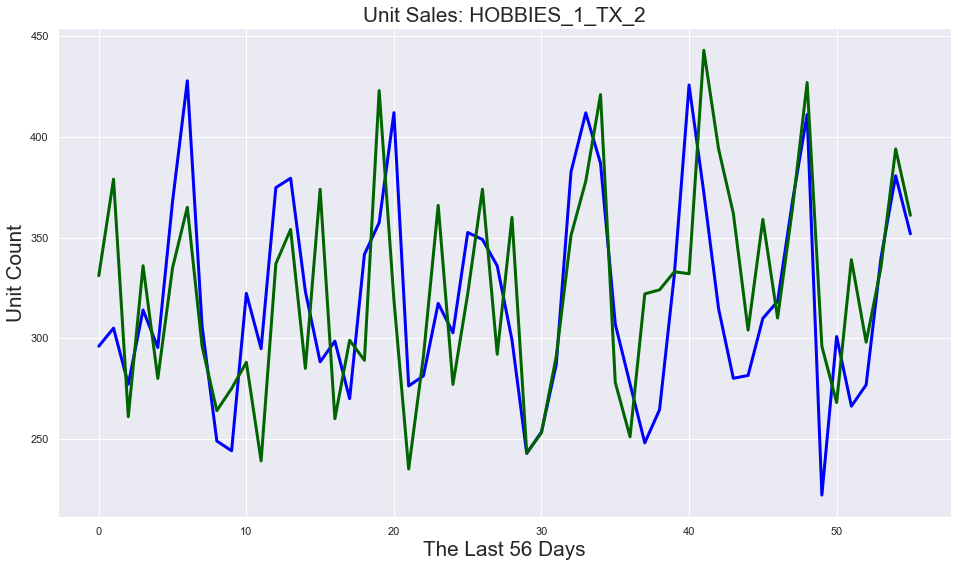

Coefficient of determination: 0.40
RMSE: 46.903


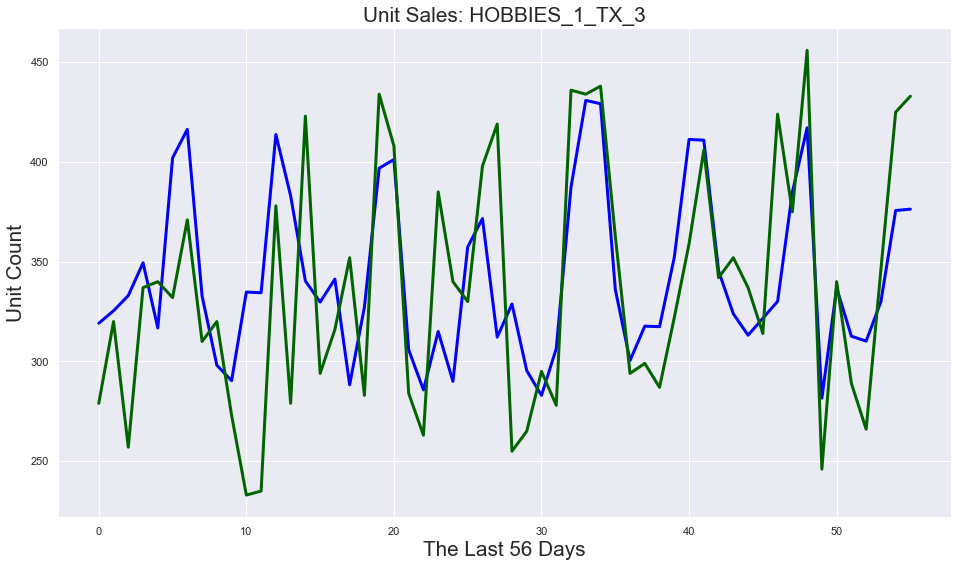

Coefficient of determination: 0.70
RMSE: 66.155


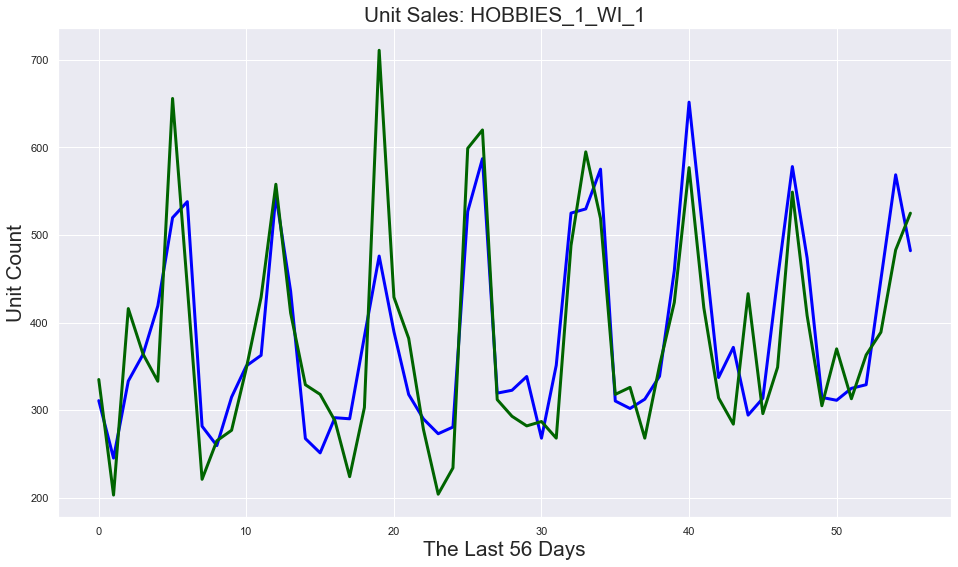

Coefficient of determination: 0.13
RMSE: 44.091


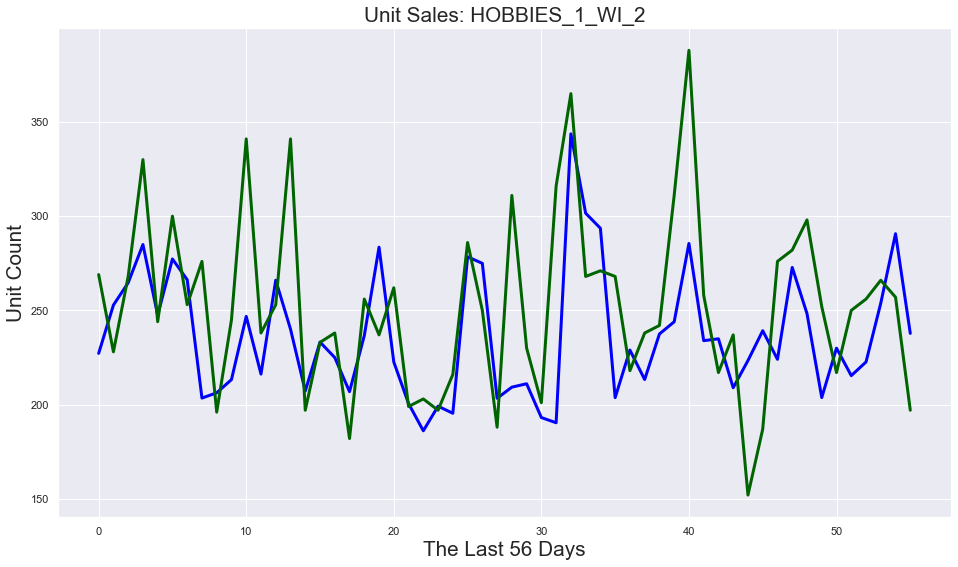

Coefficient of determination: 0.33
RMSE: 48.998


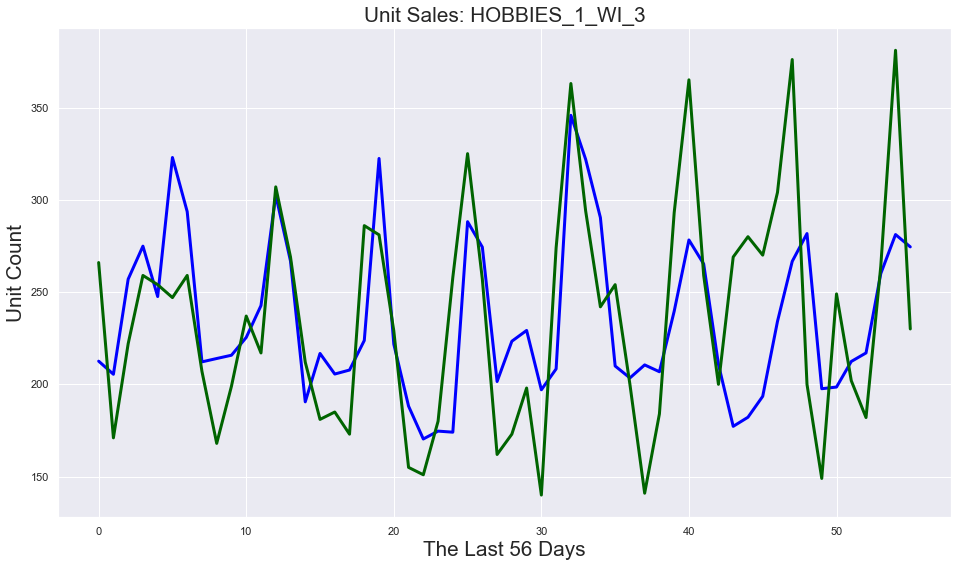

Coefficient of determination: 0.02
RMSE: 12.875


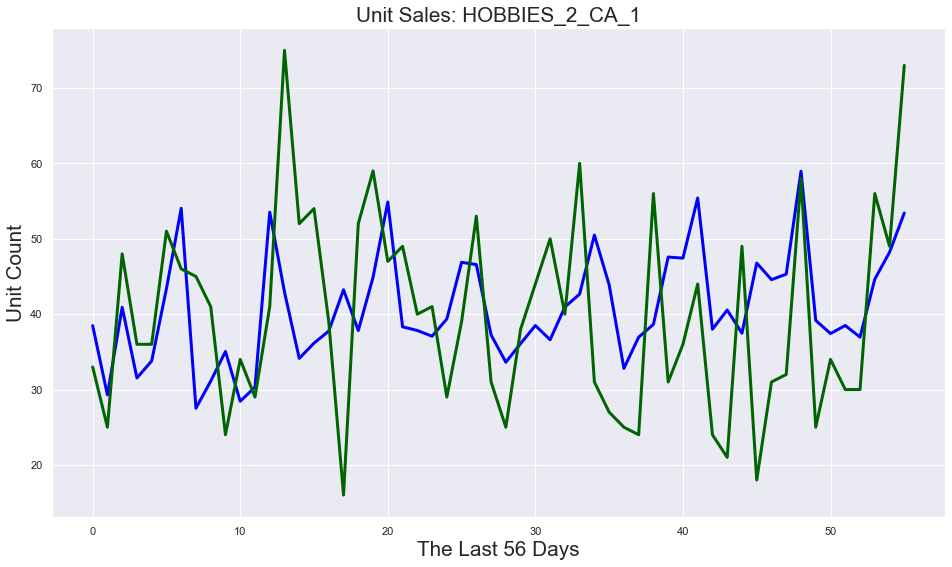

Coefficient of determination: -0.20
RMSE: 12.177


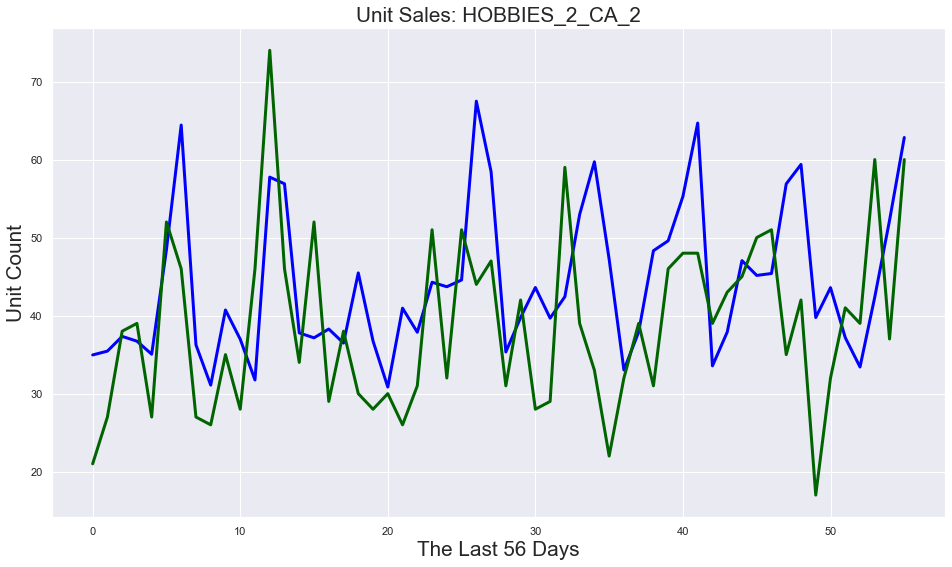

Coefficient of determination: 0.03
RMSE: 11.756


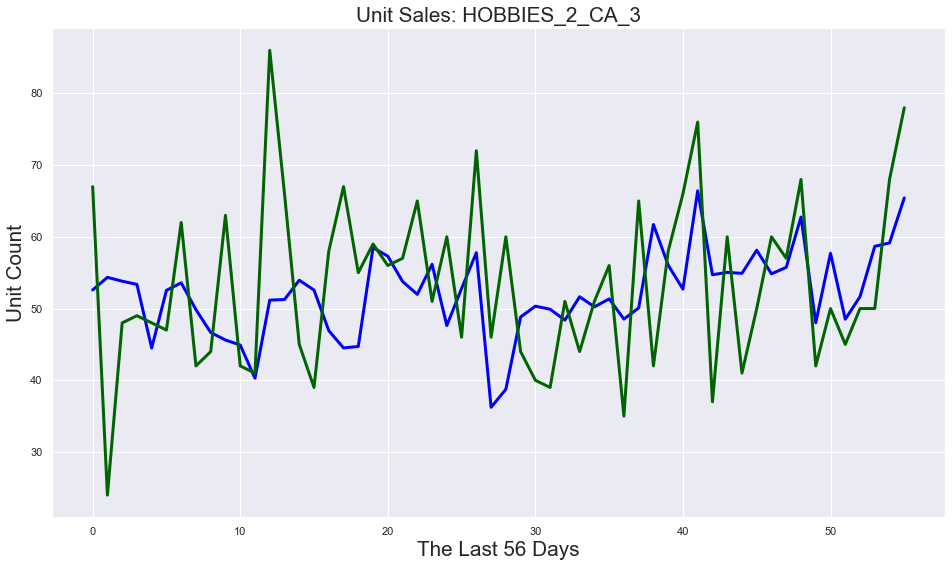

Coefficient of determination: -0.35
RMSE: 6.110


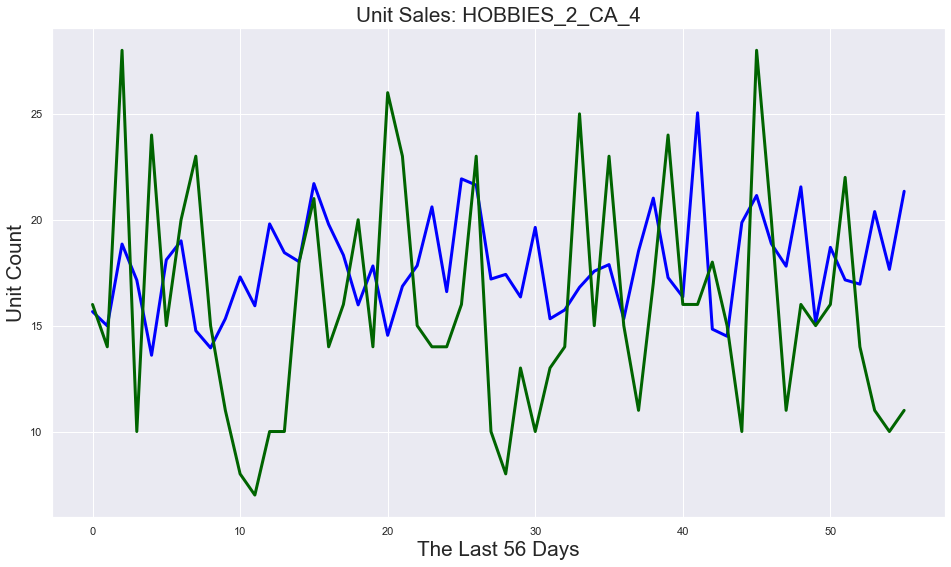

Coefficient of determination: -0.54
RMSE: 12.923


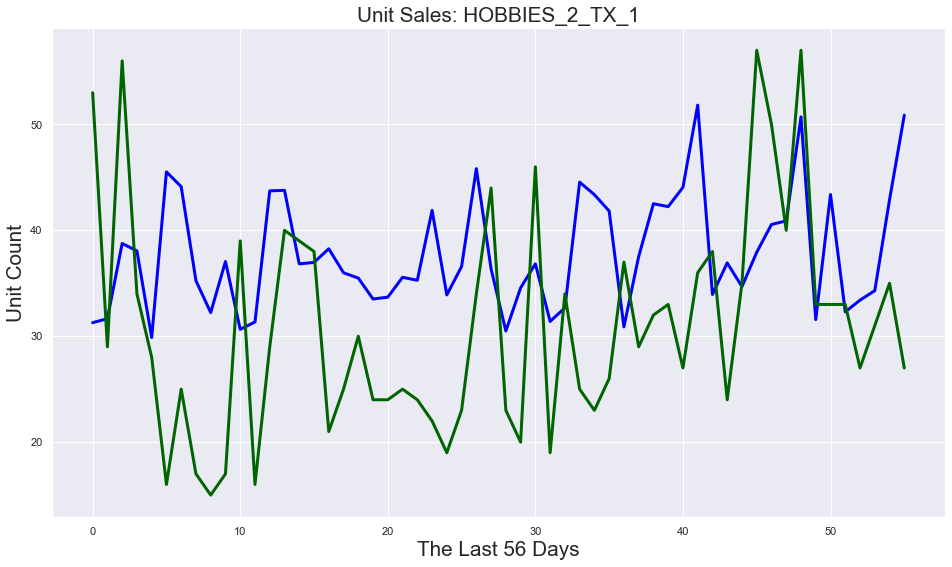

Coefficient of determination: -0.06
RMSE: 17.423


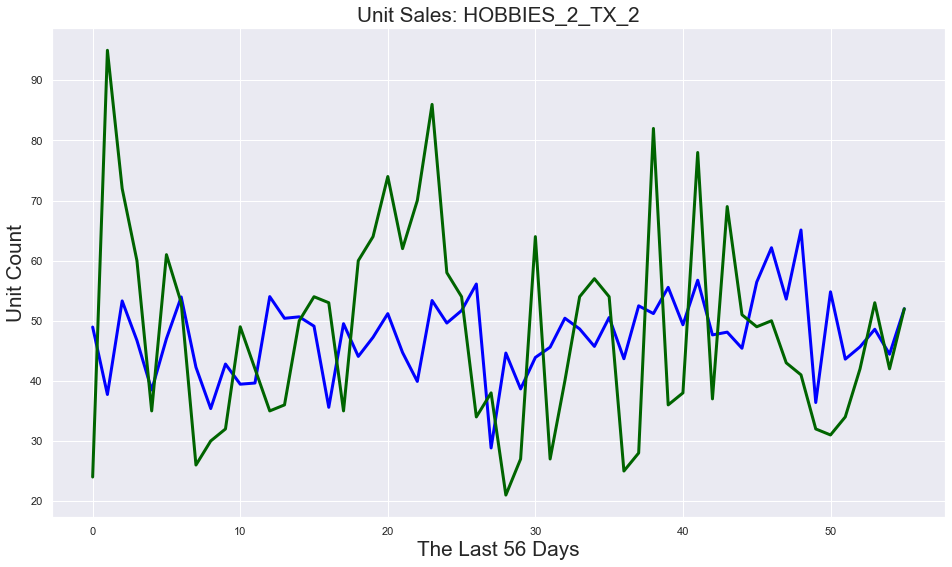

Coefficient of determination: -0.33
RMSE: 17.713


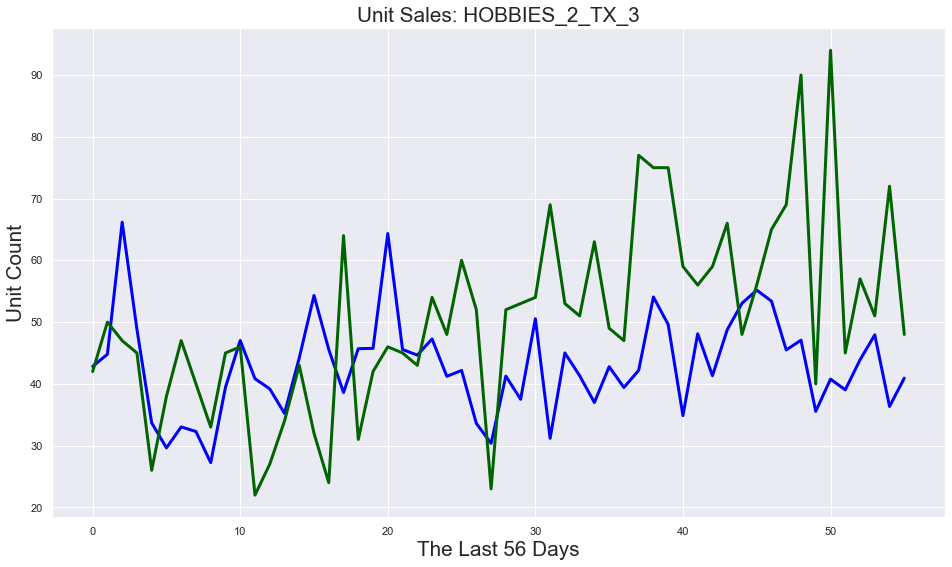

Coefficient of determination: 0.22
RMSE: 10.337


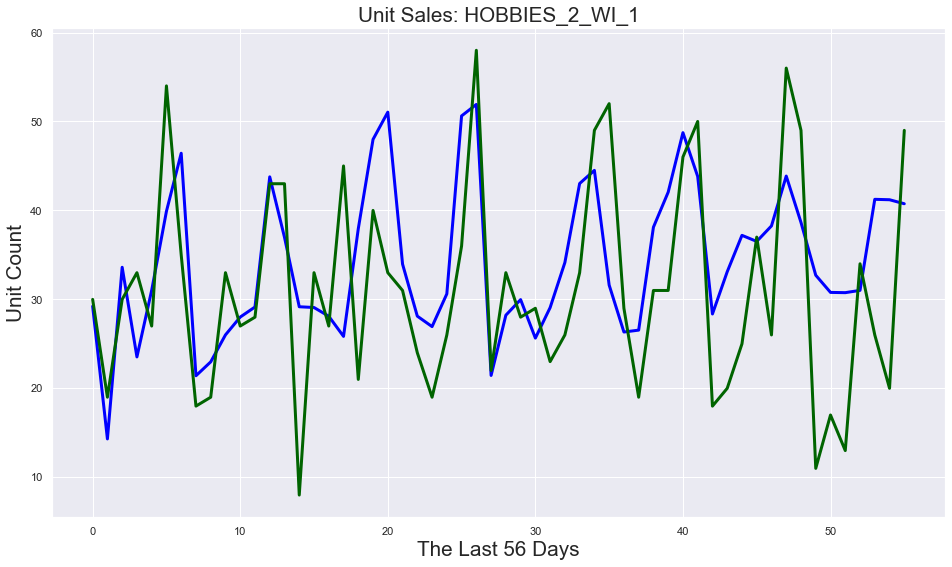

Coefficient of determination: -0.07
RMSE: 10.525


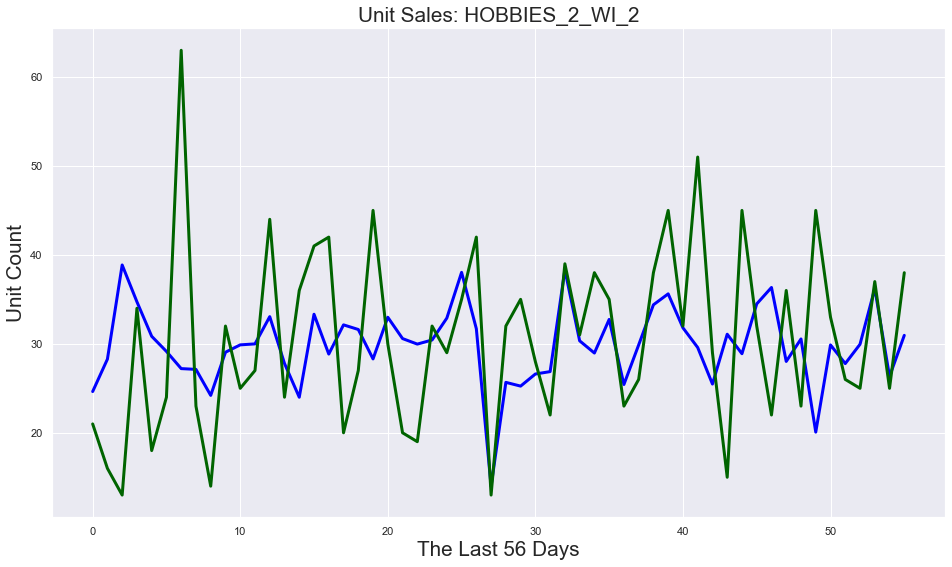

Coefficient of determination: -0.07
RMSE: 11.713


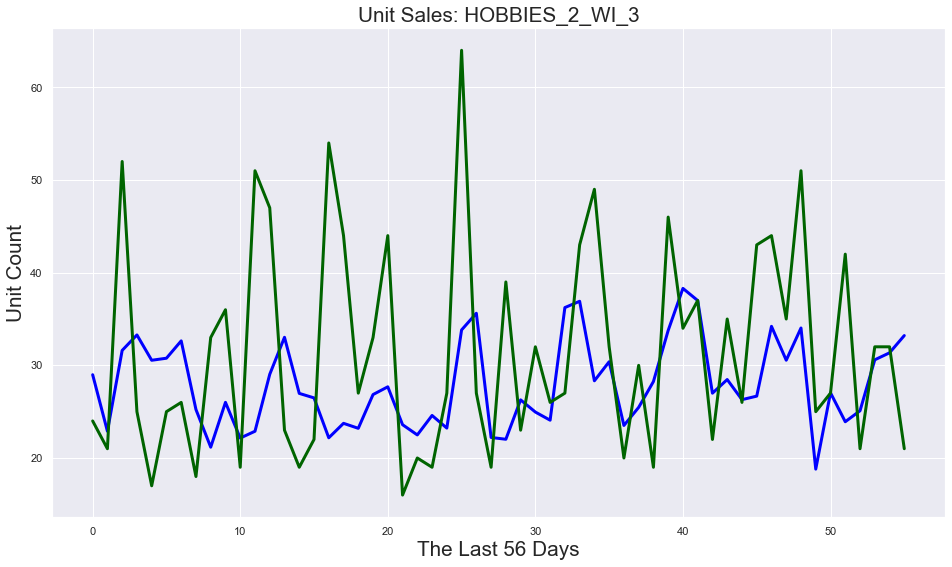

Coefficient of determination: 0.76
RMSE: 94.106


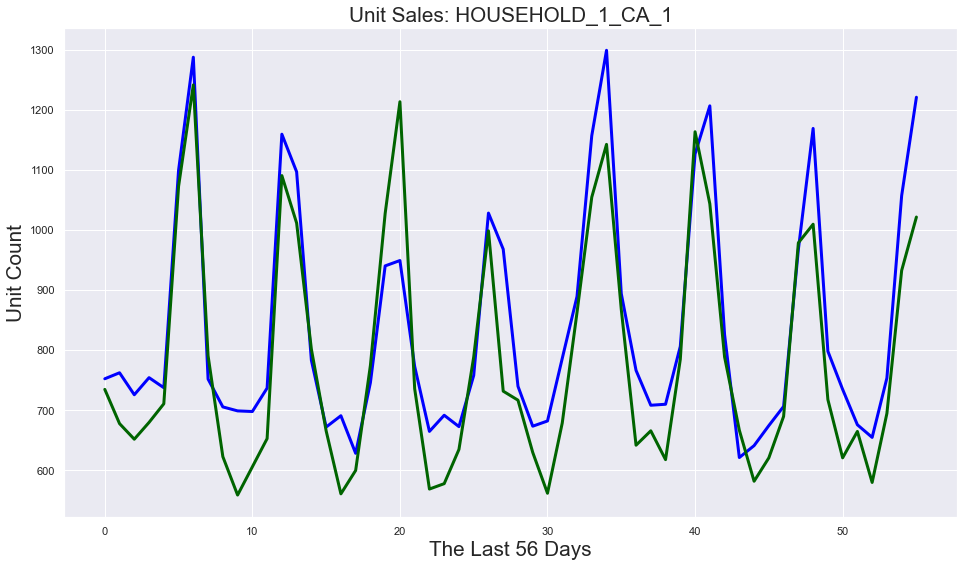

Coefficient of determination: 0.91
RMSE: 75.340


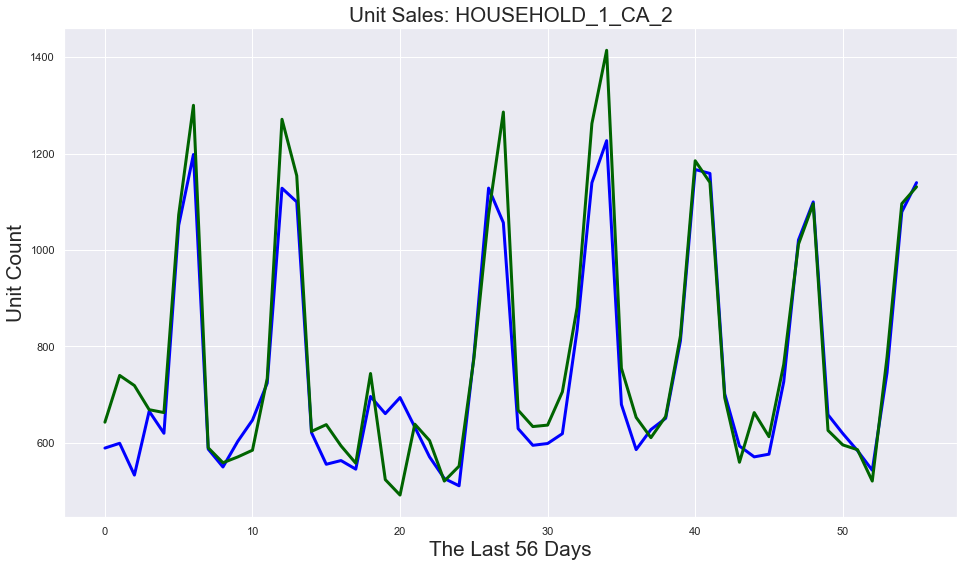

Coefficient of determination: 0.83
RMSE: 110.213


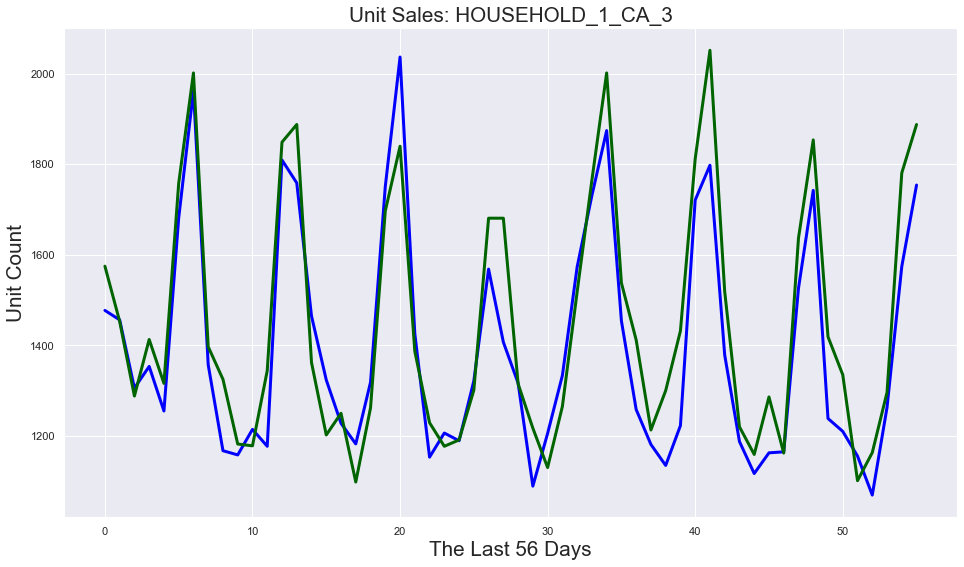

Coefficient of determination: 0.64
RMSE: 40.014


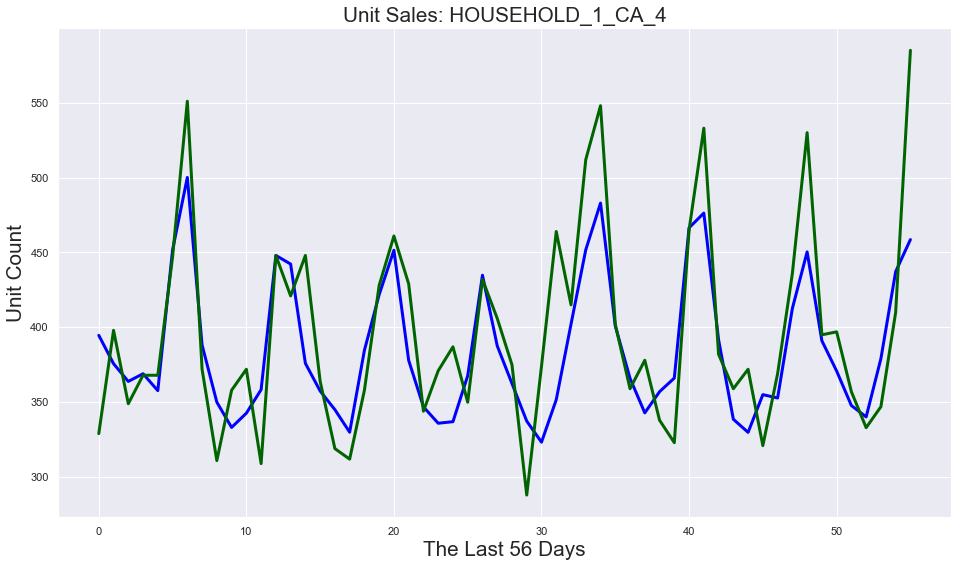

Coefficient of determination: 0.76
RMSE: 65.371


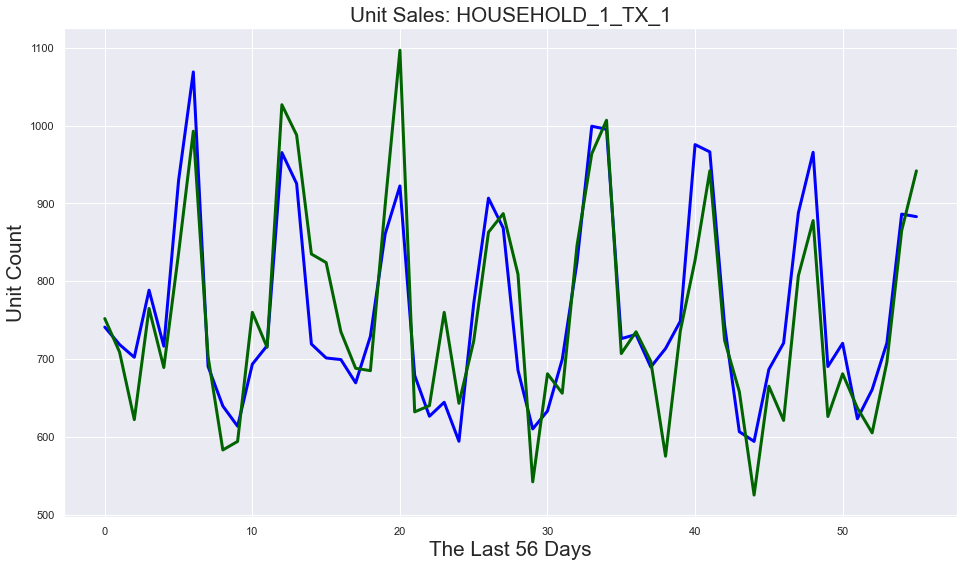

Coefficient of determination: 0.61
RMSE: 80.404


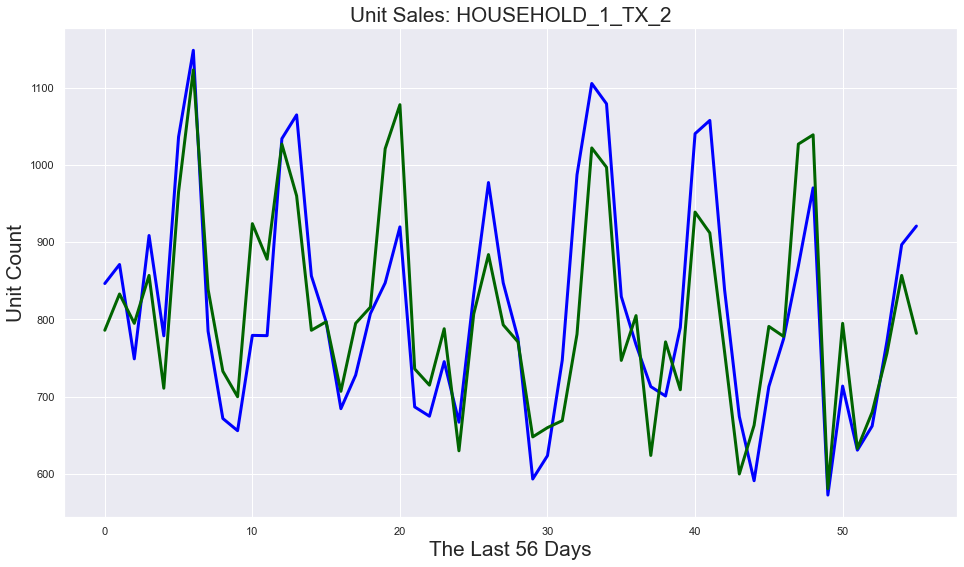

Coefficient of determination: 0.55
RMSE: 76.082


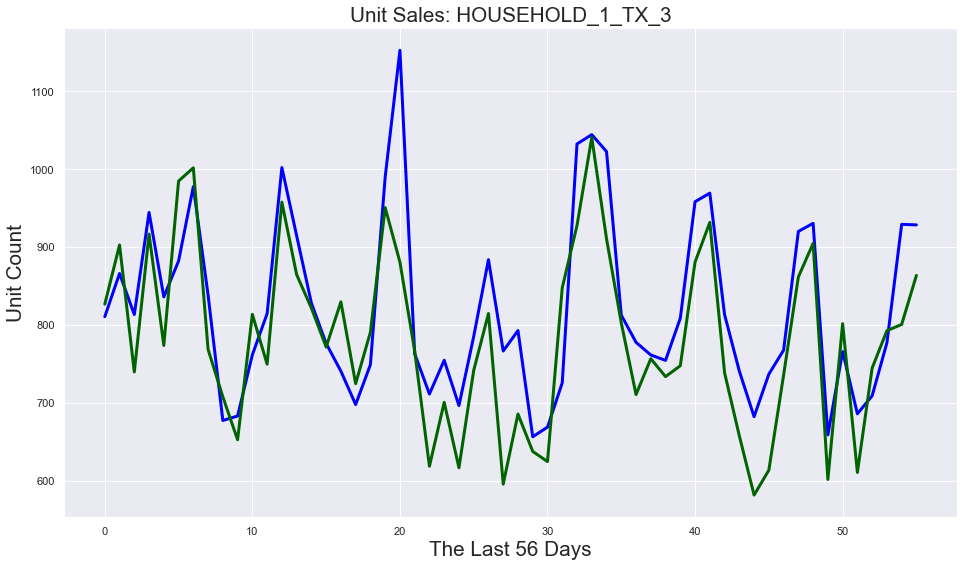

Coefficient of determination: 0.88
RMSE: 59.195


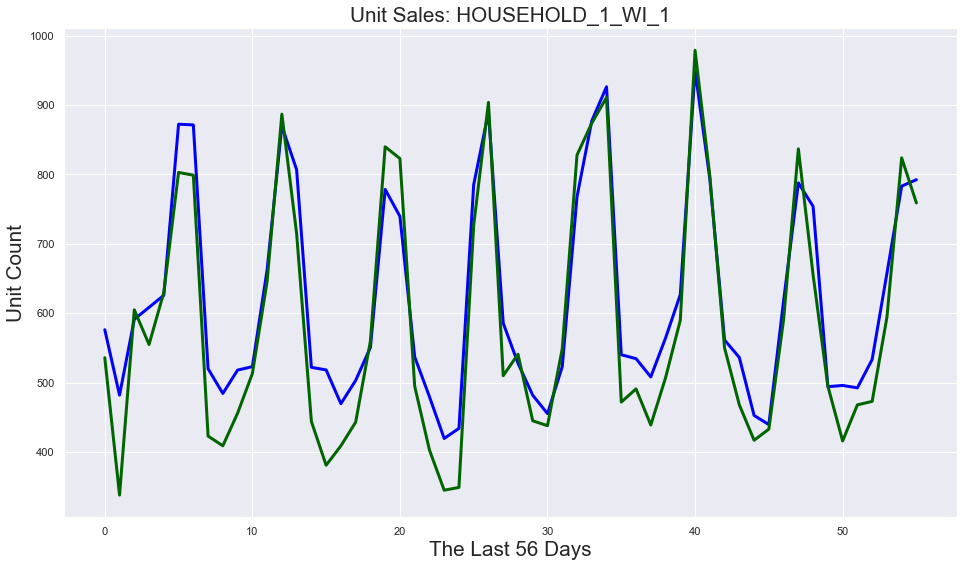

Coefficient of determination: 0.75
RMSE: 111.394


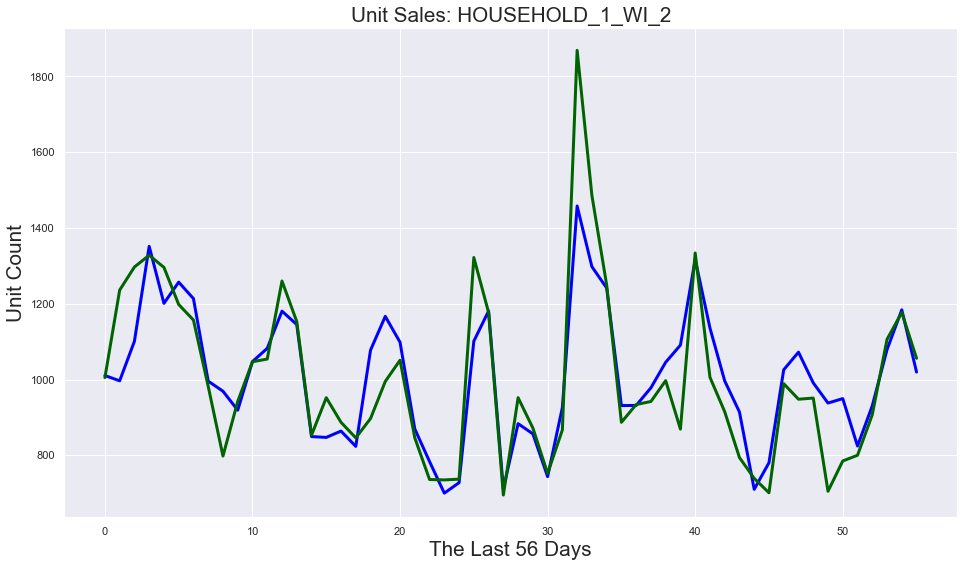

Coefficient of determination: 0.84
RMSE: 58.303


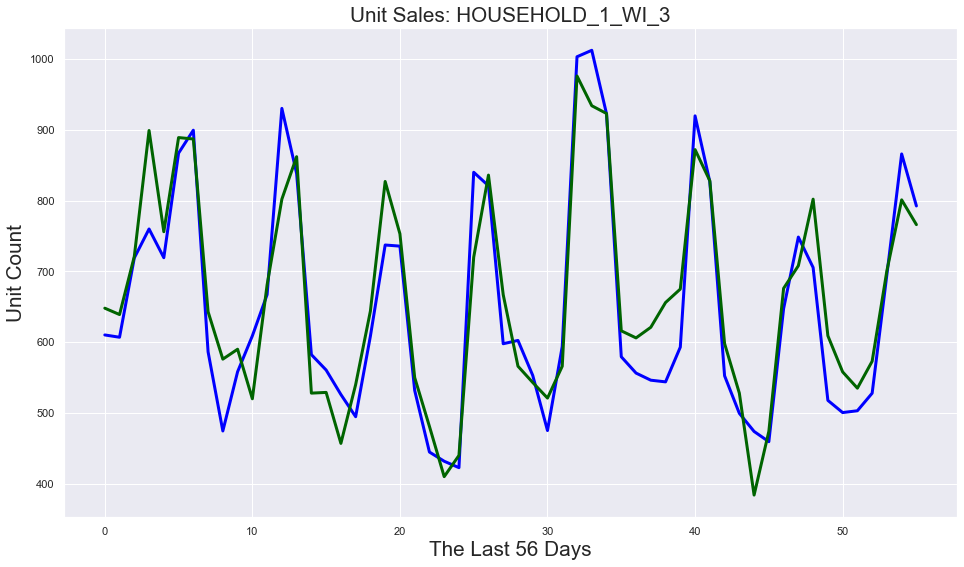

Coefficient of determination: 0.84
RMSE: 22.240


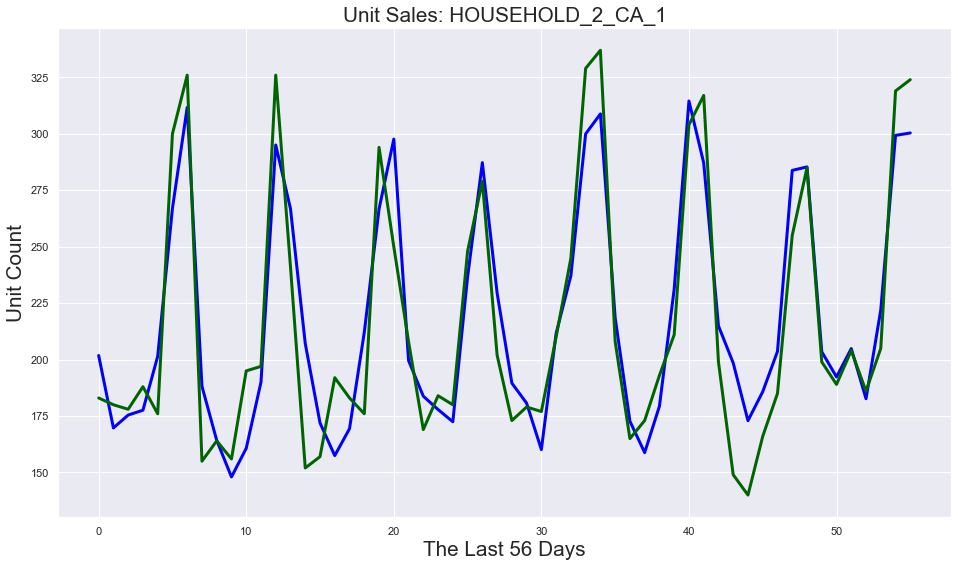

Coefficient of determination: 0.79
RMSE: 40.739


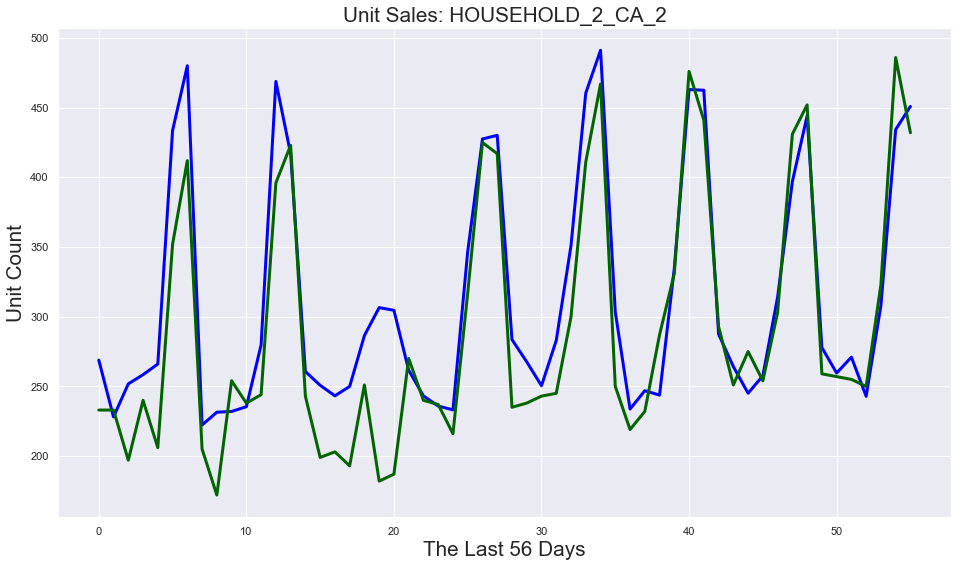

Coefficient of determination: 0.70
RMSE: 38.951


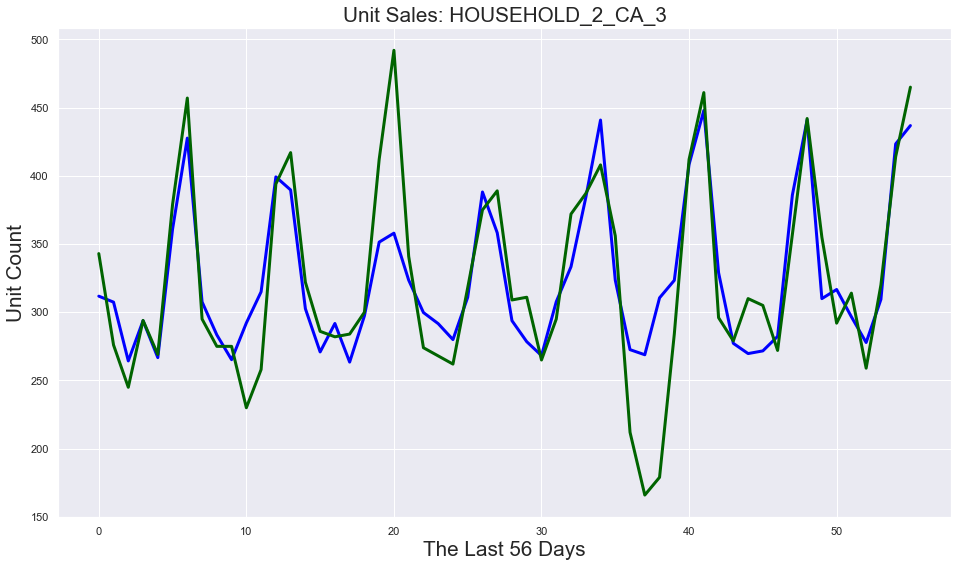

Coefficient of determination: 0.03
RMSE: 24.063


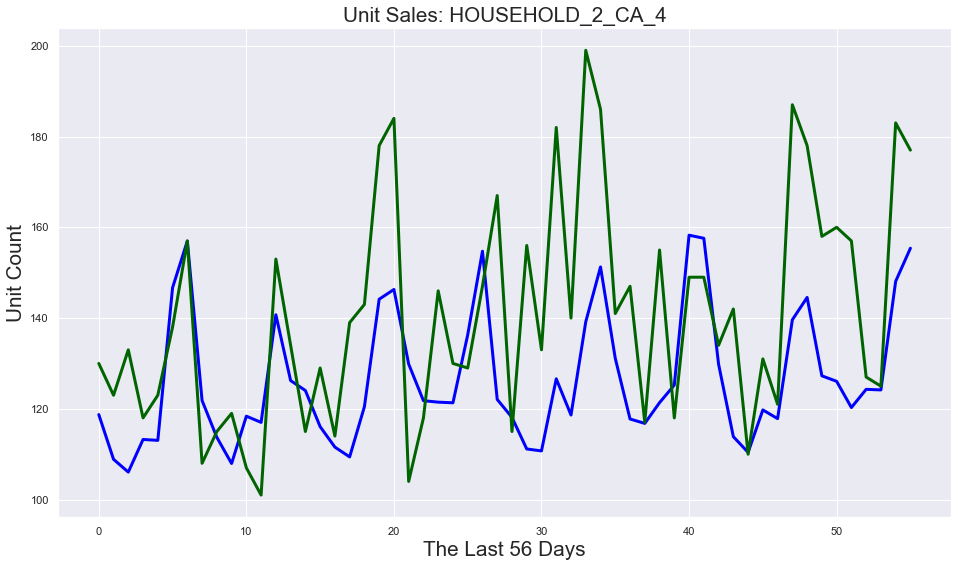

Coefficient of determination: 0.20
RMSE: 35.821


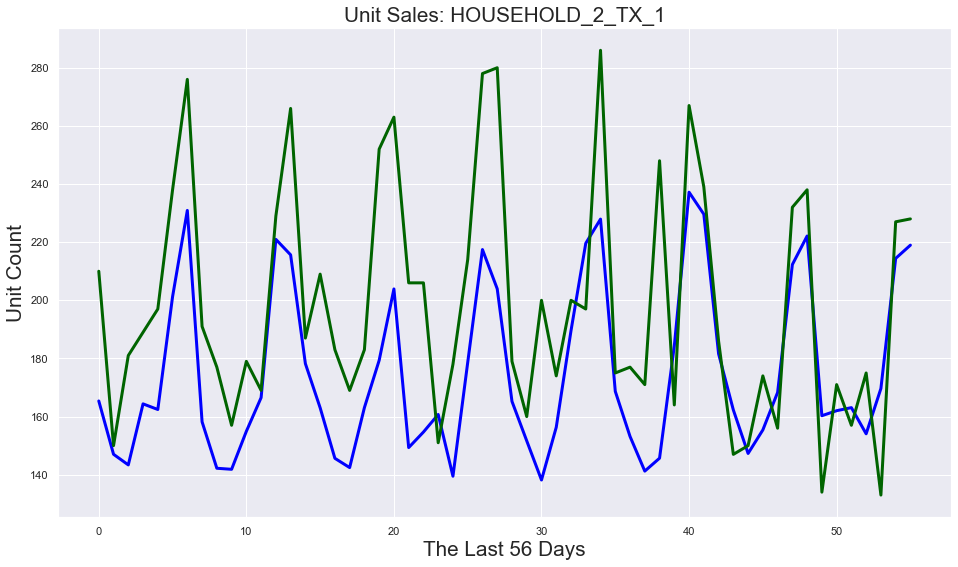

Coefficient of determination: 0.64
RMSE: 22.252


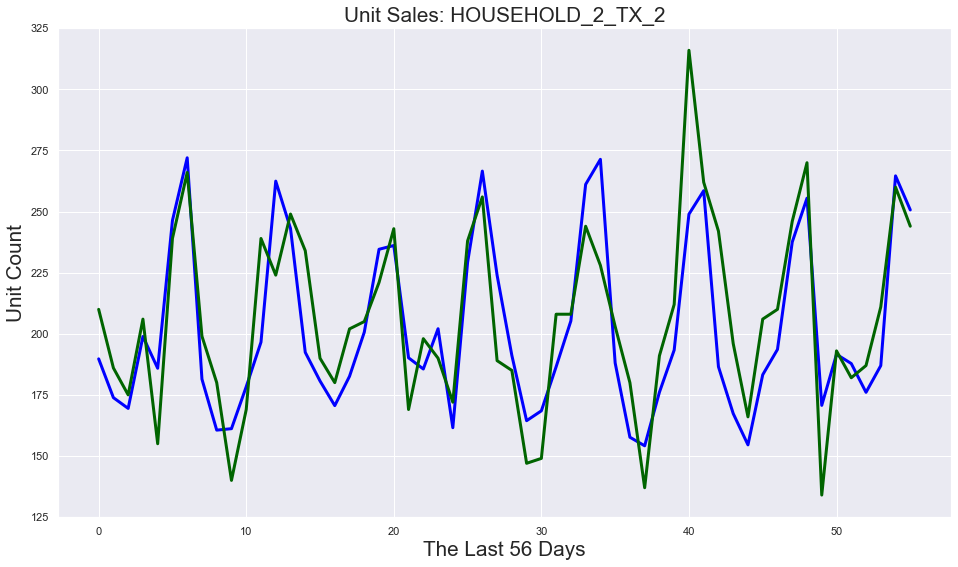

Coefficient of determination: 0.46
RMSE: 21.343


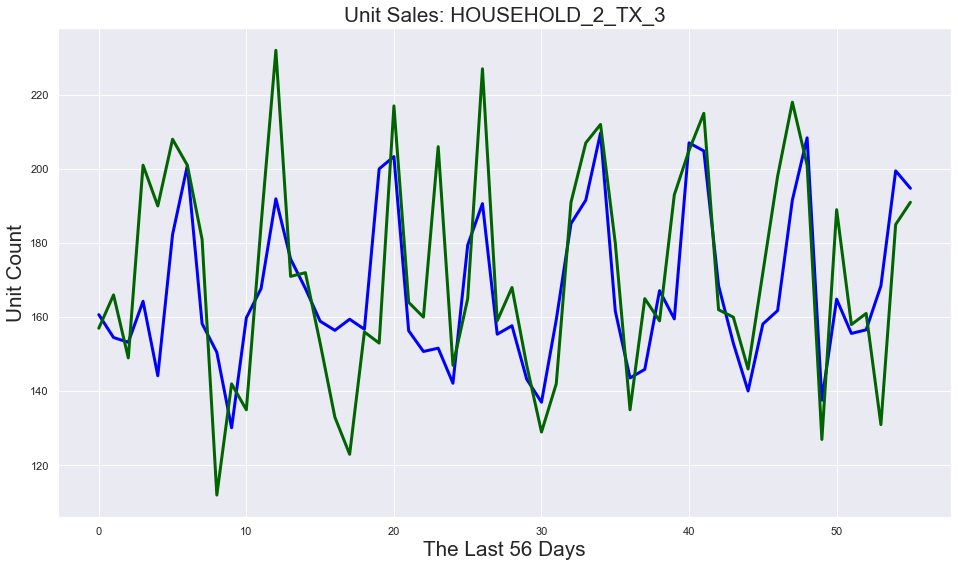

Coefficient of determination: 0.78
RMSE: 20.005


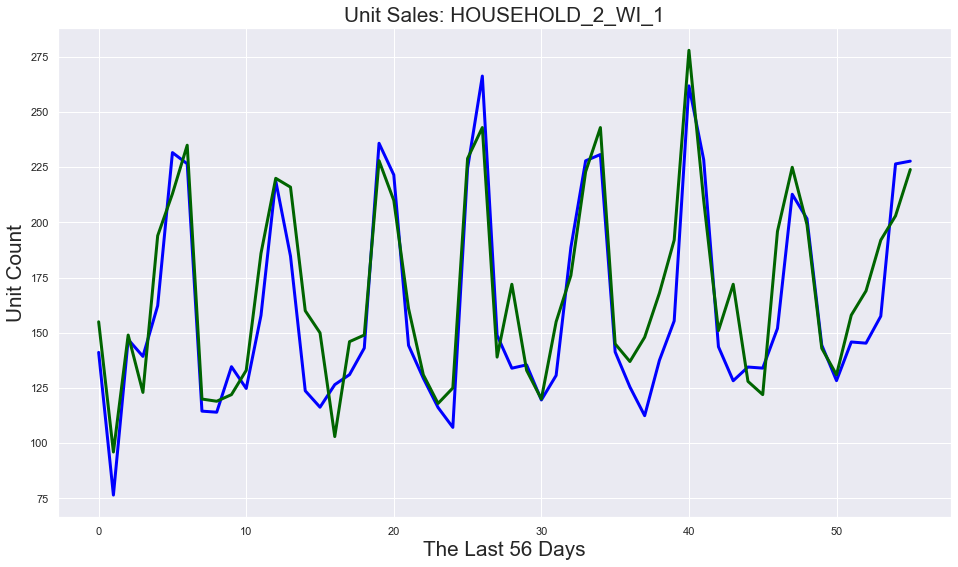

Coefficient of determination: 0.67
RMSE: 15.737


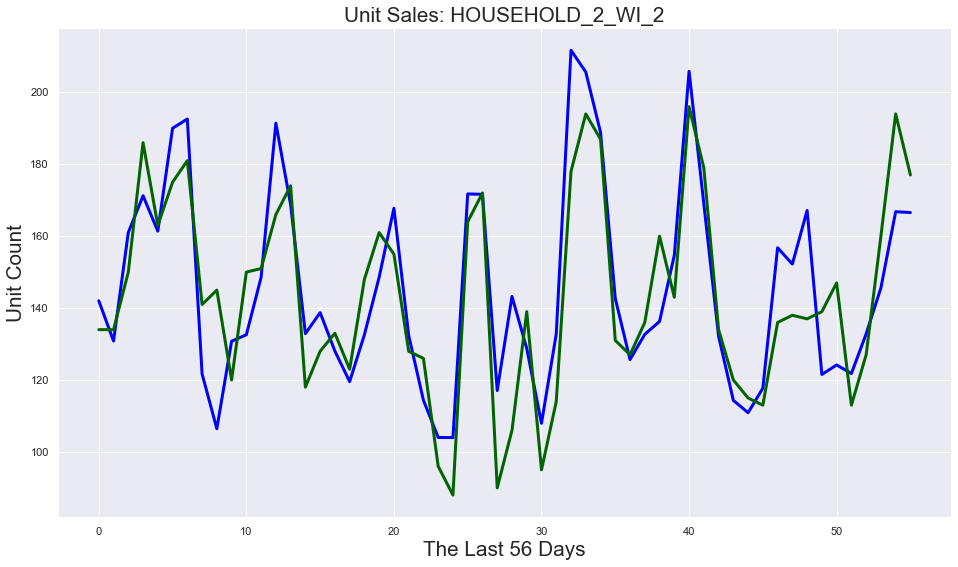

Coefficient of determination: 0.35
RMSE: 28.722


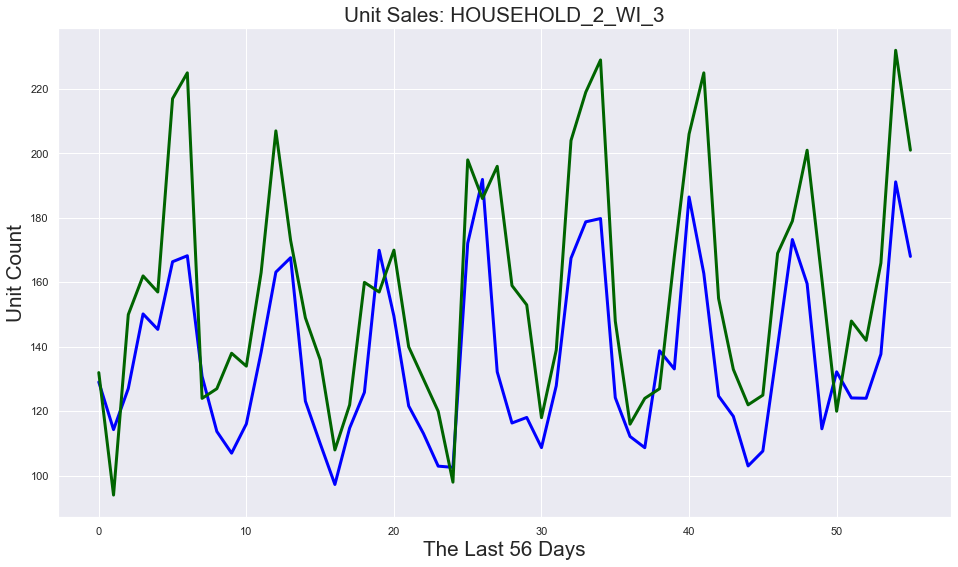

In [33]:
columns_and_CODs = []

for each_series in train_data_lvl9.columns[1:]:
    wholeList = train_data_lvl9.columns.tolist()
    wholeList.remove(each_series)
    xList = wholeList
    
    X_train = train_data_lvl9[xList]
    Y_train = train_data_lvl9[each_series].astype('int')


    X_test = test_data_lvl9[xList]
    Y_test = test_data_lvl9[each_series].astype('int')


    lr = LinearRegression()
    lr.fit(X_train, Y_train)

    Y_pred = lr.predict(X_test)

    #print('Coefficients: \n', lr.coef_)
    # The mean squared error~~no idea what this 
    #print('Mean squared error: %.2f'
    #      % mean_squared_error(Y_test, Y_pred))
    # The coefficient of determination: 1 means the prediction is flawless
    print('Coefficient of determination: %.2f'
          % r2_score(Y_test, Y_pred))
    
    rmse = sqrt(mean_squared_error(Y_test, Y_pred))
    print('RMSE: %.3f' % rmse)

    dict_of_this_column_and_its_COD = {
        "Column Name": each_series,
        "COD" : r2_score(Y_test, Y_pred),
        "RMSE_LR" : rmse
    }
    columns_and_CODs.append(dict_of_this_column_and_its_COD)
    
    # Plot outputs
    #plt.scatter(X_test, Y_test,  color='black')

    plt.plot(Y_pred, color='blue', linewidth=3)
    plt.plot(Y_test.values.tolist(), color='darkgreen', linewidth=3)

    #plt.xticks(())
    #plt.yticks(())
    plt.title("Unit Sales: " + each_series, fontsize = "xx-large")
    plt.xlabel("The Last 56 Days", fontsize = "xx-large")
    plt.ylabel("Unit Count", fontsize = "xx-large")
    plt.show()

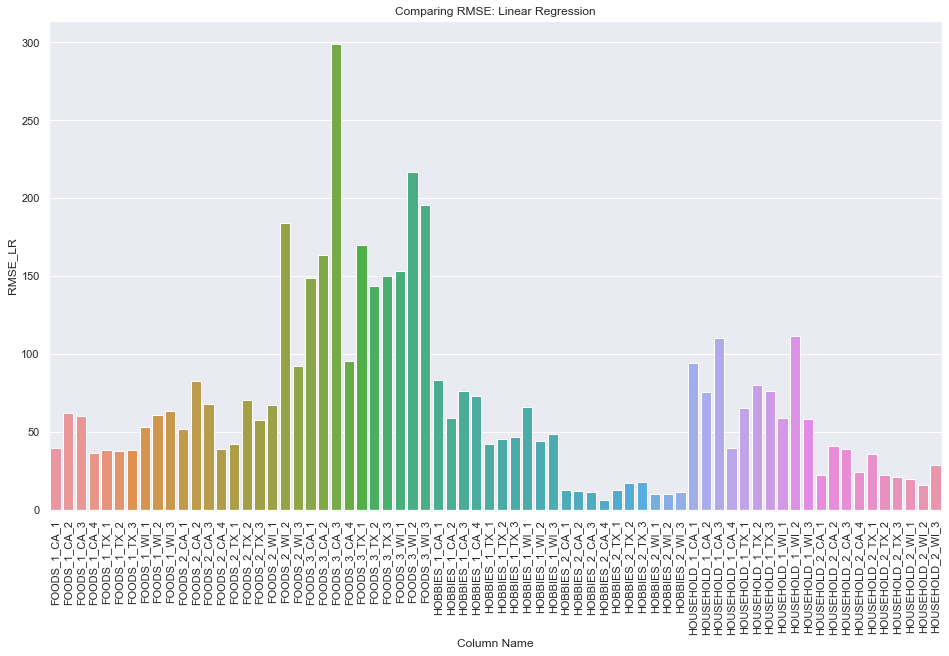

In [34]:
COD_dataframe = pd.DataFrame(columns_and_CODs)
sns.set(rc={'figure.figsize':(16,9)})
# ax = sns.barplot(x="Column Name", y="COD", data=COD_dataframe)
ax = sns.barplot(x="Column Name", y="RMSE_LR", data=COD_dataframe)
ax.set_title("Comparing RMSE: Linear Regression")
ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
pass

## 3. Progressing into AutoRegression Integrated Moving Average (ARIMA) model (June 8~15) <a id="section3"></a>

### The methods herein are referenced from: 
- https://machinelearningmastery.com/make-manual-predictions-arima-models-python/
- https://www.statsmodels.org/dev/generated/statsmodels.tsa.arima_model.ARIMA.html

In [18]:
sales_pd_lvl9

Idx,day_,FOODS_1_CA_1,FOODS_1_CA_2,FOODS_1_CA_3,FOODS_1_CA_4,FOODS_1_TX_1,FOODS_1_TX_2,FOODS_1_TX_3,FOODS_1_WI_1,FOODS_1_WI_2,...,HOUSEHOLD_2_CA_1,HOUSEHOLD_2_CA_2,HOUSEHOLD_2_CA_3,HOUSEHOLD_2_CA_4,HOUSEHOLD_2_TX_1,HOUSEHOLD_2_TX_2,HOUSEHOLD_2_TX_3,HOUSEHOLD_2_WI_1,HOUSEHOLD_2_WI_2,HOUSEHOLD_2_WI_3
0,1,297,406,341,113,152,210,138,343,191,...,181,234,286,64,106,199,120,148,98,148
1,2,284,408,326,124,154,169,123,306,184,...,170,267,341,89,148,183,138,151,94,195
2,3,214,238,260,75,109,159,113,208,154,...,114,158,231,73,69,117,97,66,69,106
3,4,175,240,231,97,126,107,84,145,205,...,123,164,264,79,91,108,83,47,80,94
4,5,182,220,220,107,108,128,61,0,96,...,135,151,272,73,67,98,46,0,32,53
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1908,1909,287,422,306,201,176,221,247,282,335,...,204,255,314,157,157,182,158,158,113,148
1909,1910,297,334,276,190,198,207,302,301,307,...,186,250,259,127,175,187,161,169,127,142
1910,1911,331,579,335,229,201,235,259,339,400,...,205,323,320,125,133,211,131,192,160,166
1911,1912,419,623,510,250,218,280,250,430,408,...,319,486,414,183,227,260,185,203,194,232


### 3-1 : AR model: FOODS_1_WI_1 as a tryout

In [19]:
def predict_using_AR(coef, history):
	yhat = 0.0
	for i in range(1, len(coef)+1):
		yhat += coef[i-1] * history[-i]
	return yhat

>predicted=352.459, expected=236.000
>predicted=227.821, expected=160.000
>predicted=154.437, expected=183.000
>predicted=176.643, expected=275.000
>predicted=265.482, expected=350.000
>predicted=337.943, expected=419.000
>predicted=404.650, expected=444.000
>predicted=428.845, expected=246.000
>predicted=237.463, expected=237.000
>predicted=228.775, expected=272.000
>predicted=262.580, expected=298.000
>predicted=287.700, expected=293.000
>predicted=282.876, expected=358.000
>predicted=345.685, expected=340.000
>predicted=328.300, expected=249.000
>predicted=240.384, expected=243.000
>predicted=234.593, expected=302.000
>predicted=291.586, expected=243.000
>predicted=234.596, expected=322.000
>predicted=310.911, expected=382.000
>predicted=368.906, expected=311.000
>predicted=300.292, expected=320.000
>predicted=308.996, expected=341.000
>predicted=329.298, expected=282.000
>predicted=272.291, expected=277.000
>predicted=267.466, expected=655.000
>predicted=632.937, expected=754.000
>

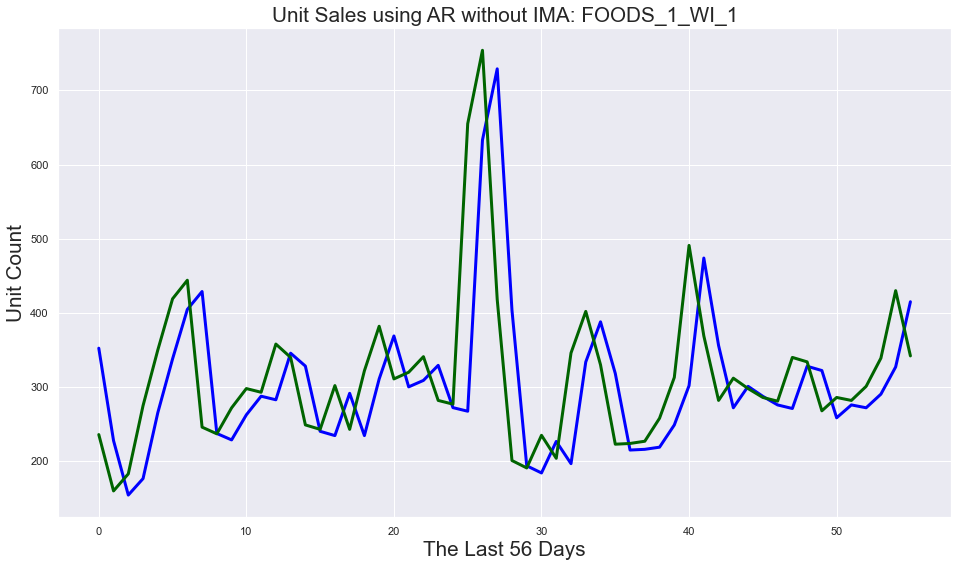

In [20]:
series = pd.Series(sales_pd_lvl9["FOODS_1_WI_1"])
X = series.values
size = len(X) - 56
train, test = X[0:size], X[size:]
history = [x for x in train]
predictions_AR = list()
observations_AR = list()
for t in range(len(test)):
    model = ARIMA(history, order=(1,0,0))
    model_fit = model.fit(trend='nc', disp=False)
    ar_coef = model_fit.arparams
    yhat = predict_using_AR(ar_coef, history)
    predictions_AR.append(yhat)
    obs = test[t]
    observations_AR.append(obs)
    history.append(obs)
    print('>predicted=%.3f, expected=%.3f' % (yhat, obs))
rmse = sqrt(mean_squared_error(test, predictions_AR))
print('Test RMSE FOODS_1_WI_1 AR without IMA: %.3f' % rmse)


plt.plot(predictions_AR, color='blue', linewidth=3)
plt.plot(observations_AR, color='darkgreen', linewidth=3)
plt.title("Unit Sales using AR without IMA: " + "FOODS_1_WI_1", fontsize = "xx-large")
plt.xlabel("The Last 56 Days", fontsize = "xx-large")
plt.ylabel("Unit Count", fontsize = "xx-large")
plt.show()

### 3-2 : MA model: FOODS_1_WI_1 as a tryout

In [21]:
def predict_using_MA(coef, history):
    yhat = 0.0
    for i in range(1, len(coef)+1):
        yhat += coef[i-1] * history[-i]
    return yhat

>predicted=110.315, expected=236.000
>predicted=106.311, expected=160.000
>predicted=45.409, expected=183.000
>predicted=116.384, expected=275.000
>predicted=134.172, expected=350.000
>predicted=182.614, expected=419.000
>predicted=200.009, expected=444.000
>predicted=206.514, expected=246.000
>predicted=33.413, expected=237.000
>predicted=172.271, expected=272.000
>predicted=84.373, expected=298.000
>predicted=180.757, expected=293.000
>predicted=94.954, expected=358.000
>predicted=222.558, expected=340.000
>predicted=99.336, expected=249.000
>predicted=126.626, expected=243.000
>predicted=98.455, expected=302.000
>predicted=172.233, expected=243.000
>predicted=59.868, expected=322.000
>predicted=221.761, expected=382.000
>predicted=135.529, expected=311.000
>predicted=148.467, expected=320.000
>predicted=145.131, expected=341.000
>predicted=165.767, expected=282.000
>predicted=98.358, expected=277.000
>predicted=151.192, expected=655.000
>predicted=426.546, expected=754.000
>predicte

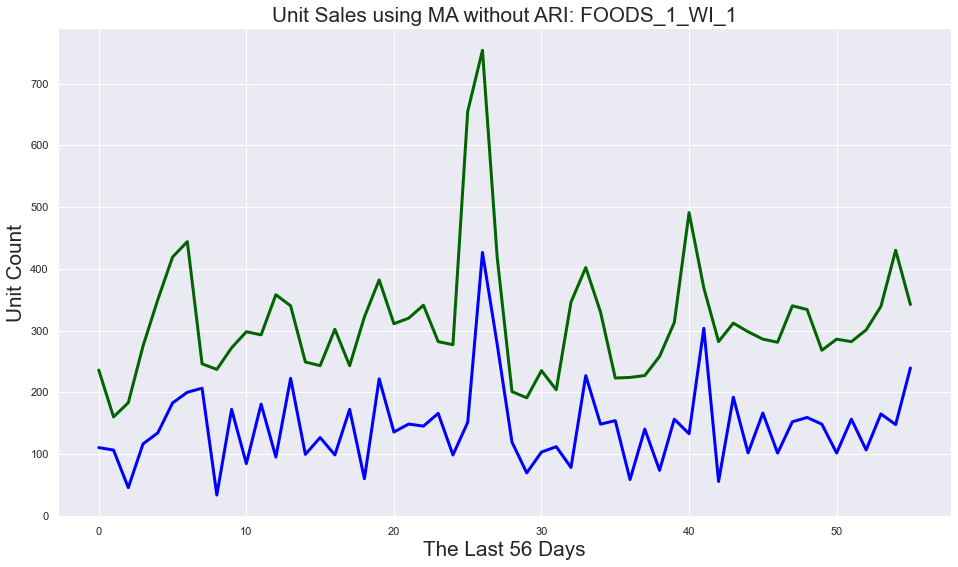

In [22]:
series = pd.Series(sales_pd_lvl9["FOODS_1_WI_1"])
X = series.values
size = len(X) - 56
train, test = X[0:size], X[size:]
history = [x for x in train]
predictions_MA = list()
observations_MA = list()
for t in range(len(test)):
    model = ARIMA(history, order=(0,0,1))
    model_fit = model.fit(trend='nc', disp=False)
    ma_coef = model_fit.maparams
    resid = model_fit.resid
    yhat = predict_using_MA(ma_coef, resid)
    predictions_MA.append(yhat)
    obs = test[t]
    history.append(obs)
    observations_MA.append(obs)
    print('>predicted=%.3f, expected=%.3f' % (yhat, obs))
rmse = sqrt(mean_squared_error(test, predictions_MA))
print('Test RMSE: %.3f' % rmse)

plt.plot(predictions_MA, color='blue', linewidth=3)
plt.plot(observations_MA, color='darkgreen', linewidth=3)
plt.title("Unit Sales using MA without ARI: " + "FOODS_1_WI_1", fontsize = "xx-large")
plt.xlabel("The Last 56 Days", fontsize = "xx-large")
plt.ylabel("Unit Count", fontsize = "xx-large")
plt.show()

### 3-3 : ARMA model: FOODS_1_WI_1 as a tryout

In [23]:
def predict_using_ARMA(coef, history):
    yhat = 0.0
    for i in range(1, len(coef)+1):
        yhat += coef[i-1] * history[-i]
    return yhat

>predicted=304.406, expected=236.000
>predicted=292.963, expected=160.000
>predicted=270.824, expected=183.000
>predicted=255.790, expected=275.000
>predicted=258.816, expected=350.000
>predicted=273.756, expected=419.000
>predicted=297.223, expected=444.000
>predicted=321.100, expected=246.000
>predicted=308.383, expected=237.000
>predicted=296.519, expected=272.000
>predicted=292.300, expected=298.000
>predicted=292.976, expected=293.000
>predicted=292.733, expected=358.000
>predicted=303.049, expected=340.000
>predicted=308.790, expected=249.000
>predicted=298.850, expected=243.000
>predicted=289.577, expected=302.000
>predicted=291.342, expected=243.000
>predicted=283.276, expected=322.000
>predicted=289.305, expected=382.000
>predicted=304.006, expected=311.000
>predicted=304.886, expected=320.000
>predicted=307.077, expected=341.000
>predicted=312.312, expected=282.000
>predicted=307.159, expected=277.000
>predicted=302.047, expected=655.000
>predicted=358.633, expected=754.000
>

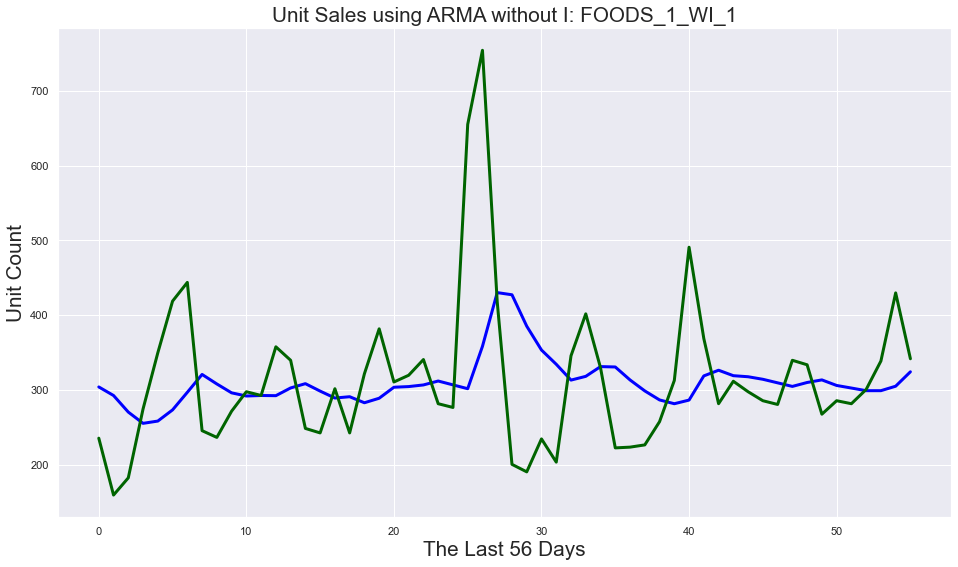

In [24]:
series = pd.Series(sales_pd_lvl9["FOODS_1_WI_1"])
X = series.values
size = len(X) - 56
train, test = X[0:size], X[size:]
history = [x for x in train]
predictions_ARMA = list()
observations_ARMA = list()
for t in range(len(test)):
    model = ARIMA(history, order=(1,0,1))
    # value ‘nc‘ for ‘no constant‘.
    model_fit = model.fit(trend='nc', disp=False)
    ar_coef, ma_coef = model_fit.arparams, model_fit.maparams
    resid = model_fit.resid
    yhat = predict_using_ARMA(ar_coef, history) + predict_using_ARMA(ma_coef, resid)
    predictions_ARMA.append(yhat)
    obs = test[t]
    history.append(obs)
    observations_ARMA.append(obs)
    print('>predicted=%.3f, expected=%.3f' % (yhat, obs))
rmse = sqrt(mean_squared_error(test, predictions_ARMA))
print('Test RMSE: %.3f' % rmse)

plt.plot(predictions_ARMA, color='blue', linewidth=3)
plt.plot(observations_ARMA, color='darkgreen', linewidth=3)
plt.title("Unit Sales using ARMA without I: " + "FOODS_1_WI_1", fontsize = "xx-large")
plt.xlabel("The Last 56 Days", fontsize = "xx-large")
plt.ylabel("Unit Count", fontsize = "xx-large")
plt.show()

### 3-4 : ARIMA model: FOODS_1_WI_1 as a tryout

In [25]:
def predict_using_ARIMA(coef, history):
    yhat = 0.0
    for i in range(1, len(coef)+1):
        yhat += coef[i-1] * history[-i]
    return yhat
 
def difference(dataset):
    diff = list()
    for i in range(1, len(dataset)):
        value = dataset[i] - dataset[i - 1]
        diff.append(value)
    return np.array(diff)

>predicted=331.808, expected=236.000
>predicted=271.504, expected=160.000
>predicted=234.460, expected=183.000
>predicted=243.368, expected=275.000
>predicted=285.567, expected=350.000
>predicted=320.938, expected=419.000
>predicted=354.565, expected=444.000
>predicted=368.288, expected=246.000
>predicted=275.880, expected=237.000
>predicted=270.833, expected=272.000
>predicted=286.607, expected=298.000
>predicted=298.591, expected=293.000
>predicted=296.200, expected=358.000
>predicted=327.003, expected=340.000
>predicted=319.239, expected=249.000
>predicted=276.538, expected=243.000
>predicted=272.981, expected=302.000
>predicted=300.251, expected=243.000
>predicted=272.276, expected=322.000
>predicted=309.042, expected=382.000
>predicted=337.869, expected=311.000
>predicted=305.269, expected=320.000
>predicted=309.685, expected=341.000
>predicted=319.914, expected=282.000
>predicted=292.448, expected=277.000
>predicted=289.811, expected=655.000
>predicted=468.487, expected=754.000
>

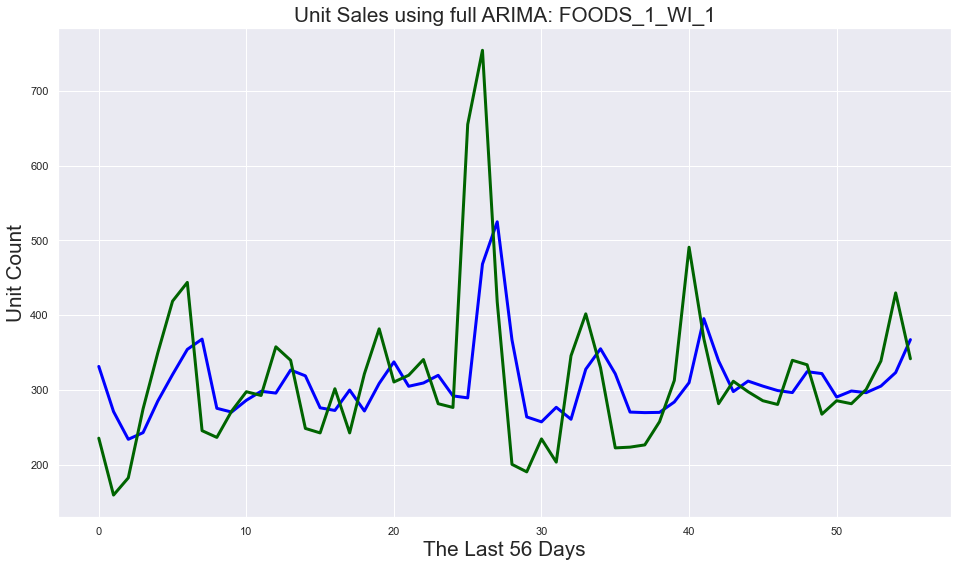

In [26]:
series = pd.Series(sales_pd_lvl9["FOODS_1_WI_1"])
X = series.values
size = len(X) - 56
train, test = X[0:size], X[size:]
history = [x for x in train]
predictions_ARIMA = list()
observations_ARIMA = list()
for t in range(len(test)):
    model = ARIMA(history, order=(1,1,1))
    model_fit = model.fit(trend='nc', disp=False)
    ar_coef, ma_coef = model_fit.arparams, model_fit.maparams
    resid = model_fit.resid
    diff = difference(history)
    yhat = history[-1] + predict_using_ARIMA(ar_coef, diff) + predict_using_ARIMA(ma_coef, resid)
    predictions_ARIMA.append(yhat)
    obs = test[t]
    history.append(obs)
    observations_ARIMA.append(obs)
    print('>predicted=%.3f, expected=%.3f' % (yhat, obs))
rmse = sqrt(mean_squared_error(test, predictions_ARIMA))
print('Test RMSE: %.3f' % rmse)
print('Coefficient of determination: %.2f'
          % r2_score(test, predictions_ARIMA))

plt.plot(predictions_ARIMA, color='blue', linewidth=3)
plt.plot(observations_ARIMA, color='darkgreen', linewidth=3)
plt.title("Unit Sales using full ARIMA: " + "FOODS_1_WI_1", fontsize = "xx-large")
plt.xlabel("The Last 56 Days", fontsize = "xx-large")
plt.ylabel("Unit Count", fontsize = "xx-large")
plt.show()

### 3-5 : ARIMA model: Full Integration

In [30]:
def predict_using_ARIMA(coef, history):
    yhat = 0.0
    for i in range(1, len(coef)+1):
        yhat += coef[i-1] * history[-i]
    return yhat
 
def difference(dataset):
    diff = list()
    for i in range(1, len(dataset)):
        value = dataset[i] - dataset[i - 1]
        diff.append(value)
    return np.array(diff)

FOODS_1_CA_1 Test RMSE: 109.393


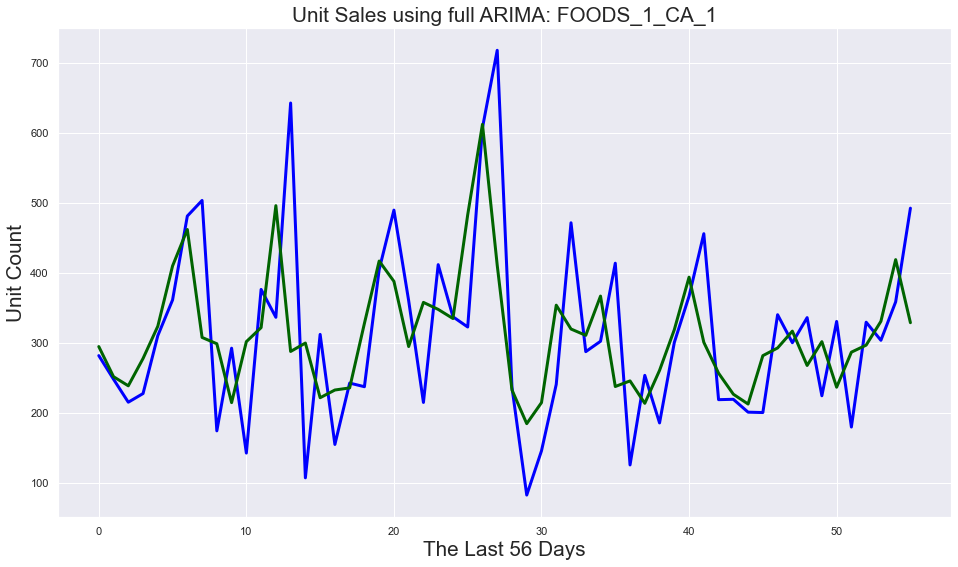

FOODS_1_CA_2 Test RMSE: 111.168


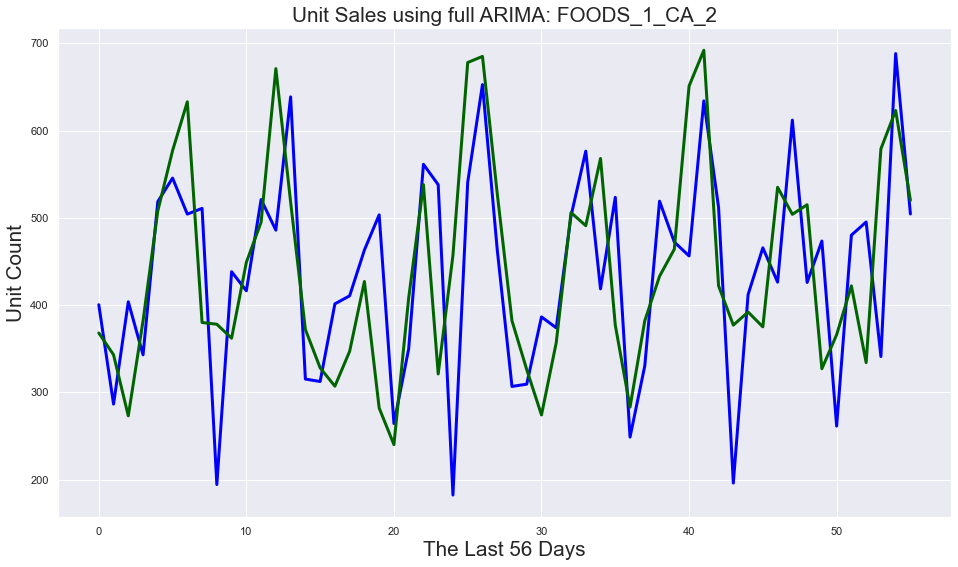

FOODS_1_CA_3 Test RMSE: 103.703


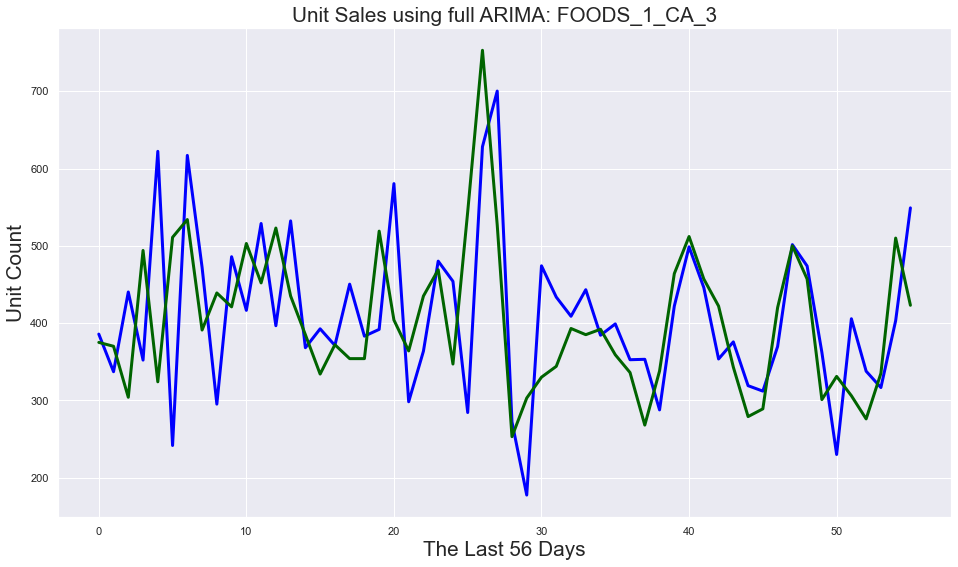

FOODS_1_CA_4 Test RMSE: 47.100


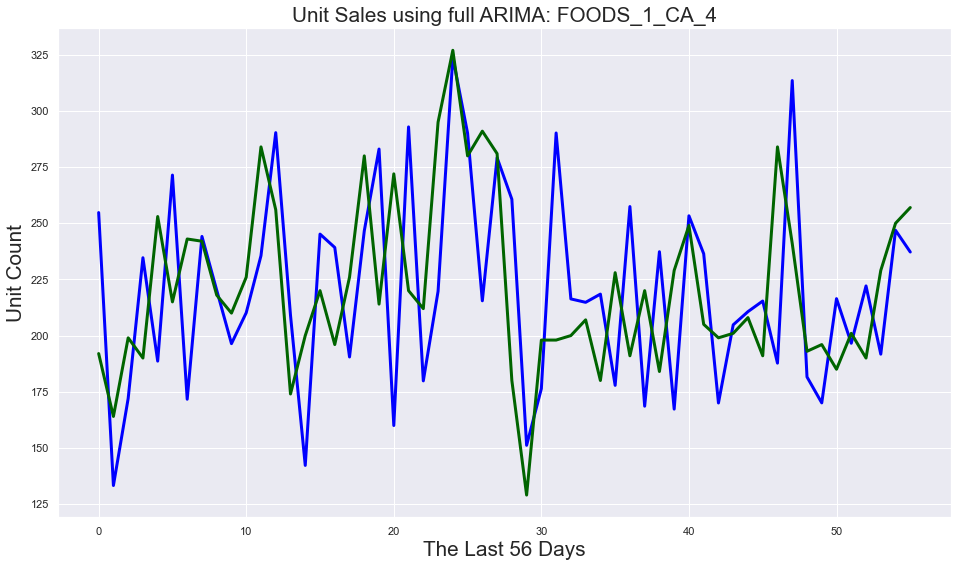

FOODS_1_TX_1 Test RMSE: 55.364


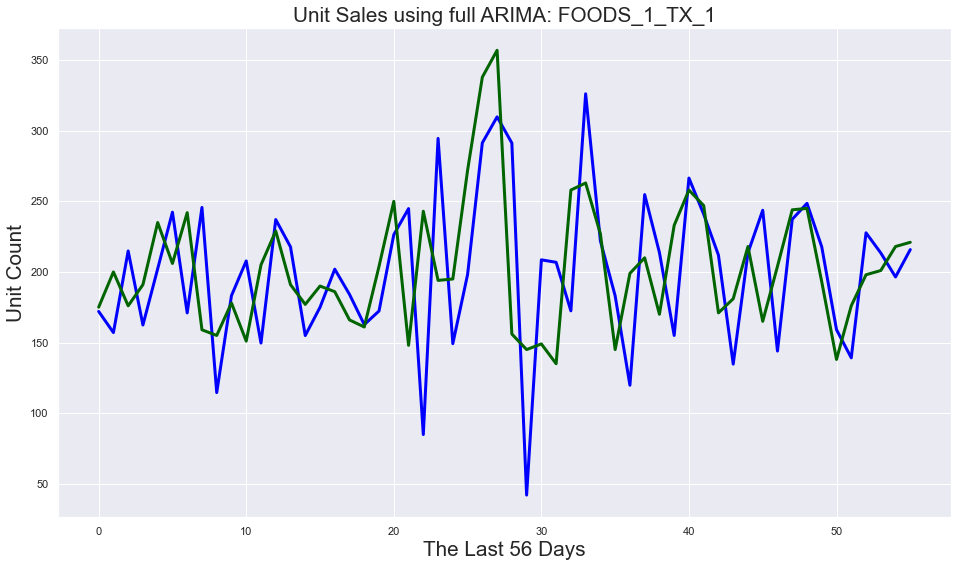

FOODS_1_TX_2 Test RMSE: 49.604


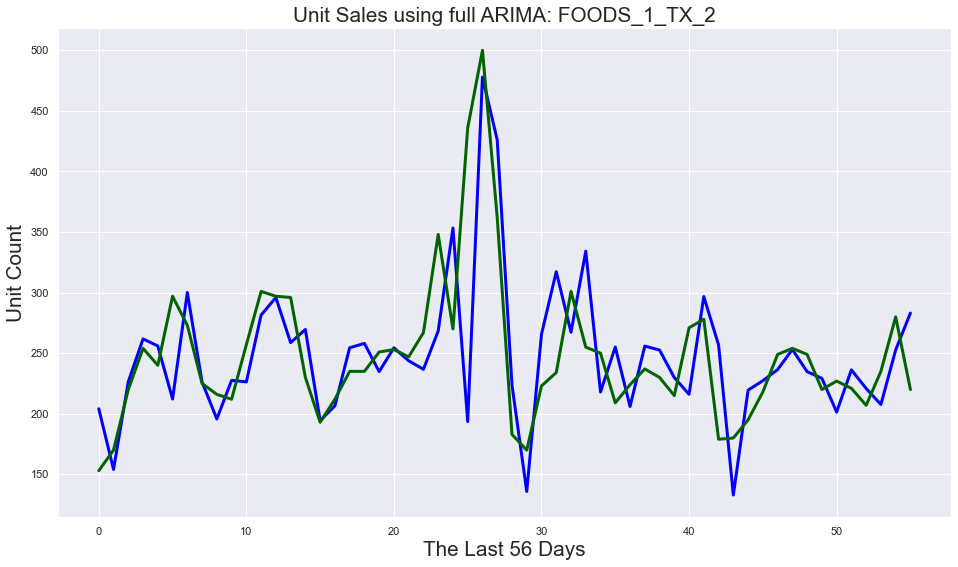

FOODS_1_TX_3 Test RMSE: 59.509


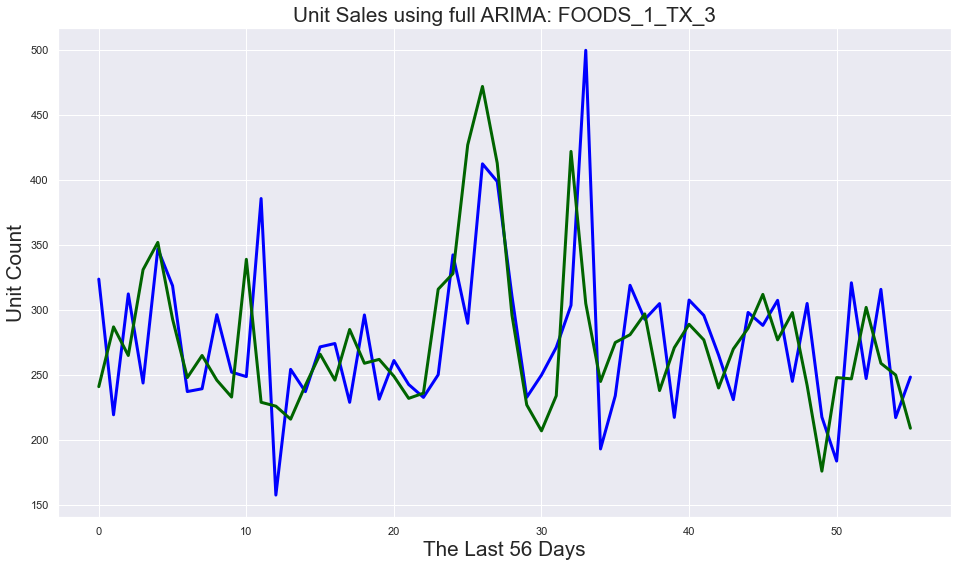

FOODS_1_WI_1 Test RMSE: 82.503


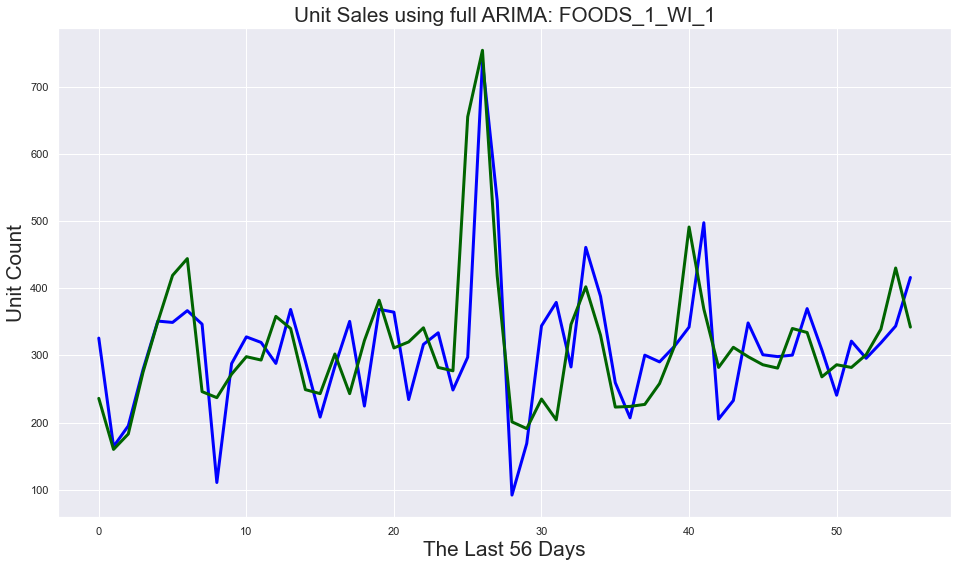

FOODS_1_WI_2 Test RMSE: 72.529


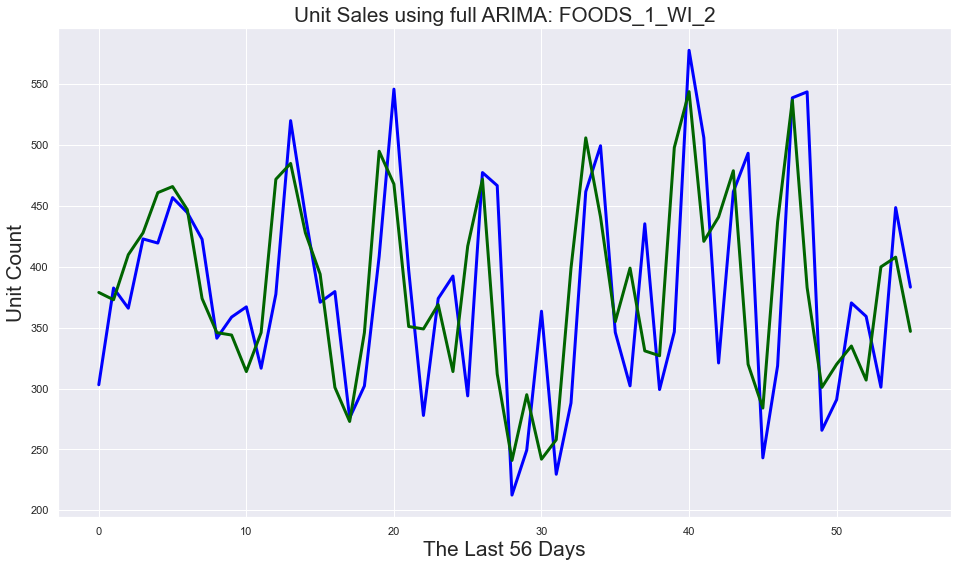

FOODS_1_WI_3 Test RMSE: 79.326


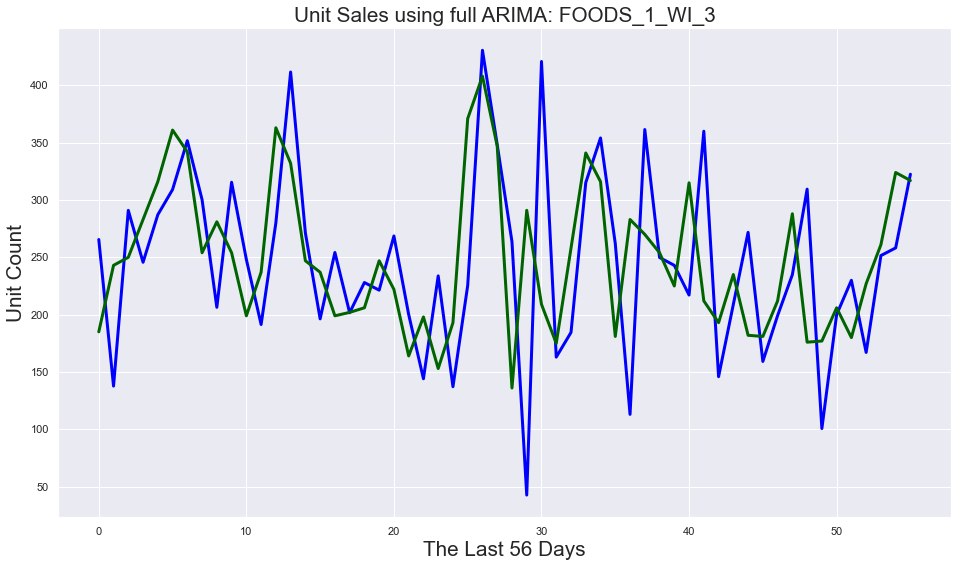

FOODS_2_CA_1 Test RMSE: 169.007


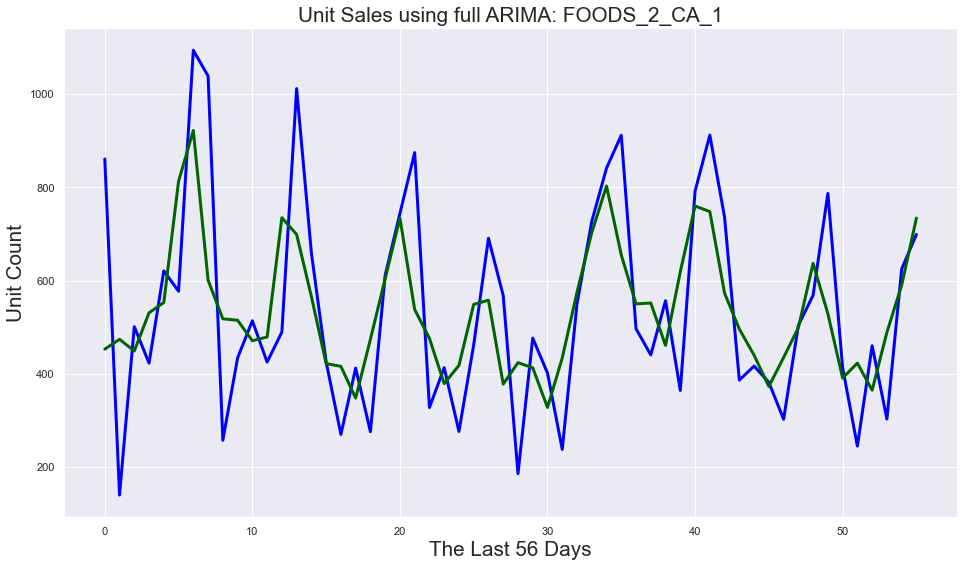

D:\Anaconda\lib\site-packages\statsmodels\base\model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
D:\Anaconda\lib\site-packages\statsmodels\base\model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
D:\Anaconda\lib\site-packages\statsmodels\tsa\kalmanf\kalmanfilter.py:221: RuntimeWarning: divide by zero encountered in true_divide
  Z_mat, R_mat, T_mat)
D:\Anaconda\lib\site-packages\statsmodels\base\model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
D:\Anaconda\lib\site-packages\statsmodels\tsa\tsatools.py:668: RuntimeWarning: invalid value encountered in true_divide
  newparams = ((1-np.exp(-params))/(1+np.exp(-params))).copy()
D:\Anaconda\lib\site-packages\statsmodels\tsa\tsatools.py:669: RuntimeWarning: invalid value encountered in true

FOODS_2_CA_2 Test RMSE: 153.080


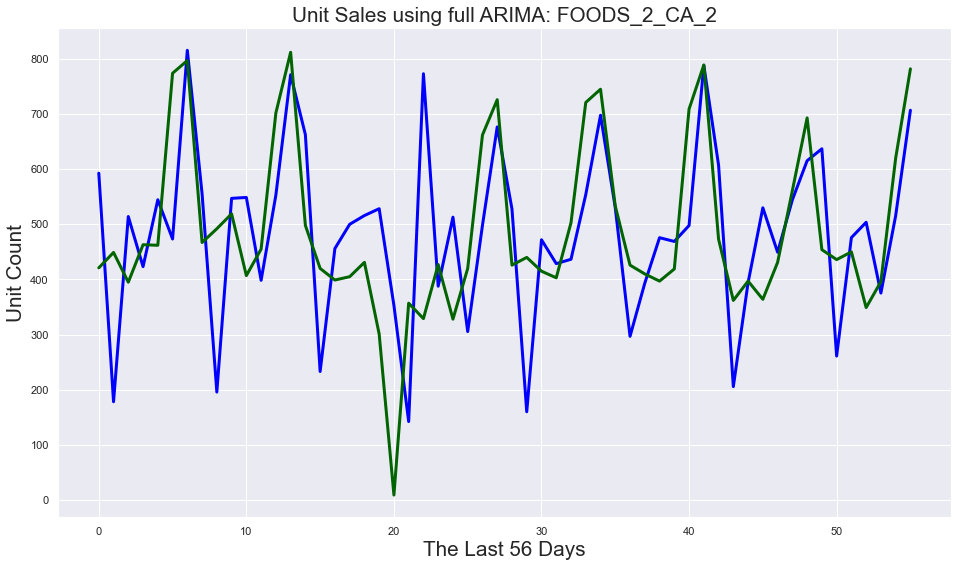

FOODS_2_CA_3 Test RMSE: 171.454


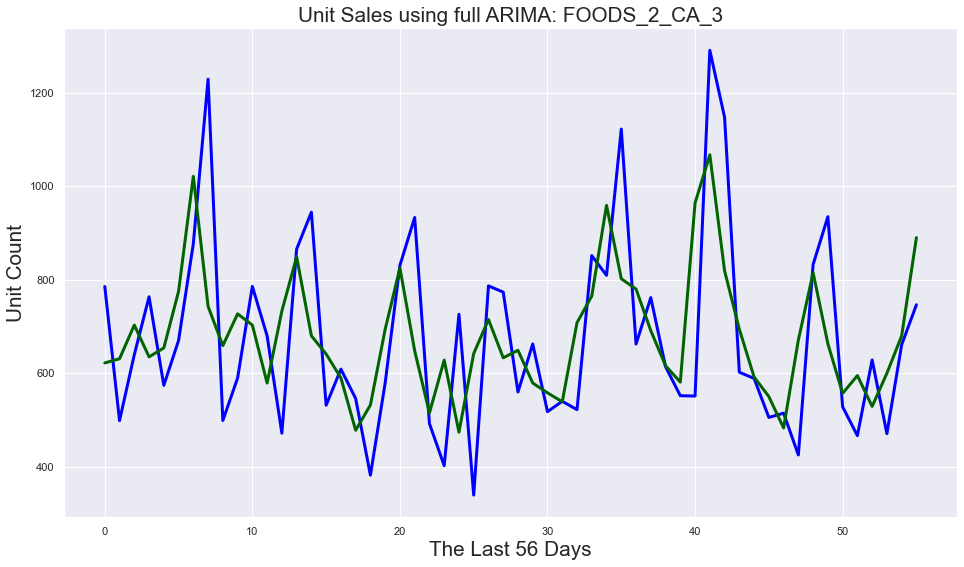

FOODS_2_CA_4 Test RMSE: 72.414


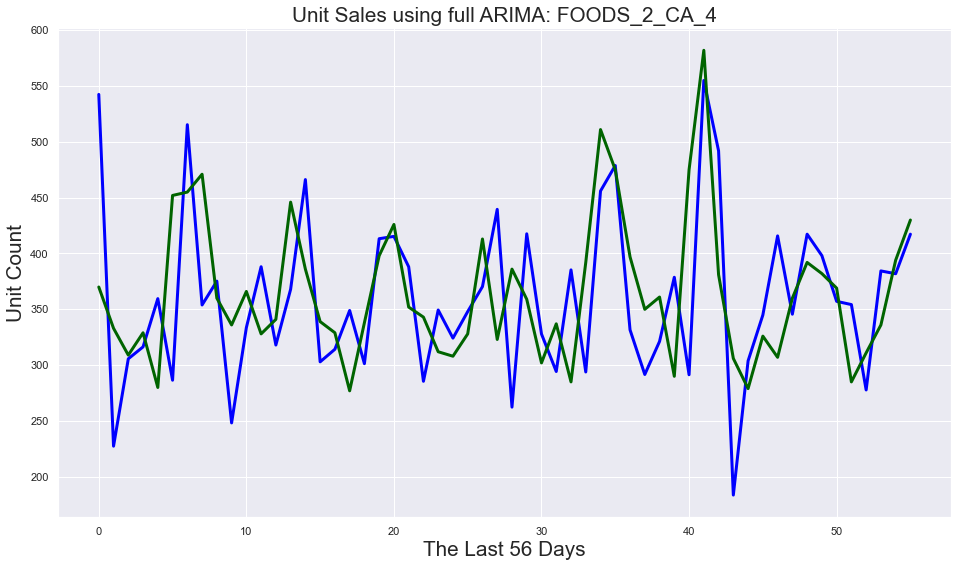

D:\Anaconda\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
D:\Anaconda\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


FOODS_2_TX_1 Test RMSE: 74.240


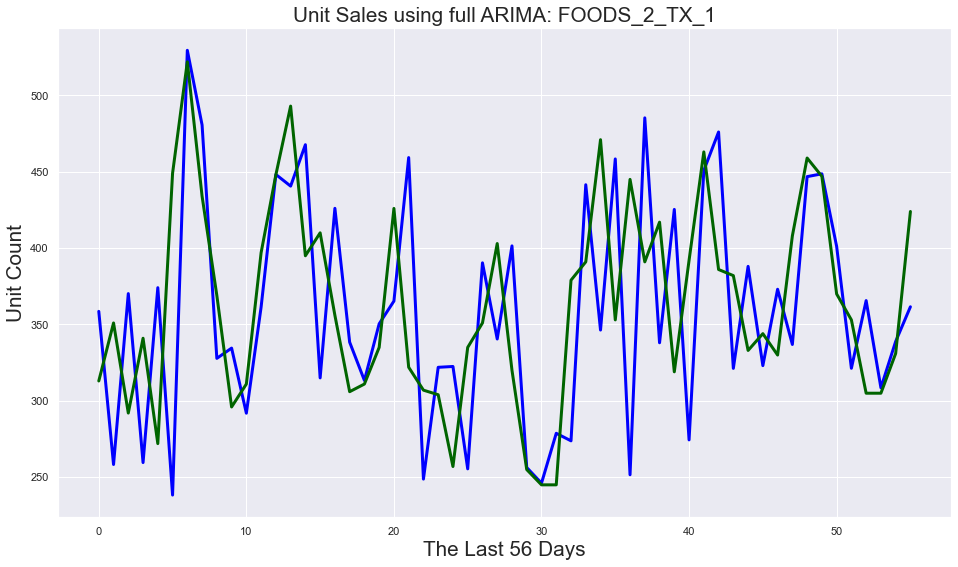

D:\Anaconda\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


FOODS_2_TX_2 Test RMSE: 80.404


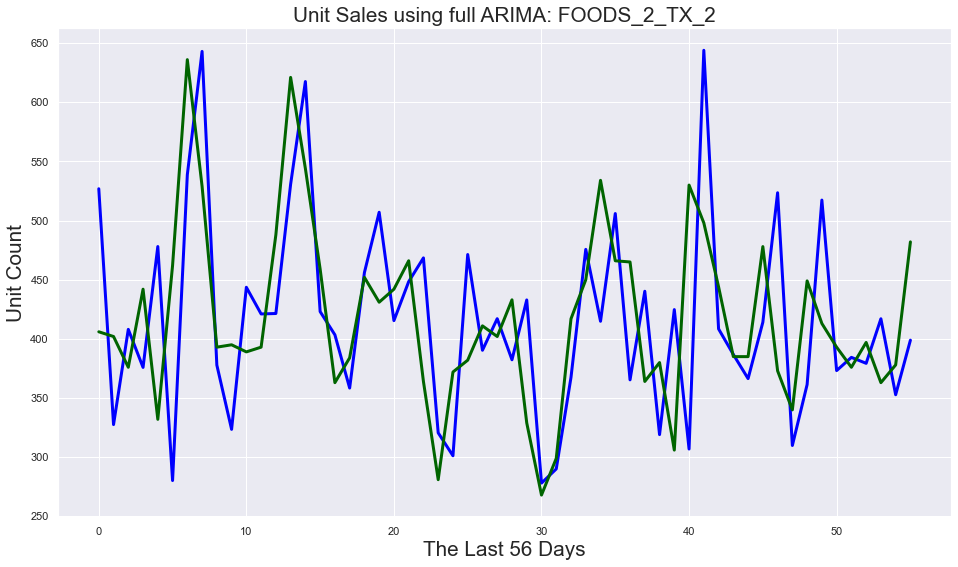

FOODS_2_TX_3 Test RMSE: 133.574


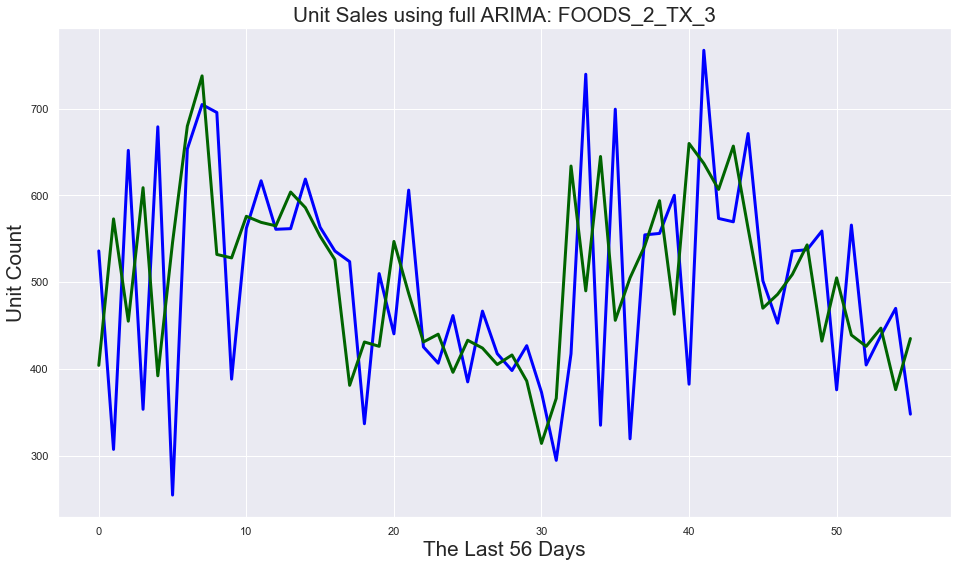

D:\Anaconda\lib\site-packages\statsmodels\tsa\kalmanf\kalmanfilter.py:221: RuntimeWarning: divide by zero encountered in true_divide
  Z_mat, R_mat, T_mat)
D:\Anaconda\lib\site-packages\statsmodels\tsa\tsatools.py:668: RuntimeWarning: invalid value encountered in true_divide
  newparams = ((1-np.exp(-params))/(1+np.exp(-params))).copy()
D:\Anaconda\lib\site-packages\statsmodels\tsa\tsatools.py:669: RuntimeWarning: invalid value encountered in true_divide
  tmp = ((1-np.exp(-params))/(1+np.exp(-params))).copy()


FOODS_2_WI_1 Test RMSE: 181.299


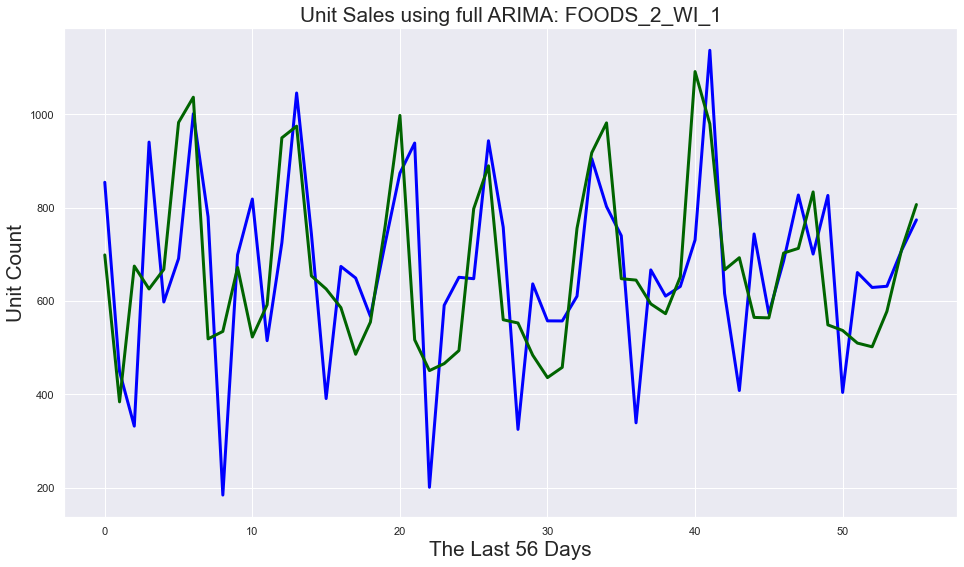

FOODS_2_WI_2 Test RMSE: 397.198


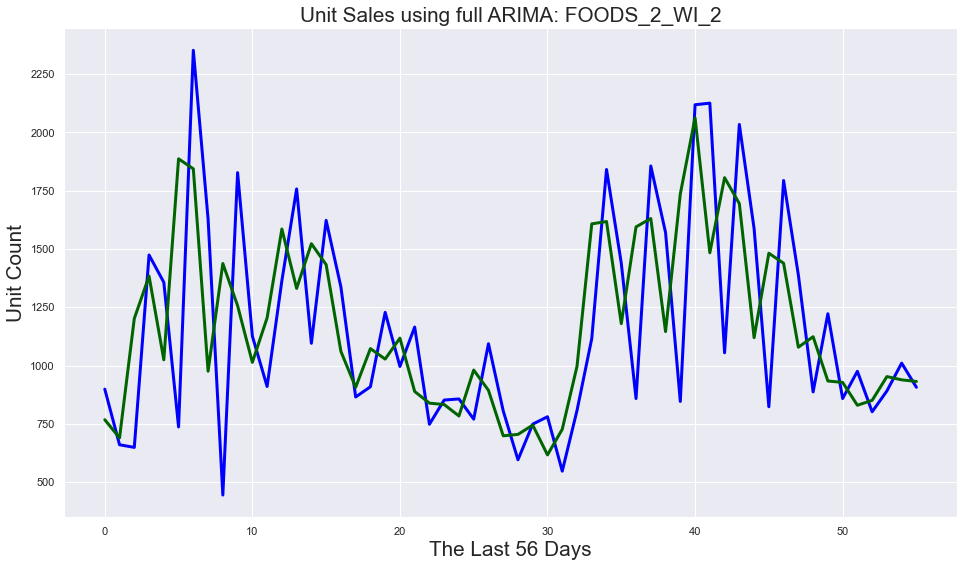

FOODS_2_WI_3 Test RMSE: 166.311


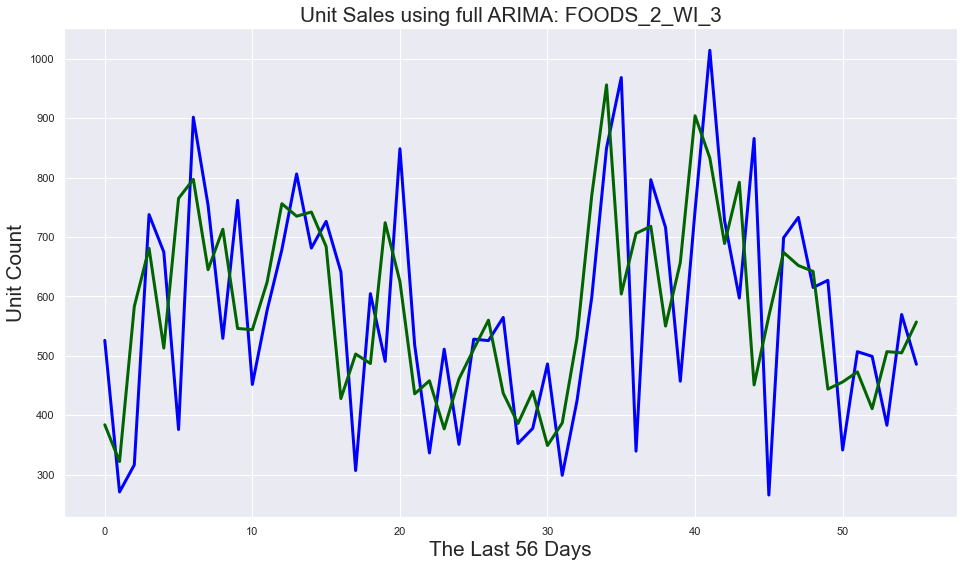

FOODS_3_CA_1 Test RMSE: 687.551


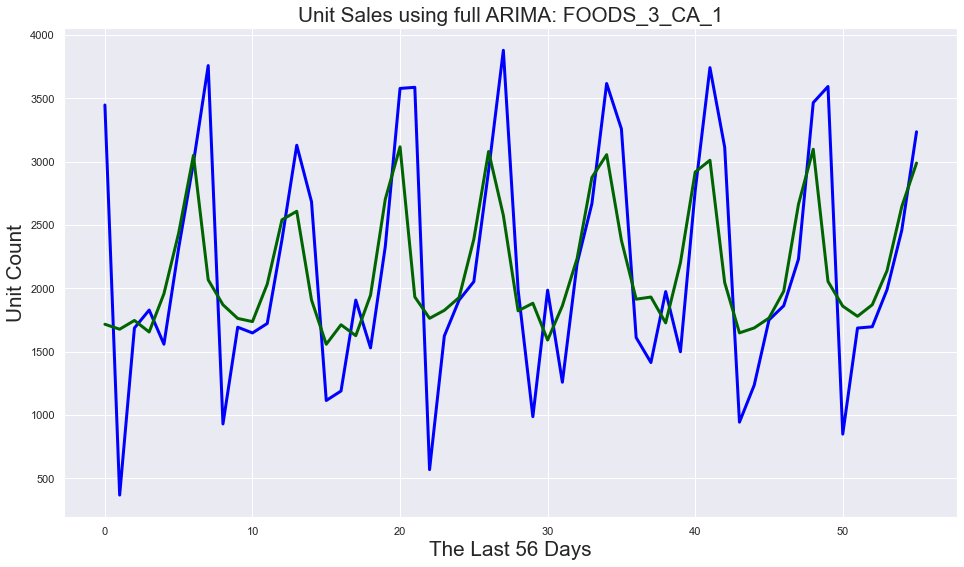

D:\Anaconda\lib\site-packages\statsmodels\base\model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
D:\Anaconda\lib\site-packages\statsmodels\base\model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
D:\Anaconda\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
D:\Anaconda\lib\site-packages\statsmodels\base\model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
D:\Anaconda\lib\site-packages\statsmodels\base\model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


FOODS_3_CA_2 Test RMSE: 420.766


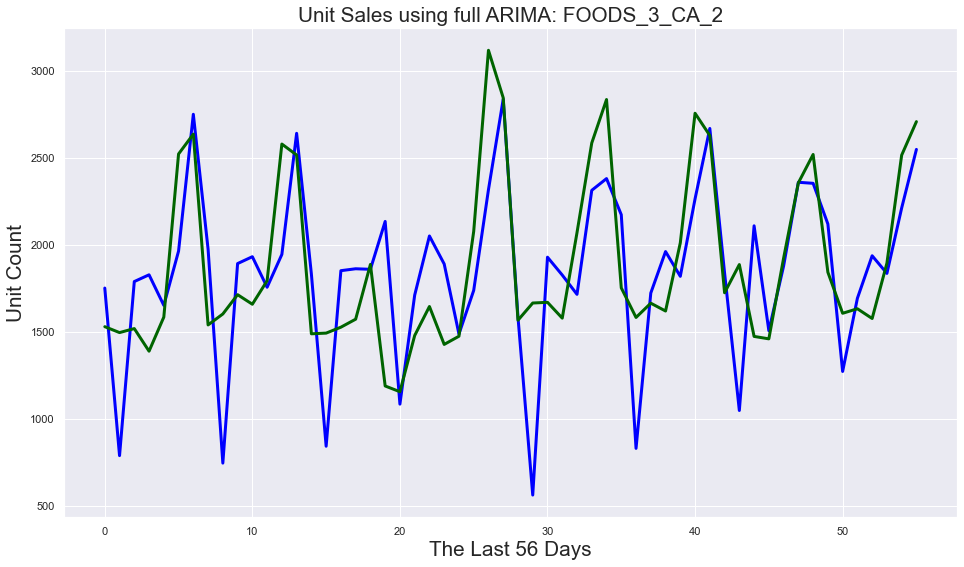

FOODS_3_CA_3 Test RMSE: 654.522


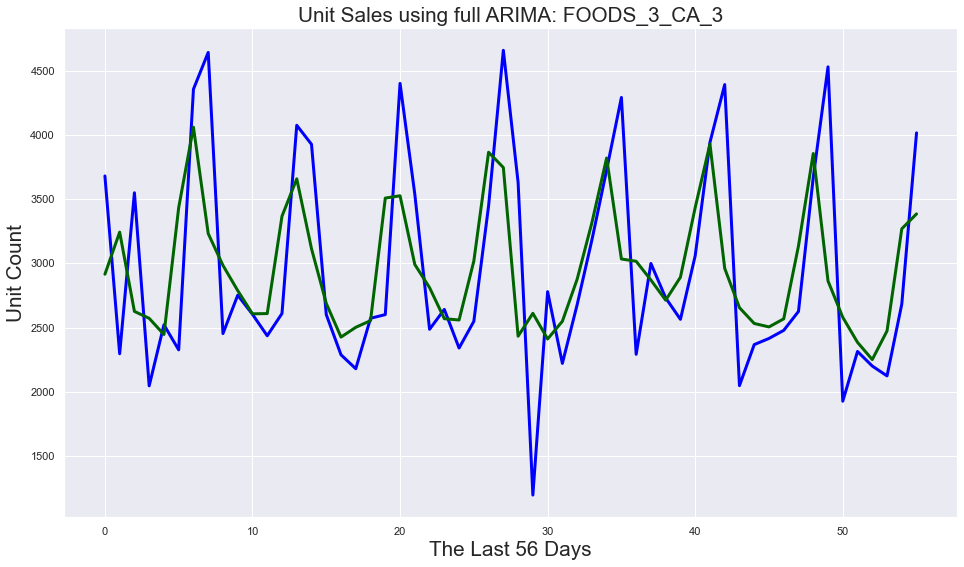

D:\Anaconda\lib\site-packages\statsmodels\tsa\kalmanf\kalmanfilter.py:221: RuntimeWarning: divide by zero encountered in true_divide
  Z_mat, R_mat, T_mat)
D:\Anaconda\lib\site-packages\statsmodels\tsa\tsatools.py:668: RuntimeWarning: invalid value encountered in true_divide
  newparams = ((1-np.exp(-params))/(1+np.exp(-params))).copy()
D:\Anaconda\lib\site-packages\statsmodels\tsa\tsatools.py:669: RuntimeWarning: invalid value encountered in true_divide
  tmp = ((1-np.exp(-params))/(1+np.exp(-params))).copy()
D:\Anaconda\lib\site-packages\statsmodels\base\model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
D:\Anaconda\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


FOODS_3_CA_4 Test RMSE: 123.346


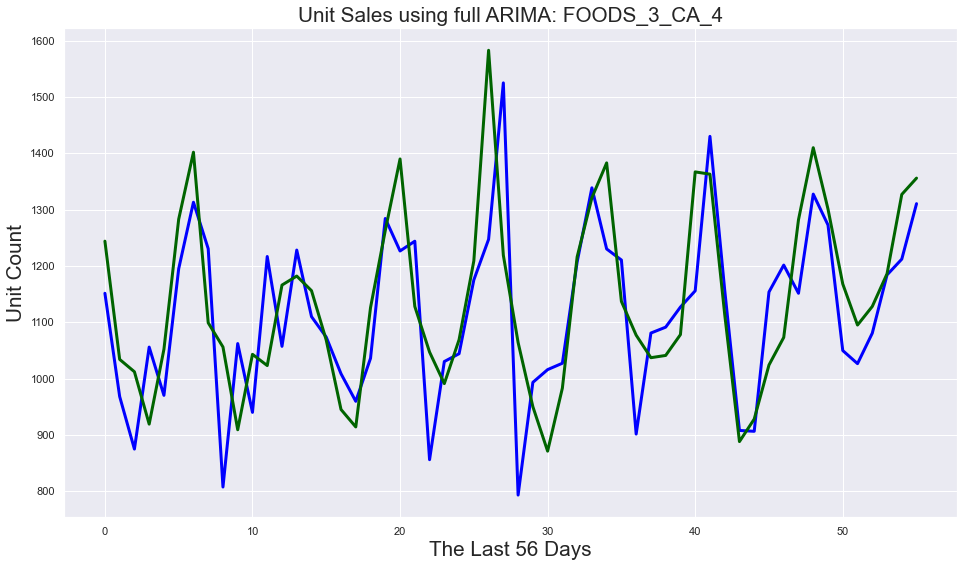

FOODS_3_TX_1 Test RMSE: 280.990


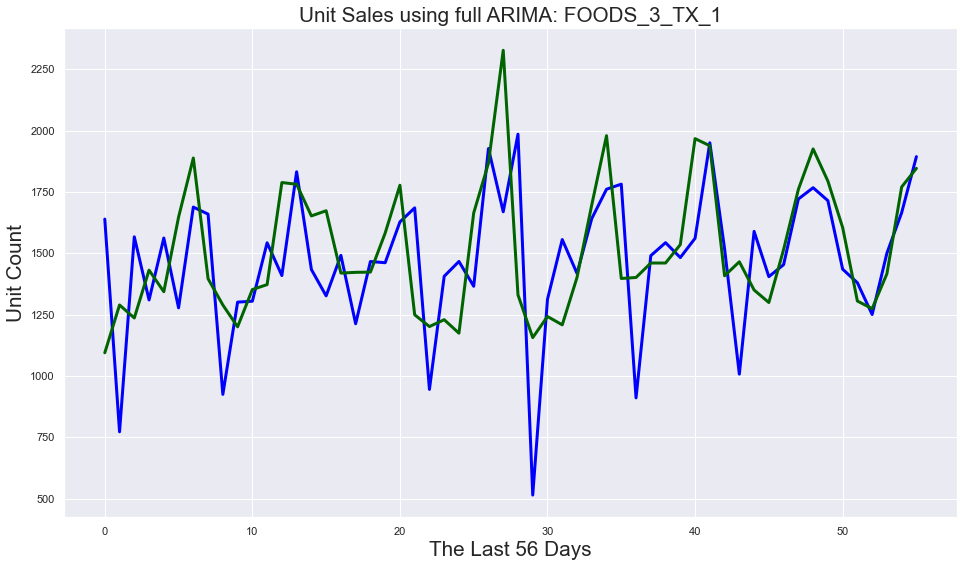

D:\Anaconda\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


FOODS_3_TX_2 Test RMSE: 359.000


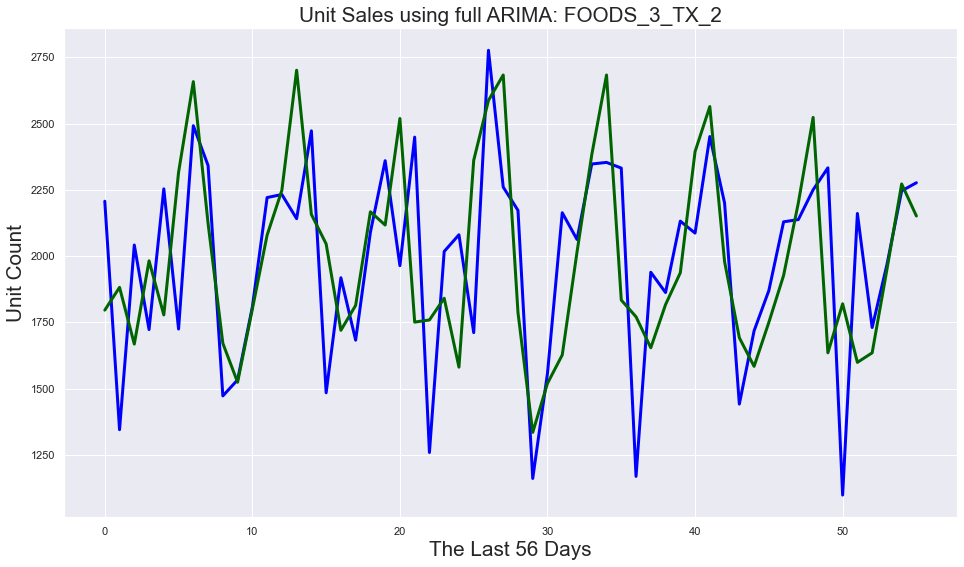

FOODS_3_TX_3 Test RMSE: 236.850


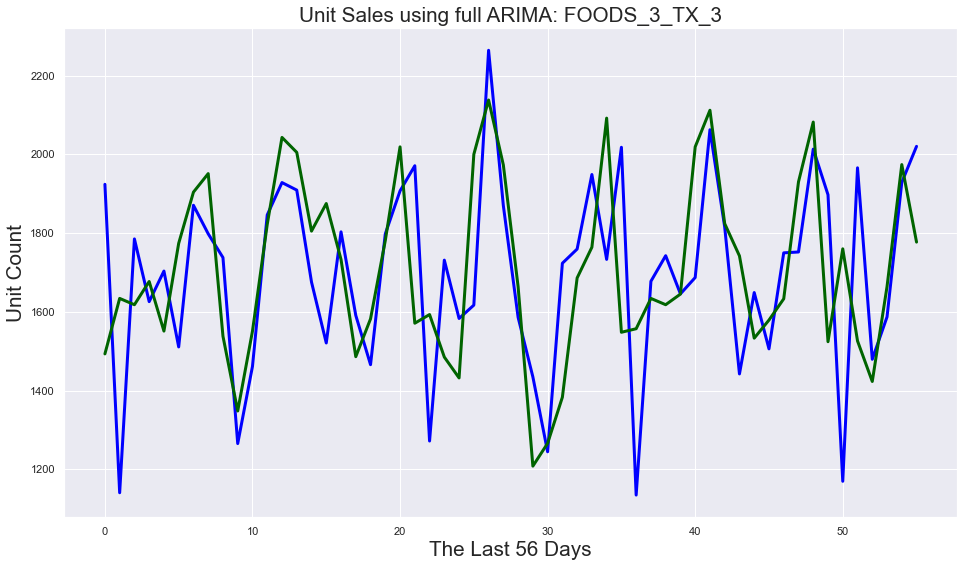

D:\Anaconda\lib\site-packages\statsmodels\tsa\kalmanf\kalmanfilter.py:221: RuntimeWarning: divide by zero encountered in true_divide
  Z_mat, R_mat, T_mat)
D:\Anaconda\lib\site-packages\statsmodels\base\model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


FOODS_3_WI_1 Test RMSE: 381.395


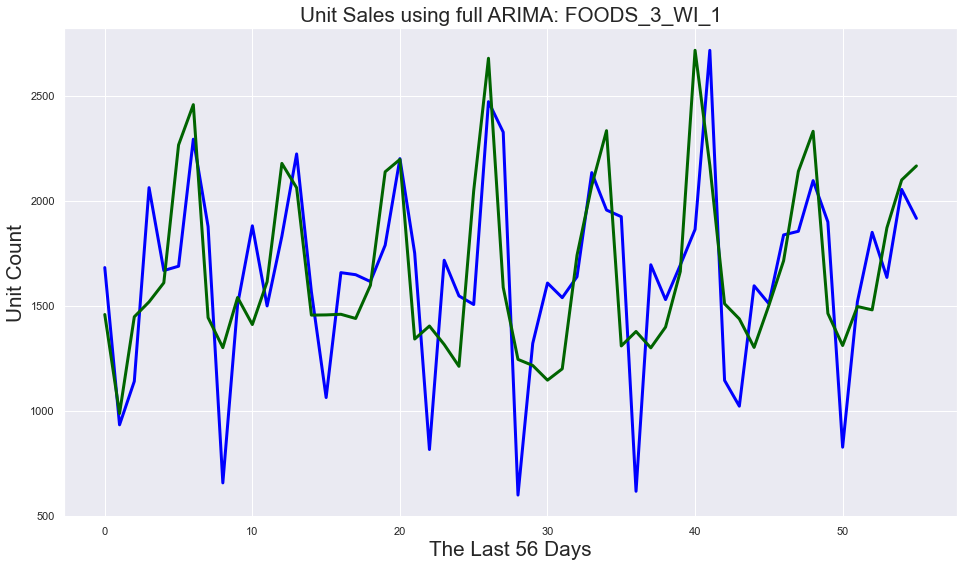

FOODS_3_WI_2 Test RMSE: 485.874


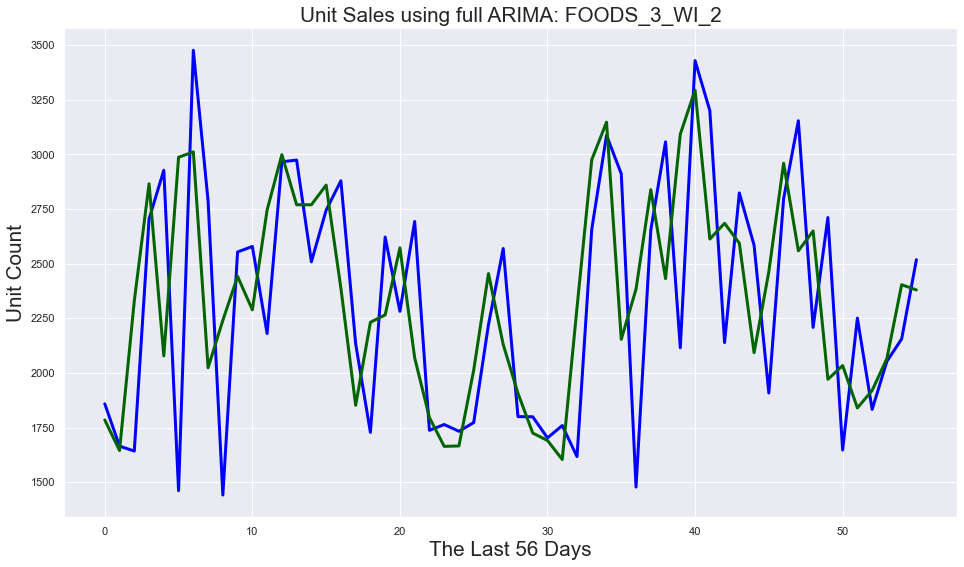

FOODS_3_WI_3 Test RMSE: 455.785


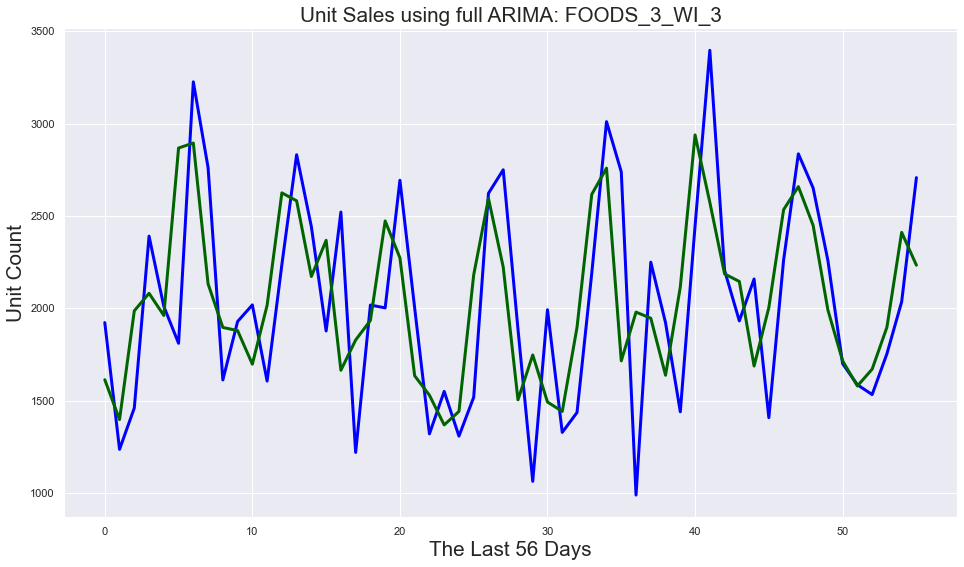

HOBBIES_1_CA_1 Test RMSE: 185.361


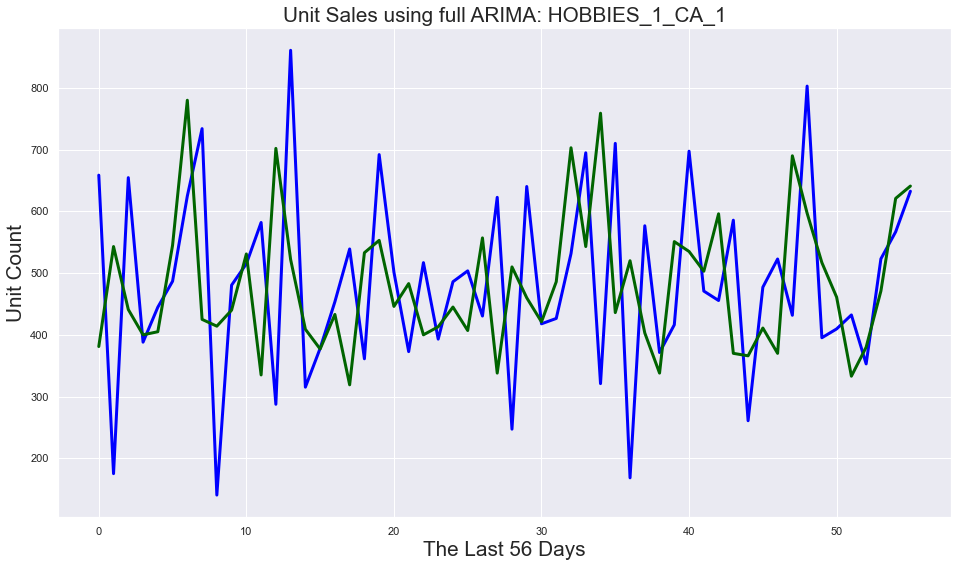

HOBBIES_1_CA_2 Test RMSE: 119.989


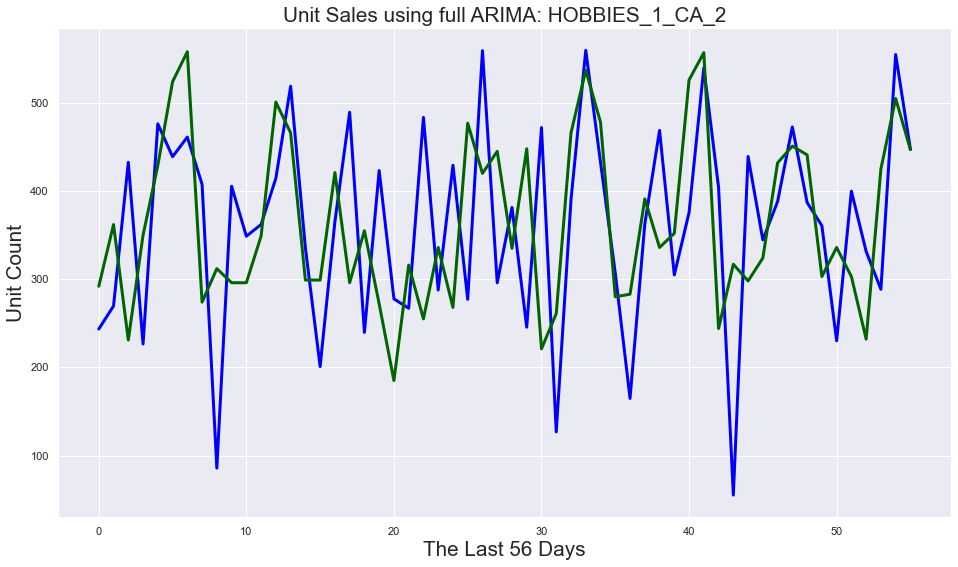

D:\Anaconda\lib\site-packages\statsmodels\base\model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
D:\Anaconda\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


HOBBIES_1_CA_3 Test RMSE: 155.034


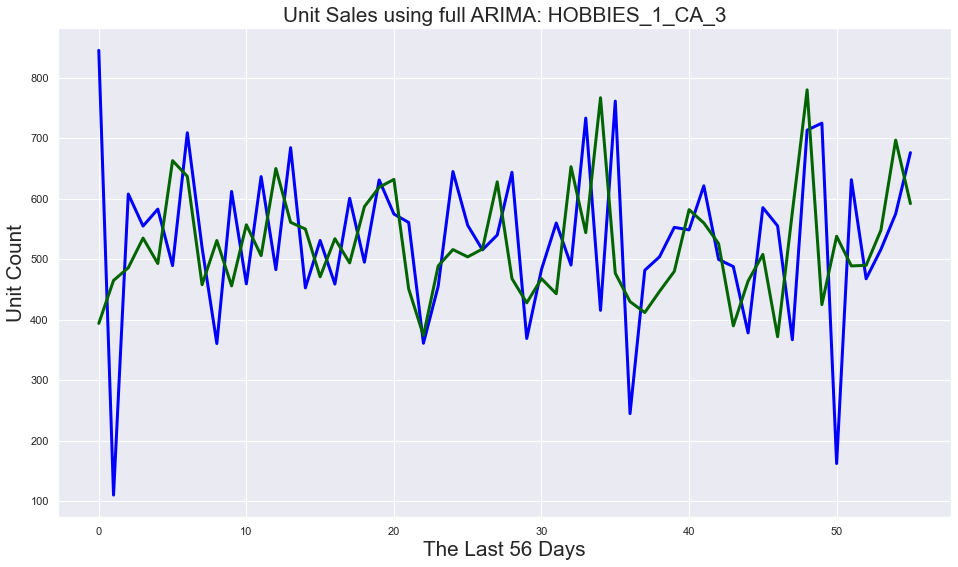

D:\Anaconda\lib\site-packages\statsmodels\base\model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
D:\Anaconda\lib\site-packages\statsmodels\base\model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


HOBBIES_1_CA_4 Test RMSE: 97.650


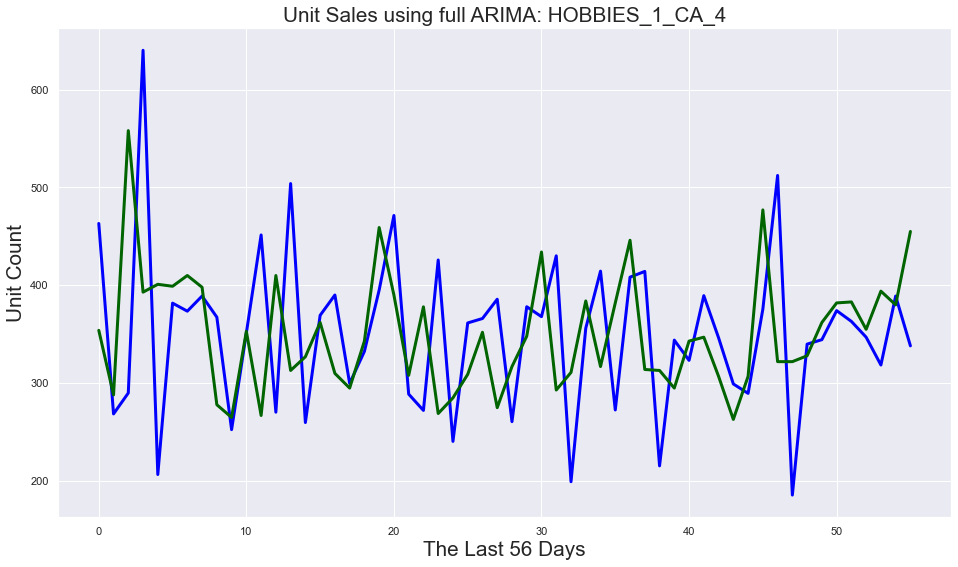

D:\Anaconda\lib\site-packages\statsmodels\base\model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
D:\Anaconda\lib\site-packages\statsmodels\base\model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


HOBBIES_1_TX_1 Test RMSE: 93.078


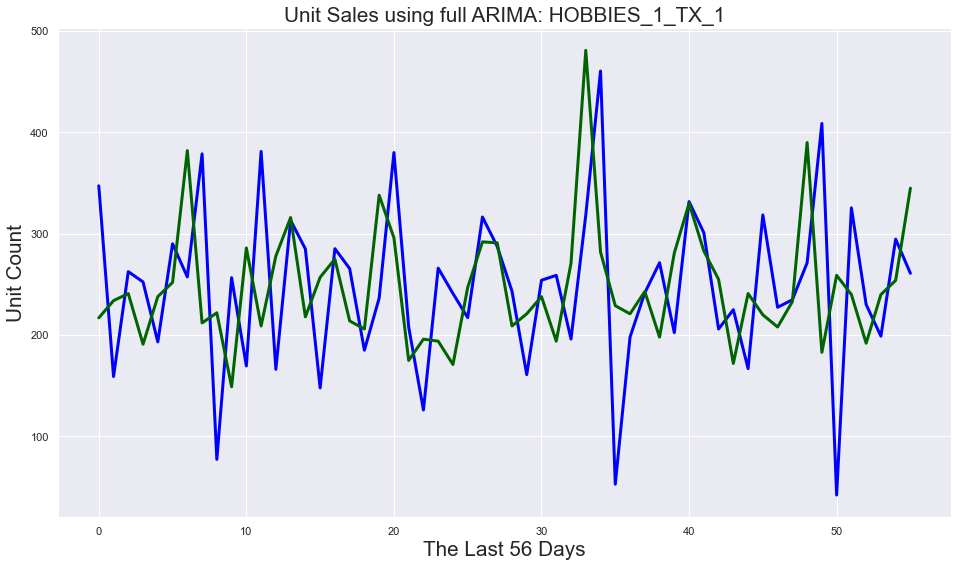

D:\Anaconda\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


HOBBIES_1_TX_2 Test RMSE: 78.112


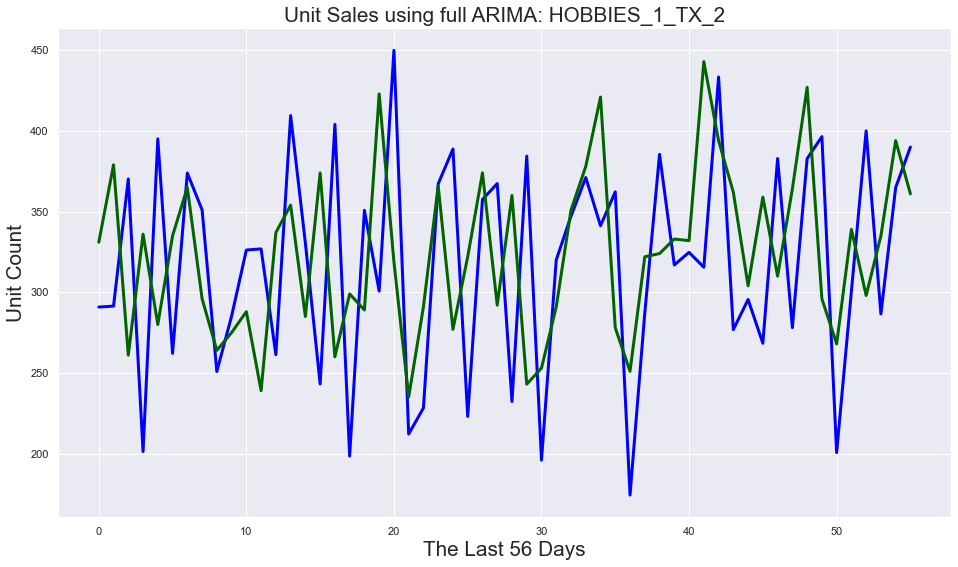

D:\Anaconda\lib\site-packages\statsmodels\base\model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


HOBBIES_1_TX_3 Test RMSE: 93.658


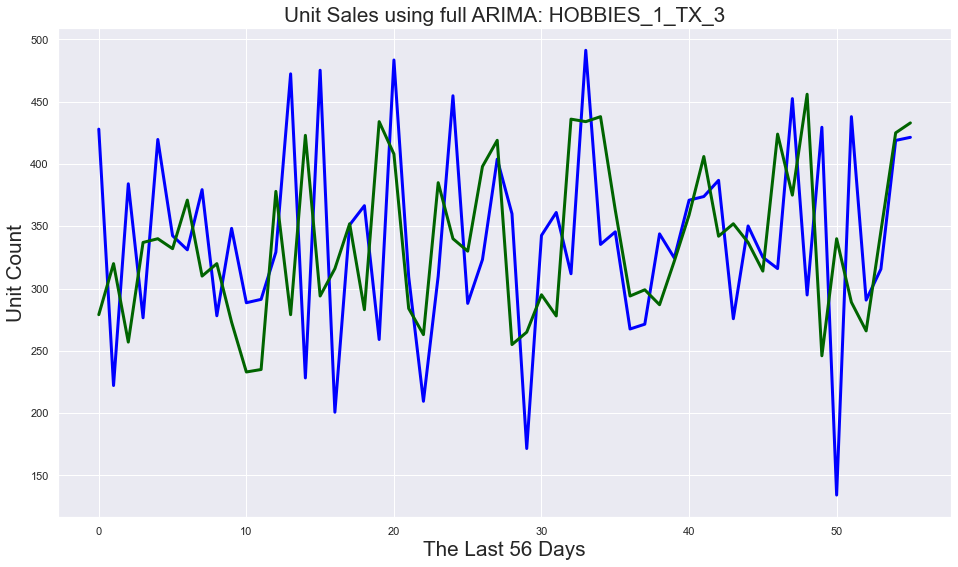

D:\Anaconda\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


HOBBIES_1_WI_1 Test RMSE: 134.726


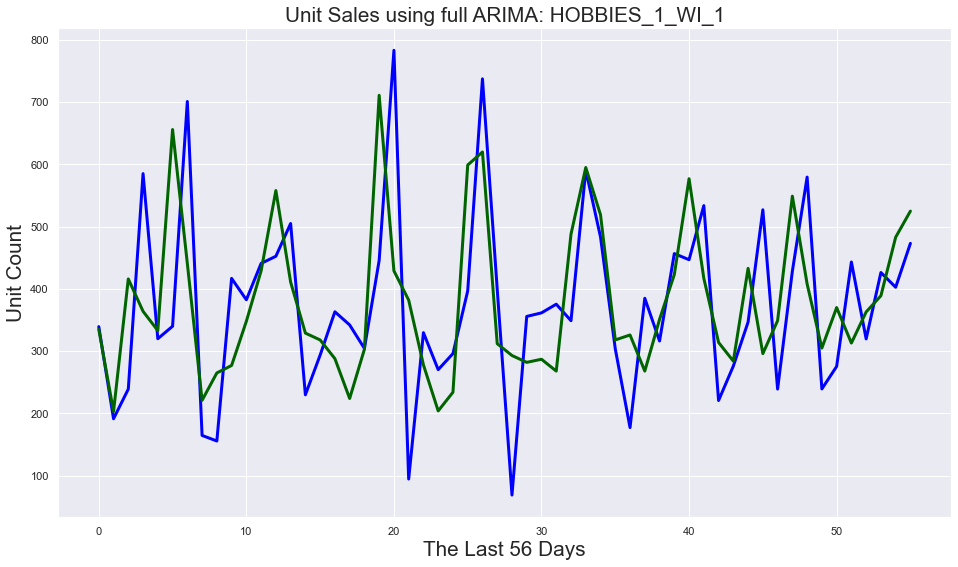

D:\Anaconda\lib\site-packages\statsmodels\base\model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
D:\Anaconda\lib\site-packages\statsmodels\tsa\kalmanf\kalmanfilter.py:221: RuntimeWarning: divide by zero encountered in true_divide
  Z_mat, R_mat, T_mat)
D:\Anaconda\lib\site-packages\statsmodels\base\model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


HOBBIES_1_WI_2 Test RMSE: 69.155


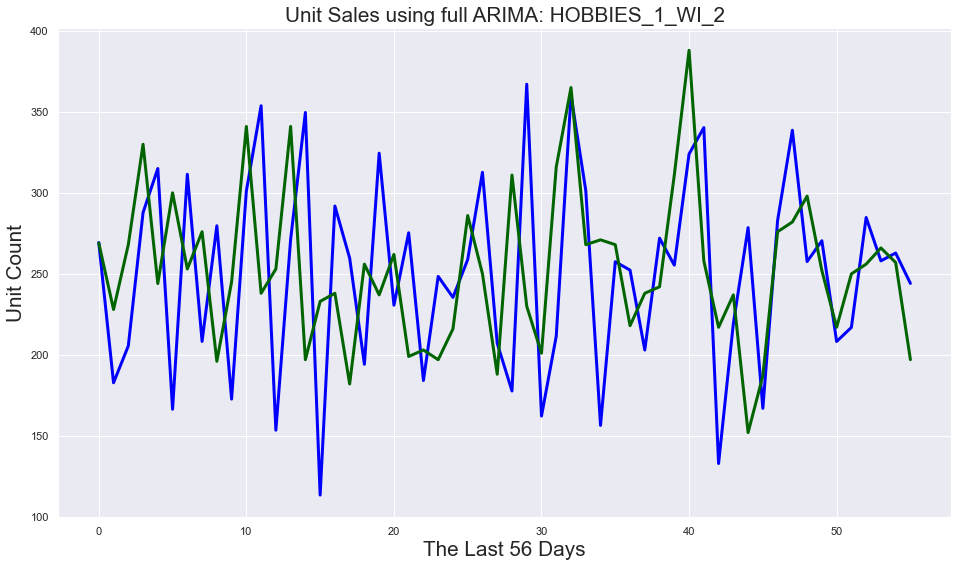

HOBBIES_1_WI_3 Test RMSE: 60.704


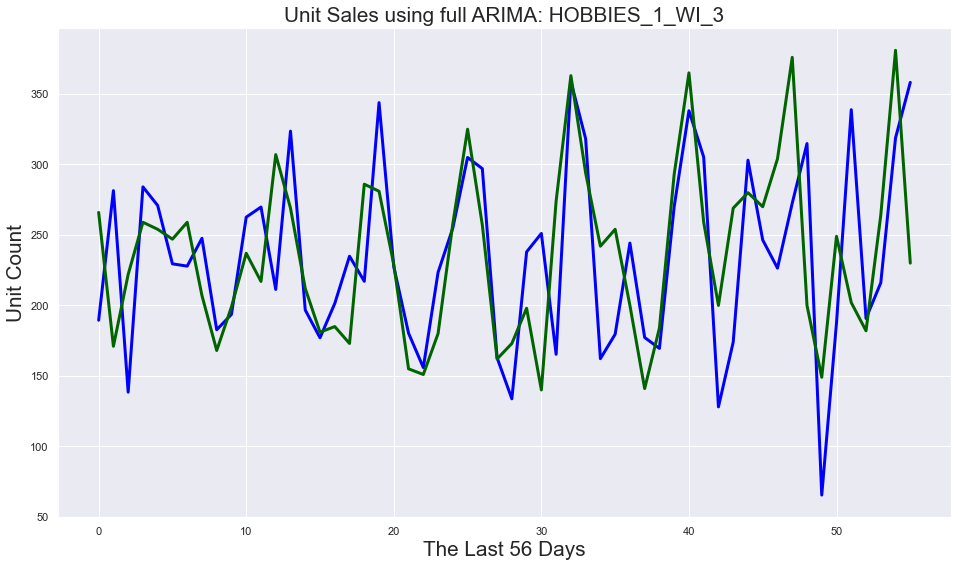

HOBBIES_2_CA_1 Test RMSE: 20.175


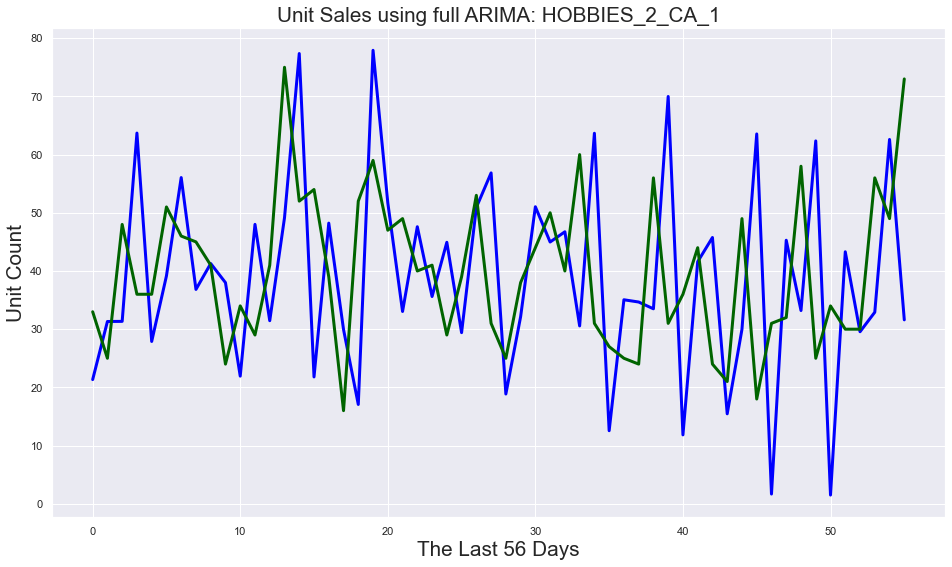

HOBBIES_2_CA_2 Test RMSE: 17.472


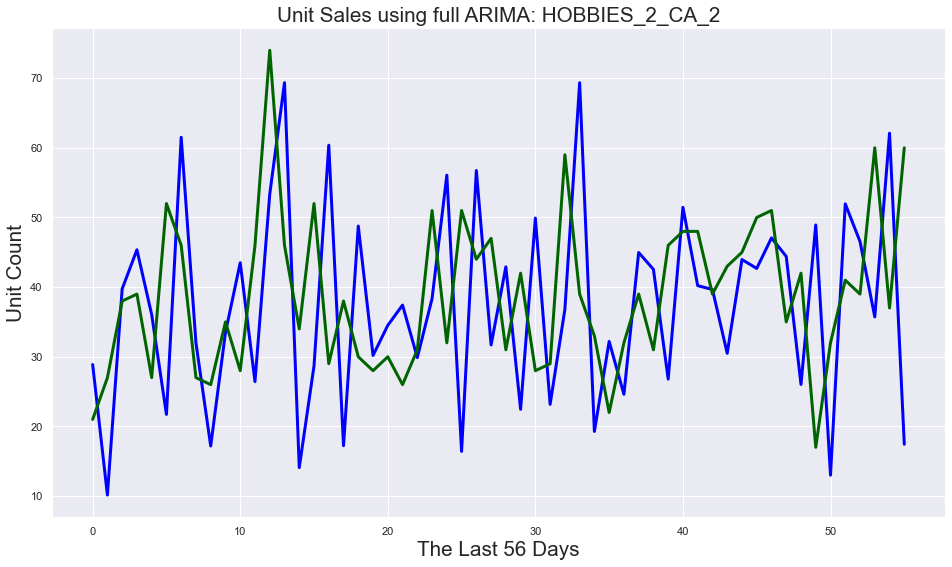

HOBBIES_2_CA_3 Test RMSE: 22.250


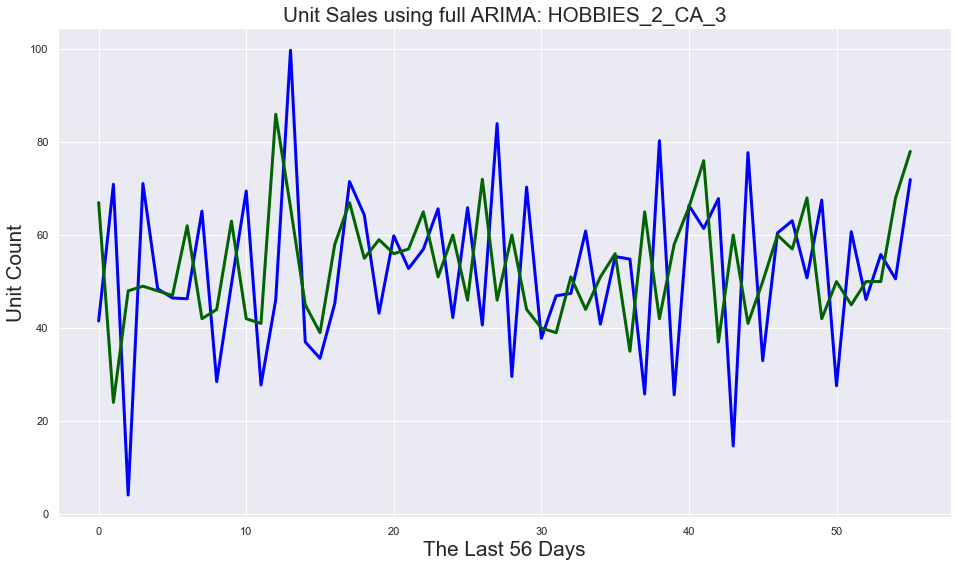

HOBBIES_2_CA_4 Test RMSE: 8.847


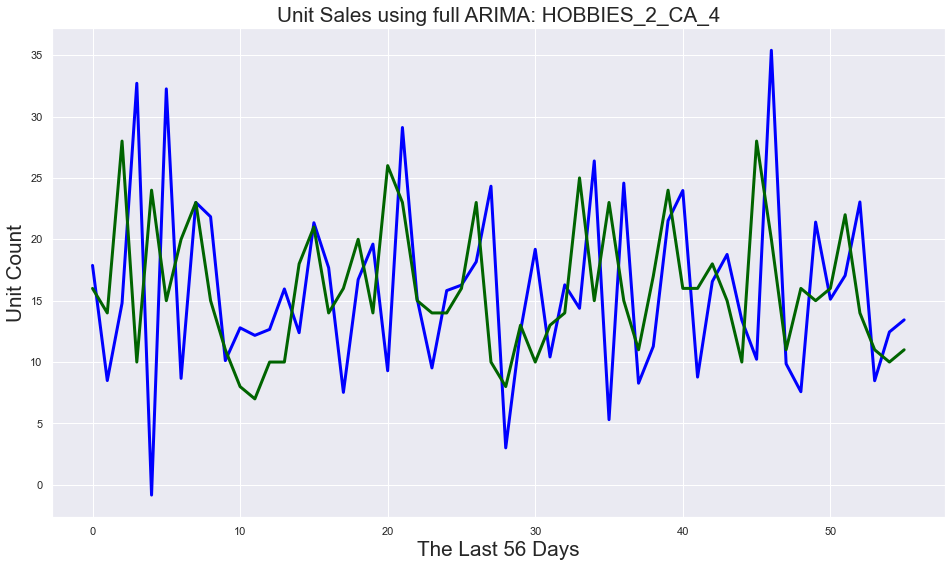

HOBBIES_2_TX_1 Test RMSE: 15.726


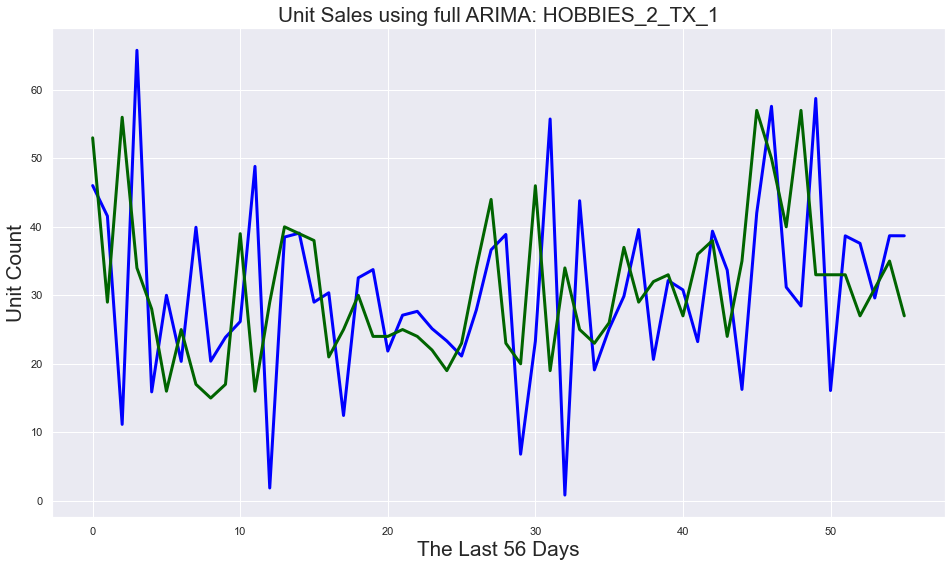

HOBBIES_2_TX_2 Test RMSE: 29.506


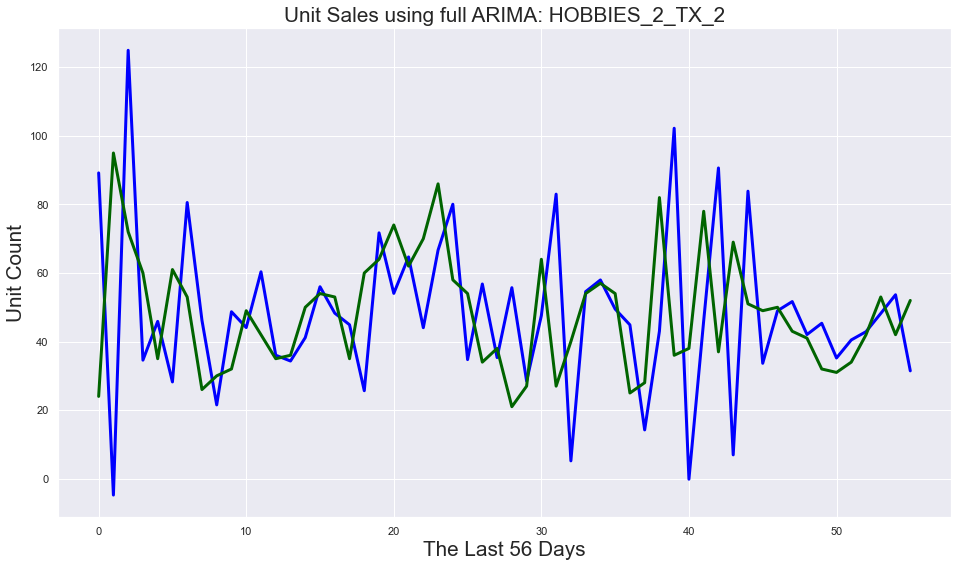

HOBBIES_2_TX_3 Test RMSE: 24.391


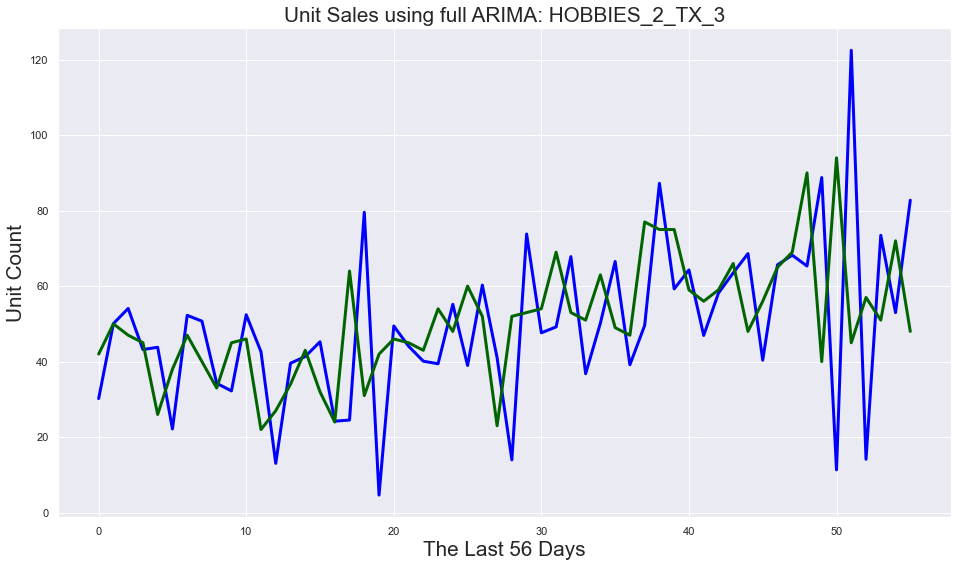

HOBBIES_2_WI_1 Test RMSE: 17.992


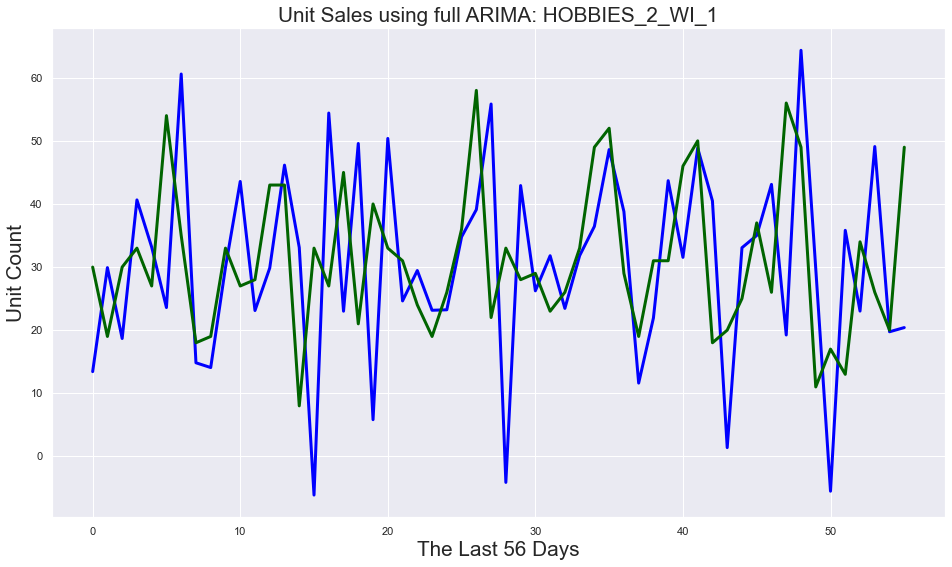

HOBBIES_2_WI_2 Test RMSE: 18.263


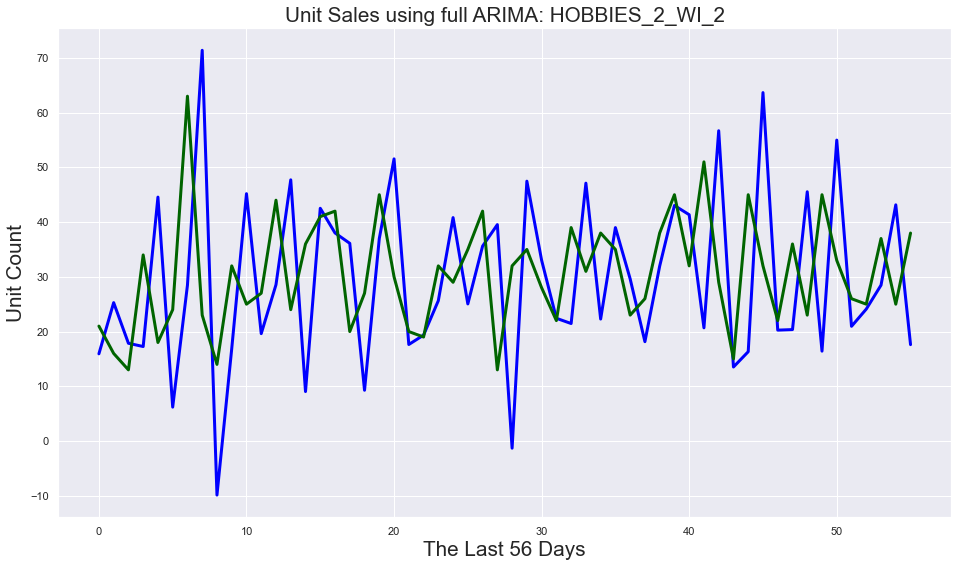

HOBBIES_2_WI_3 Test RMSE: 18.709


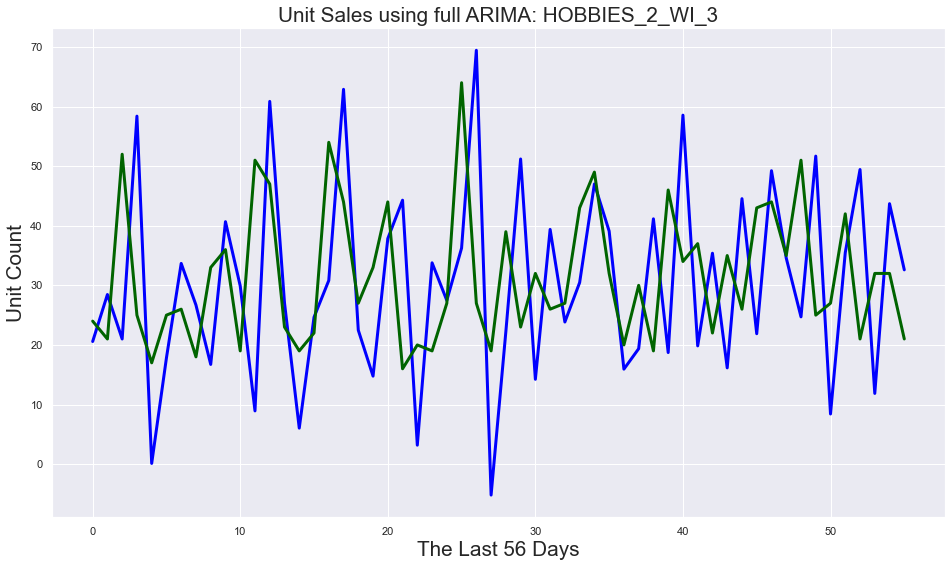

D:\Anaconda\lib\site-packages\statsmodels\tsa\kalmanf\kalmanfilter.py:221: RuntimeWarning: divide by zero encountered in true_divide
  Z_mat, R_mat, T_mat)
D:\Anaconda\lib\site-packages\statsmodels\base\model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
D:\Anaconda\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
D:\Anaconda\lib\site-packages\statsmodels\base\model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
D:\Anaconda\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
D:\Anaconda\lib\site-packages\statsmodels\base\model.py:492: HessianInversionWarning: Inve

HOUSEHOLD_1_CA_1 Test RMSE: 148.844


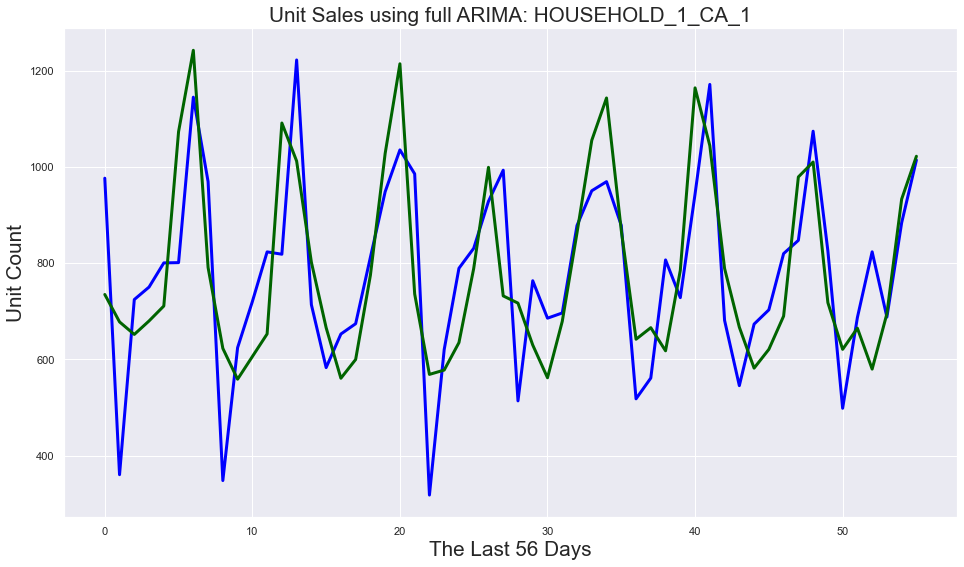

D:\Anaconda\lib\site-packages\statsmodels\tsa\kalmanf\kalmanfilter.py:221: RuntimeWarning: divide by zero encountered in true_divide
  Z_mat, R_mat, T_mat)
D:\Anaconda\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
D:\Anaconda\lib\site-packages\statsmodels\base\model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
D:\Anaconda\lib\site-packages\statsmodels\base\model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
D:\Anaconda\lib\site-packages\statsmodels\base\model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
D:\Anaconda\lib\site-packages\statsmodels\tsa\tsatools.py:668: RuntimeWarning: invalid value encounte

HOUSEHOLD_1_CA_2 Test RMSE: 230.709


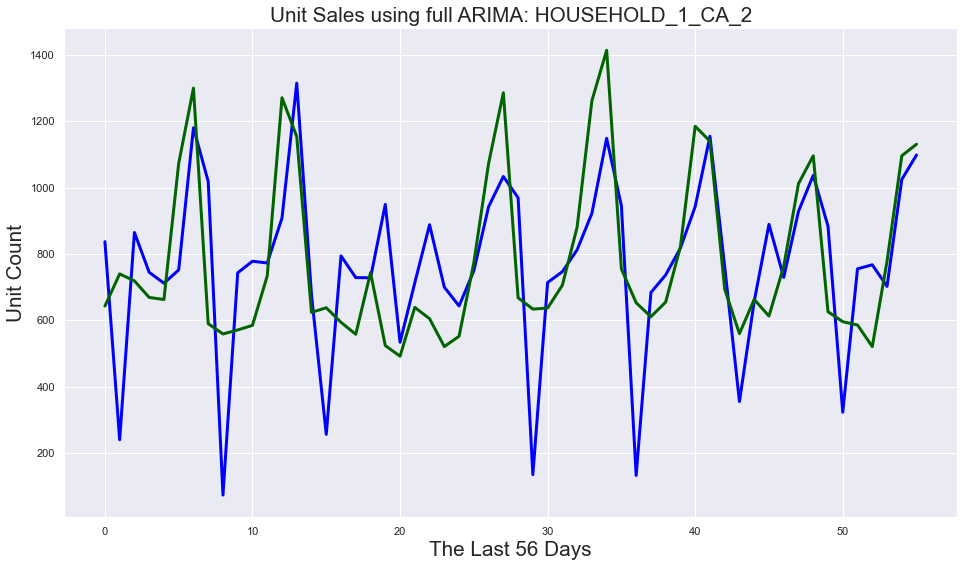

D:\Anaconda\lib\site-packages\statsmodels\tsa\kalmanf\kalmanfilter.py:221: RuntimeWarning: divide by zero encountered in true_divide
  Z_mat, R_mat, T_mat)
D:\Anaconda\lib\site-packages\statsmodels\base\model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
D:\Anaconda\lib\site-packages\statsmodels\base\model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


HOUSEHOLD_1_CA_3 Test RMSE: 212.022


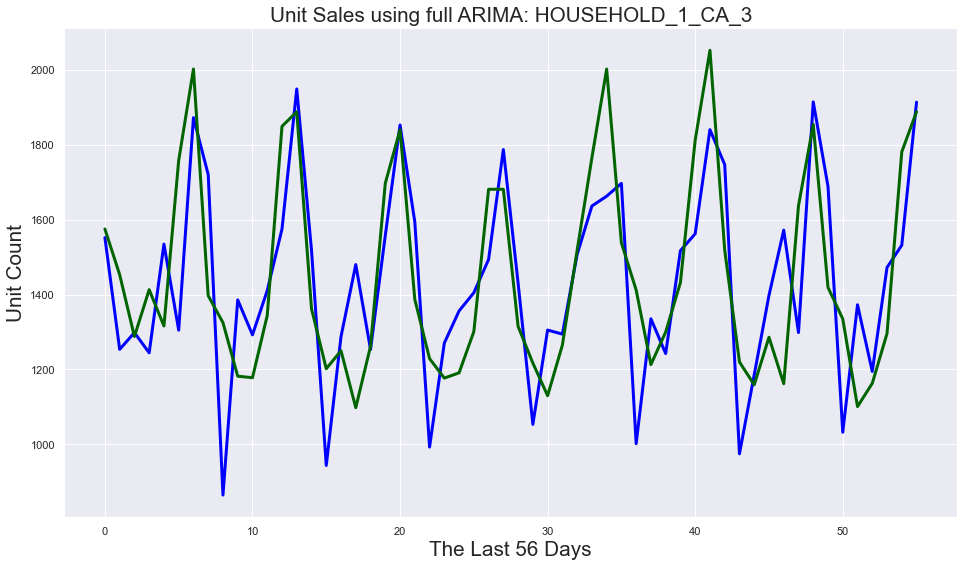

D:\Anaconda\lib\site-packages\statsmodels\base\model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
D:\Anaconda\lib\site-packages\statsmodels\tsa\kalmanf\kalmanfilter.py:221: RuntimeWarning: divide by zero encountered in true_divide
  Z_mat, R_mat, T_mat)
D:\Anaconda\lib\site-packages\statsmodels\base\model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
D:\Anaconda\lib\site-packages\statsmodels\base\model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
D:\Anaconda\lib\site-packages\statsmodels\base\model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
D:\Anaconda\lib\site-packages\statsmodels\base\model.py:492: HessianInversionWarning: Inverting hessian failed, 

HOUSEHOLD_1_CA_4 Test RMSE: 72.123


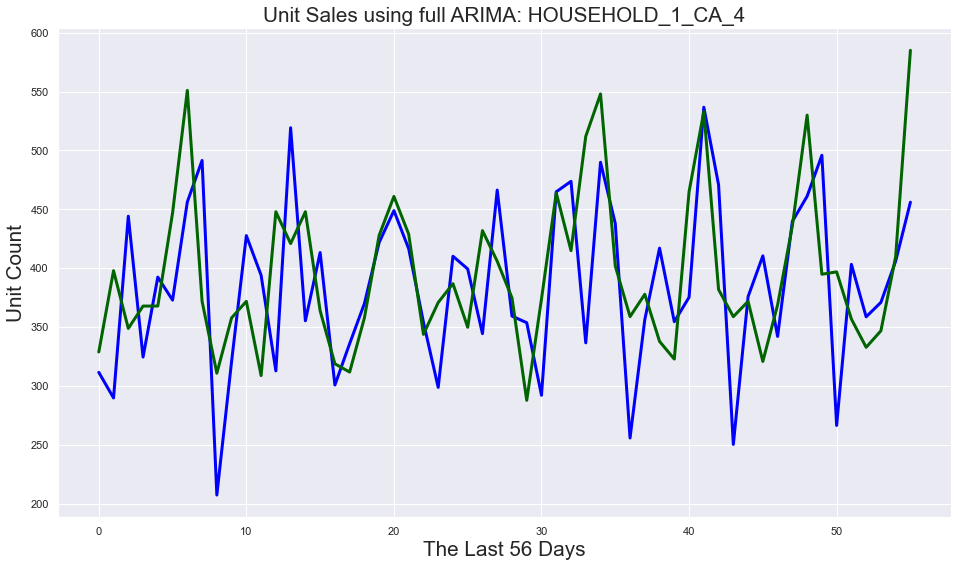

D:\Anaconda\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
D:\Anaconda\lib\site-packages\statsmodels\tsa\kalmanf\kalmanfilter.py:221: RuntimeWarning: divide by zero encountered in true_divide
  Z_mat, R_mat, T_mat)
D:\Anaconda\lib\site-packages\statsmodels\base\model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
D:\Anaconda\lib\site-packages\statsmodels\base\model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


HOUSEHOLD_1_TX_1 Test RMSE: 154.219


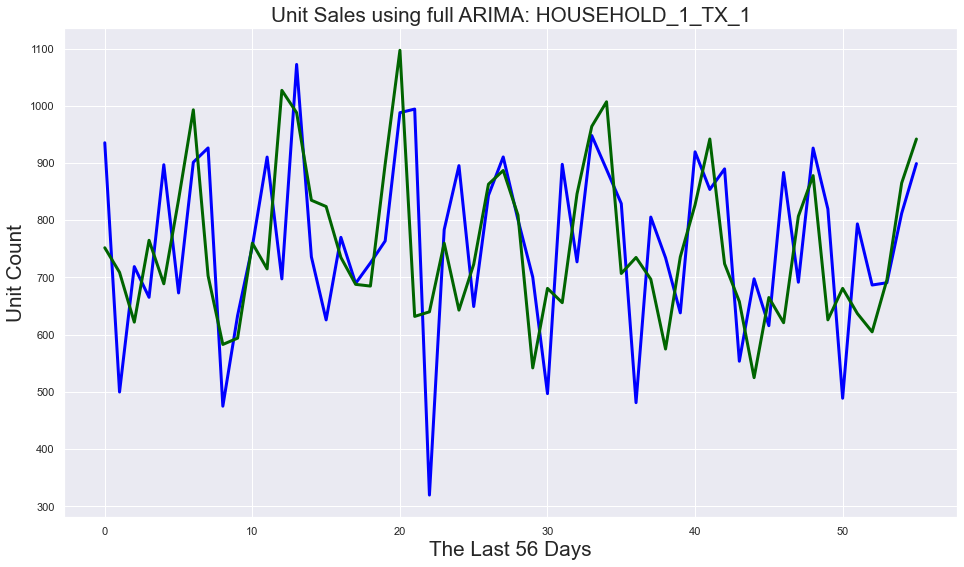

D:\Anaconda\lib\site-packages\statsmodels\tsa\kalmanf\kalmanfilter.py:221: RuntimeWarning: divide by zero encountered in true_divide
  Z_mat, R_mat, T_mat)
D:\Anaconda\lib\site-packages\statsmodels\base\model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
D:\Anaconda\lib\site-packages\statsmodels\base\model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
D:\Anaconda\lib\site-packages\statsmodels\tsa\tsatools.py:668: RuntimeWarning: invalid value encountered in true_divide
  newparams = ((1-np.exp(-params))/(1+np.exp(-params))).copy()
D:\Anaconda\lib\site-packages\statsmodels\tsa\tsatools.py:669: RuntimeWarning: invalid value encountered in true_divide
  tmp = ((1-np.exp(-params))/(1+np.exp(-params))).copy()
D:\Anaconda\lib\site-packages\statsmodels\base\model.py:492: HessianInversionWarning: Inverting hessian failed, no bse

HOUSEHOLD_1_TX_2 Test RMSE: 171.991


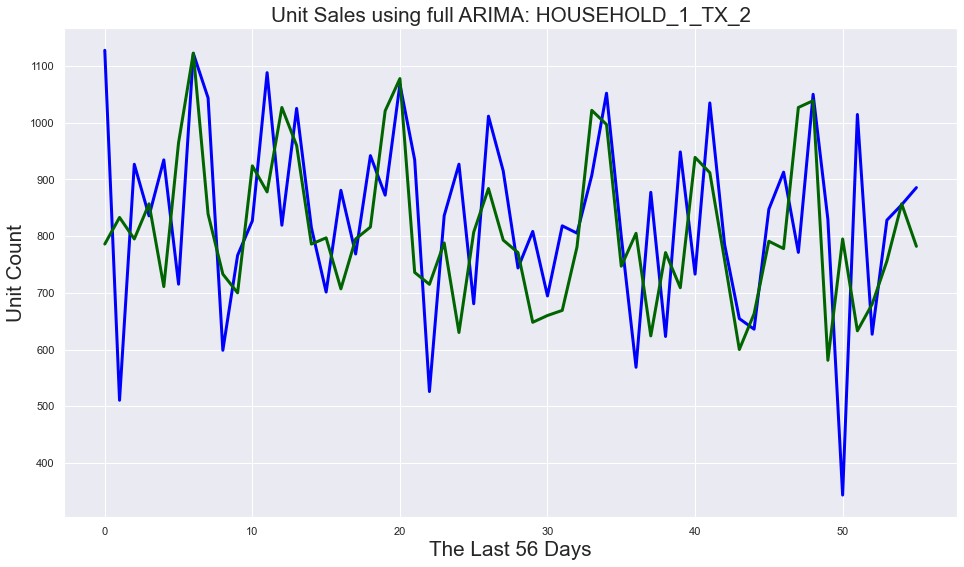

D:\Anaconda\lib\site-packages\statsmodels\base\model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
D:\Anaconda\lib\site-packages\statsmodels\base\model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


HOUSEHOLD_1_TX_3 Test RMSE: 149.672


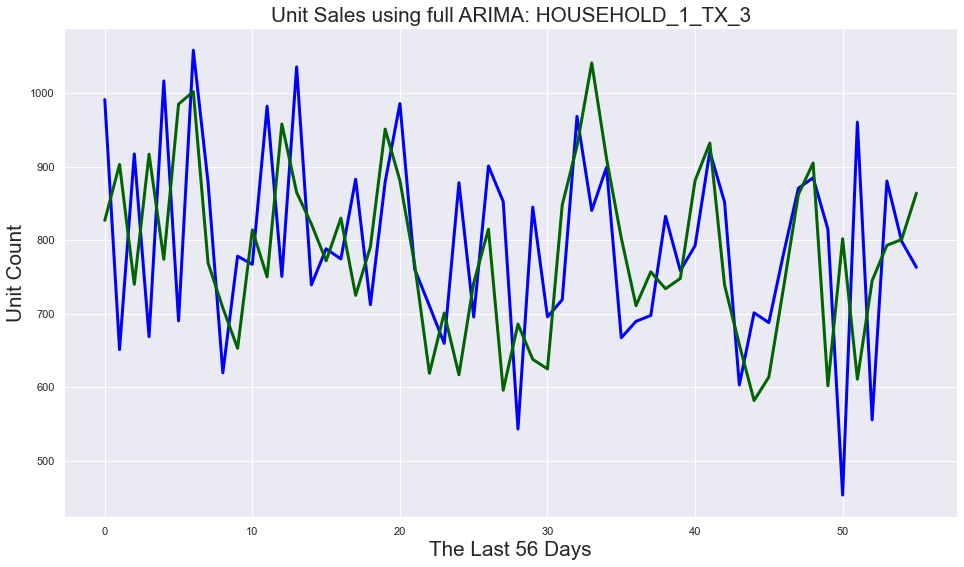

D:\Anaconda\lib\site-packages\statsmodels\base\model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
D:\Anaconda\lib\site-packages\statsmodels\base\model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
D:\Anaconda\lib\site-packages\statsmodels\base\model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
D:\Anaconda\lib\site-packages\statsmodels\base\model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
D:\Anaconda\lib\site-packages\statsmodels\tsa\kalmanf\kalmanfilter.py:221: RuntimeWarning: divide by zero encountered in true_divide
  Z_mat, R_mat, T_mat)
D:\Anaconda\lib\site-packages\statsmodels\tsa\tsatools.py:668: RuntimeWarning: invalid value encountered in true

HOUSEHOLD_1_WI_1 Test RMSE: 149.217


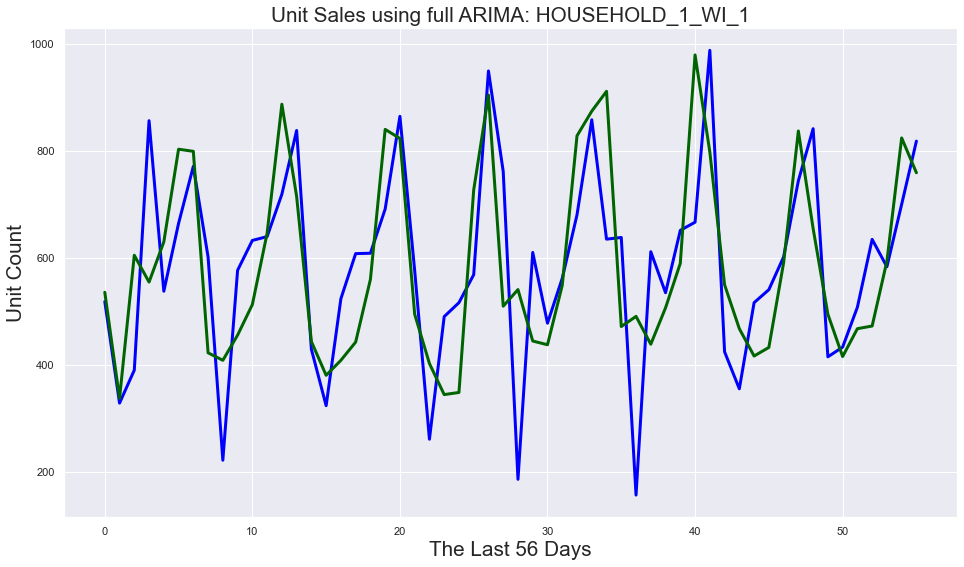

HOUSEHOLD_1_WI_2 Test RMSE: 288.468


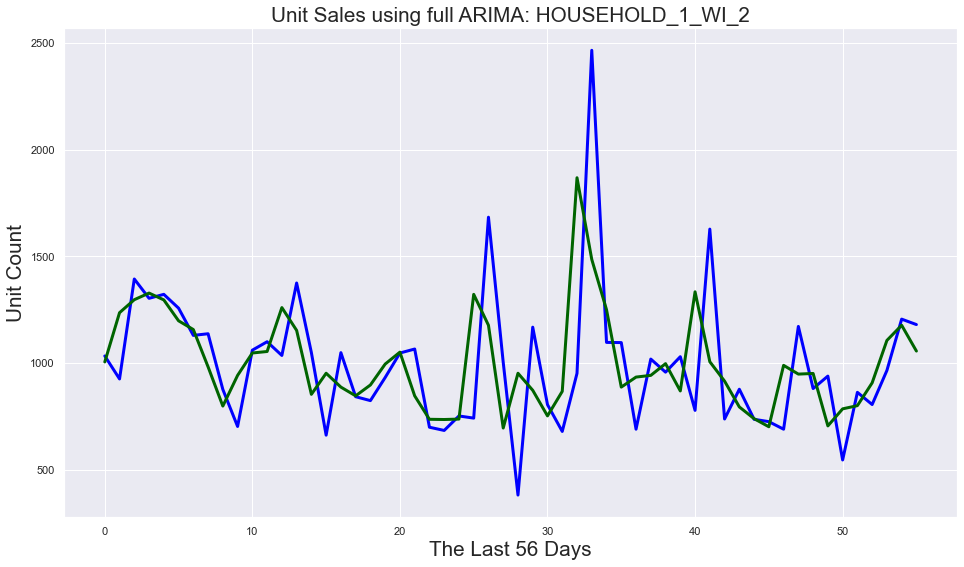

D:\Anaconda\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


HOUSEHOLD_1_WI_3 Test RMSE: 187.194


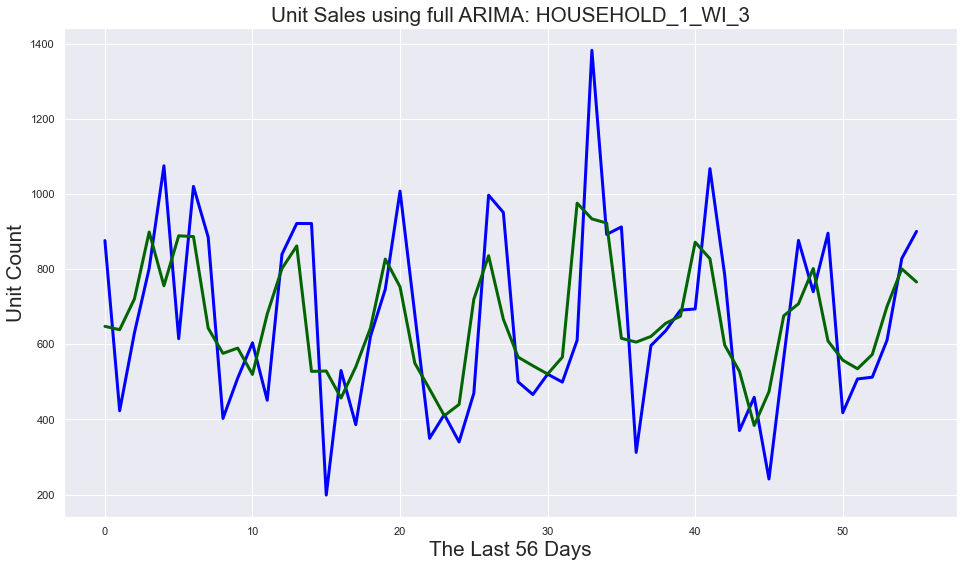

D:\Anaconda\lib\site-packages\statsmodels\base\model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


HOUSEHOLD_2_CA_1 Test RMSE: 53.505


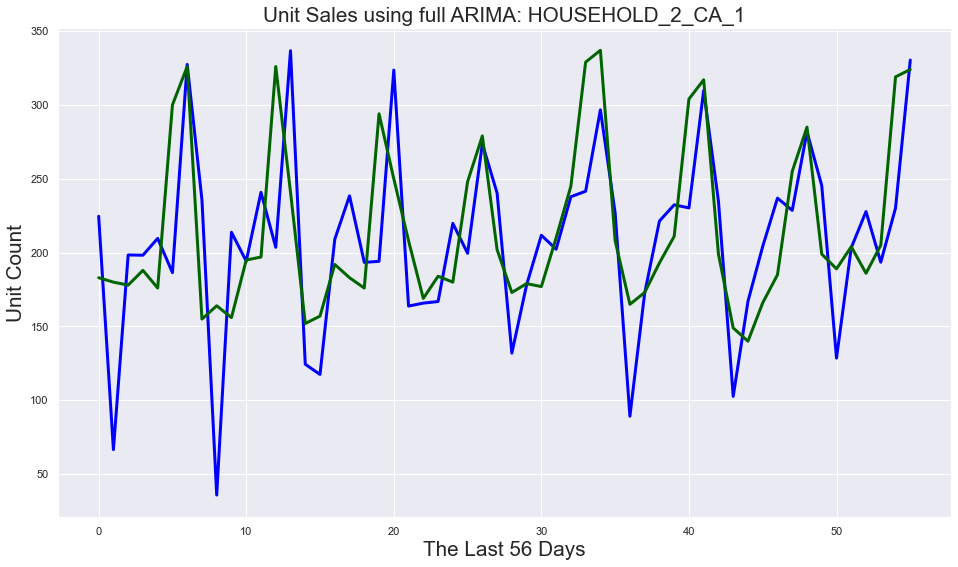

D:\Anaconda\lib\site-packages\statsmodels\base\model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
D:\Anaconda\lib\site-packages\statsmodels\tsa\kalmanf\kalmanfilter.py:221: RuntimeWarning: divide by zero encountered in true_divide
  Z_mat, R_mat, T_mat)
D:\Anaconda\lib\site-packages\statsmodels\base\model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
D:\Anaconda\lib\site-packages\statsmodels\base\model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
D:\Anaconda\lib\site-packages\statsmodels\base\model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


HOUSEHOLD_2_CA_2 Test RMSE: 79.740


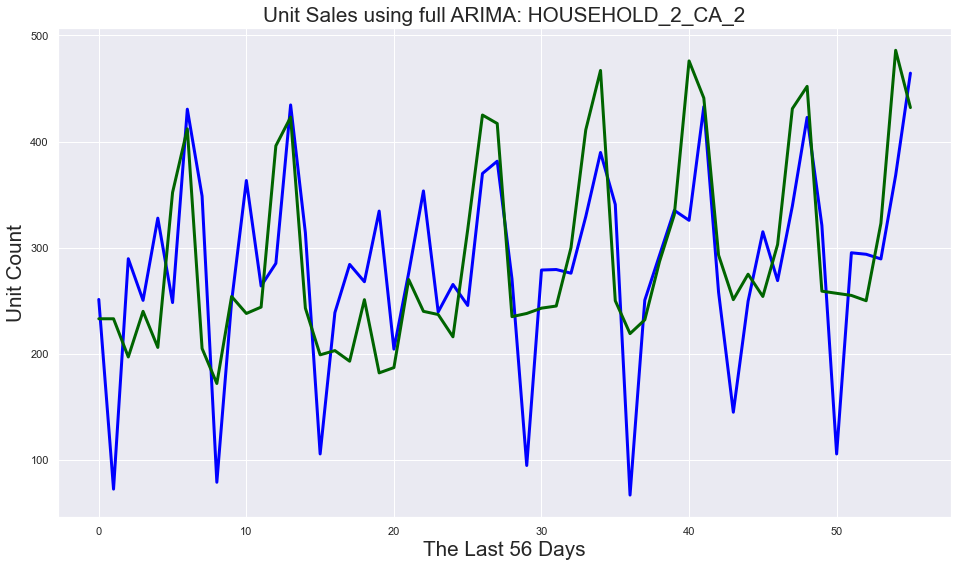

D:\Anaconda\lib\site-packages\statsmodels\base\model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


HOUSEHOLD_2_CA_3 Test RMSE: 56.058


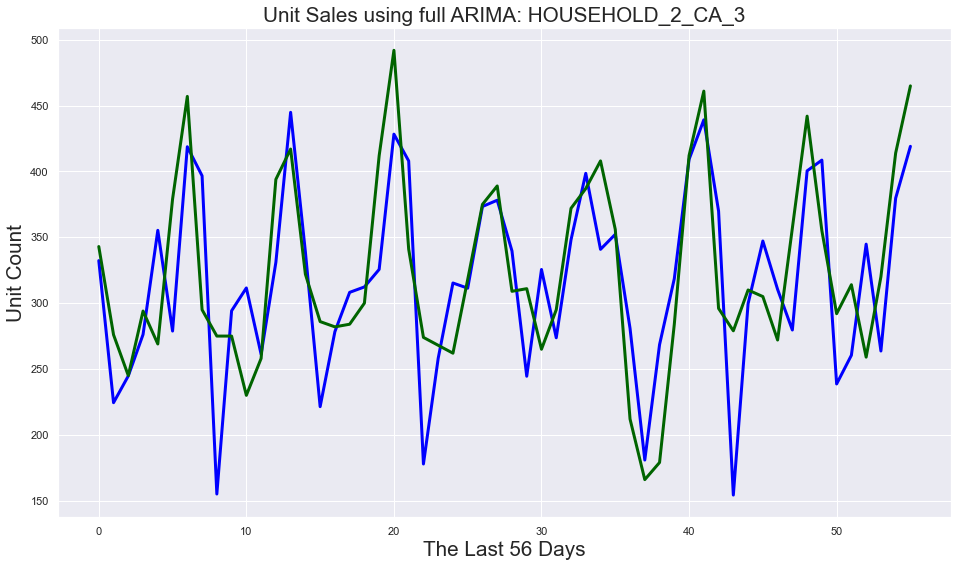

D:\Anaconda\lib\site-packages\statsmodels\base\model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
D:\Anaconda\lib\site-packages\statsmodels\base\model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
D:\Anaconda\lib\site-packages\statsmodels\base\model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
D:\Anaconda\lib\site-packages\statsmodels\base\model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
D:\Anaconda\lib\site-packages\statsmodels\base\model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
D:\Anaconda\lib\site-packages\statsmodels\base\model.py:492: HessianInversionWarning:

HOUSEHOLD_2_CA_4 Test RMSE: 37.079


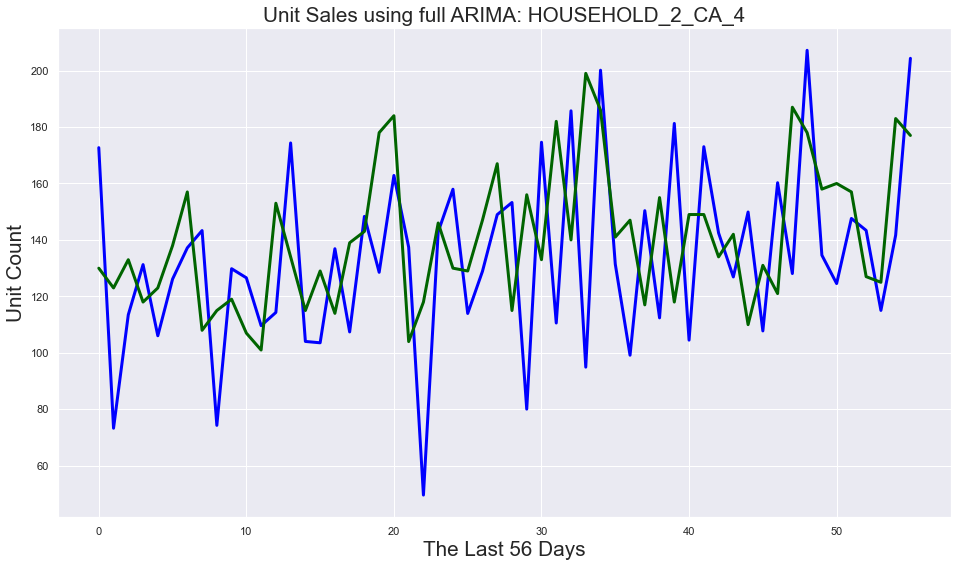

D:\Anaconda\lib\site-packages\statsmodels\tsa\kalmanf\kalmanfilter.py:221: RuntimeWarning: divide by zero encountered in true_divide
  Z_mat, R_mat, T_mat)
D:\Anaconda\lib\site-packages\statsmodels\base\model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
D:\Anaconda\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


HOUSEHOLD_2_TX_1 Test RMSE: 54.997


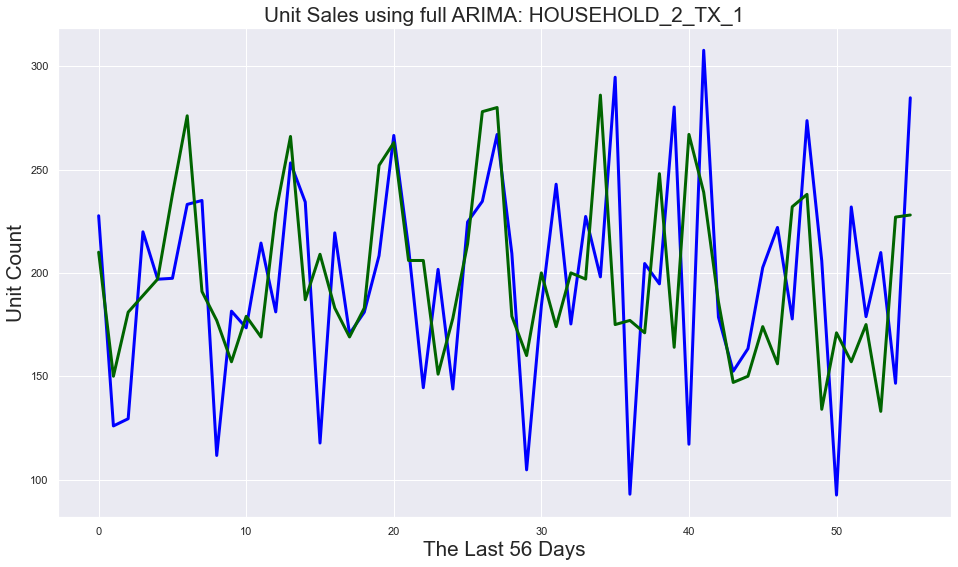

HOUSEHOLD_2_TX_2 Test RMSE: 45.862


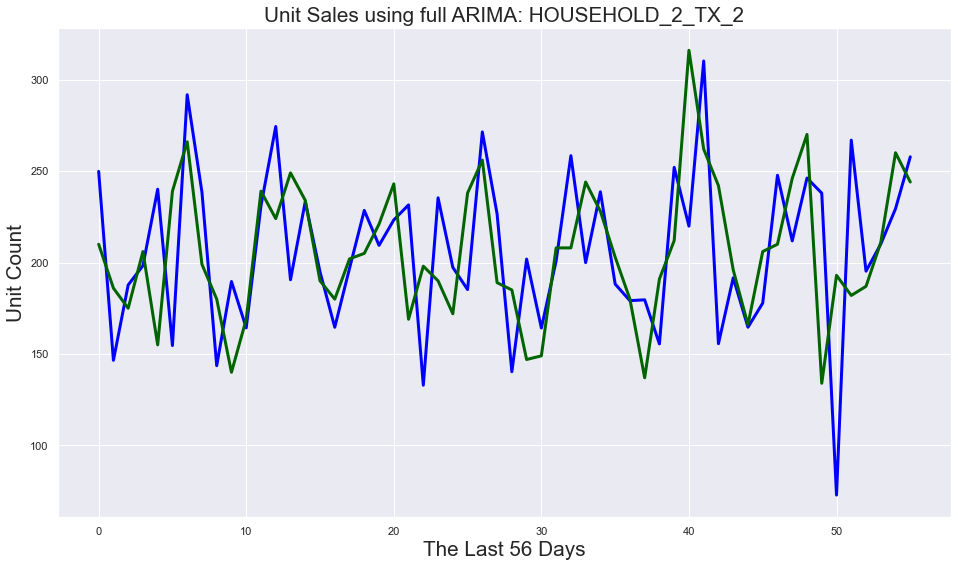

D:\Anaconda\lib\site-packages\statsmodels\base\model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
D:\Anaconda\lib\site-packages\statsmodels\base\model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
D:\Anaconda\lib\site-packages\statsmodels\tsa\kalmanf\kalmanfilter.py:221: RuntimeWarning: divide by zero encountered in true_divide
  Z_mat, R_mat, T_mat)
D:\Anaconda\lib\site-packages\statsmodels\base\model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
D:\Anaconda\lib\site-packages\statsmodels\base\model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
D:\Anaconda\lib\site-packages\statsmodels\base\model.py:492: HessianInversionWarning: Inverting hessian failed, 

HOUSEHOLD_2_TX_3 Test RMSE: 39.990


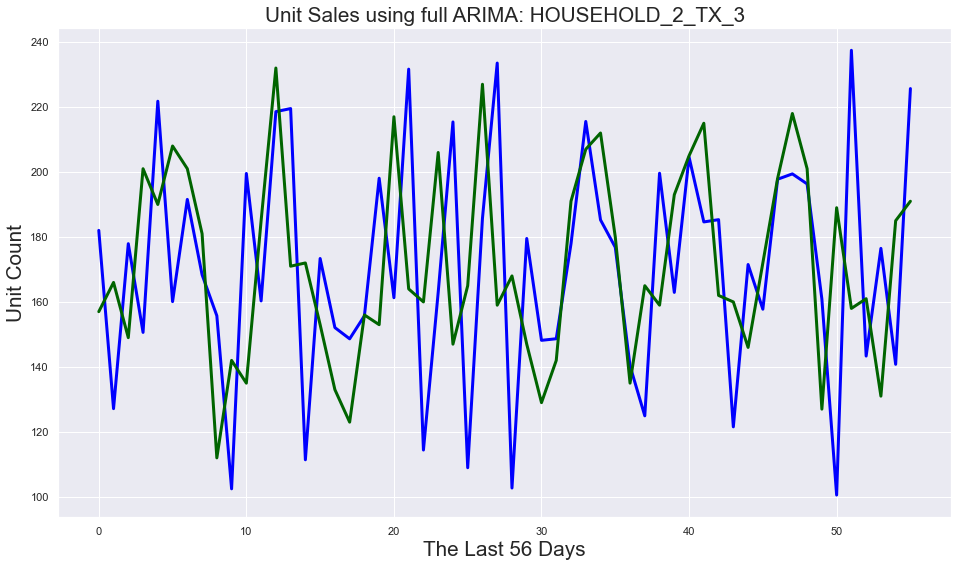

HOUSEHOLD_2_WI_1 Test RMSE: 42.726


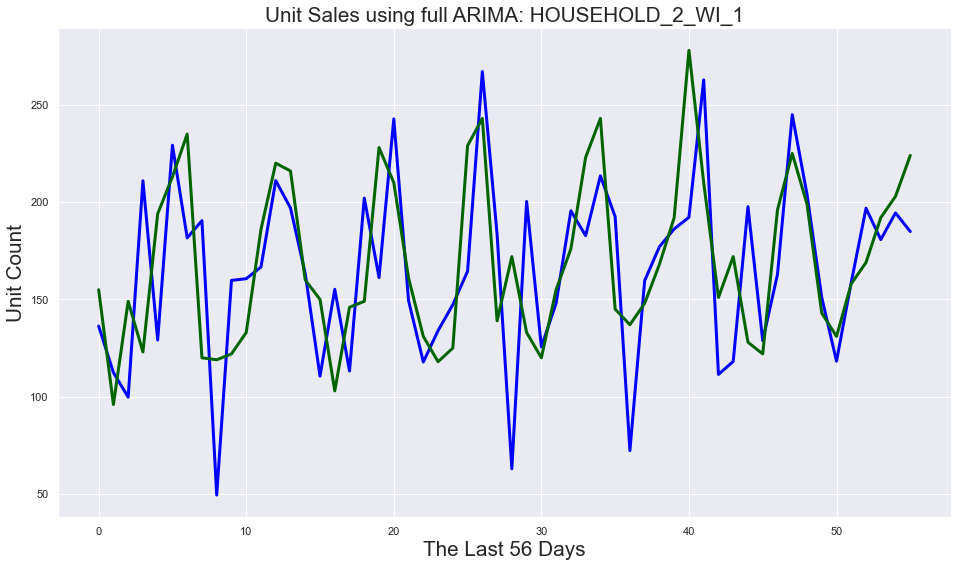

HOUSEHOLD_2_WI_2 Test RMSE: 28.495


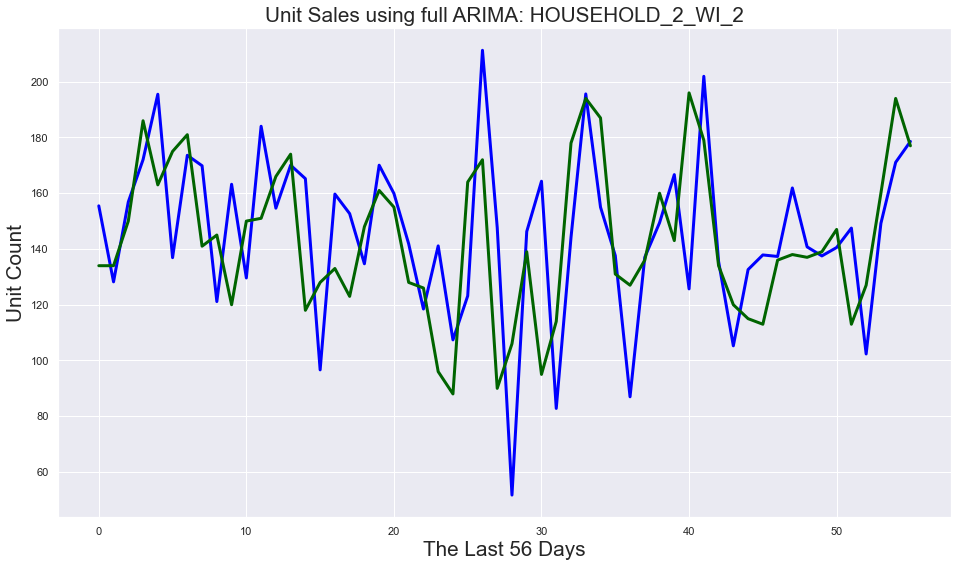

D:\Anaconda\lib\site-packages\statsmodels\tsa\kalmanf\kalmanfilter.py:221: RuntimeWarning: divide by zero encountered in true_divide
  Z_mat, R_mat, T_mat)
D:\Anaconda\lib\site-packages\statsmodels\tsa\tsatools.py:668: RuntimeWarning: invalid value encountered in true_divide
  newparams = ((1-np.exp(-params))/(1+np.exp(-params))).copy()
D:\Anaconda\lib\site-packages\statsmodels\tsa\tsatools.py:669: RuntimeWarning: invalid value encountered in true_divide
  tmp = ((1-np.exp(-params))/(1+np.exp(-params))).copy()


HOUSEHOLD_2_WI_3 Test RMSE: 32.723


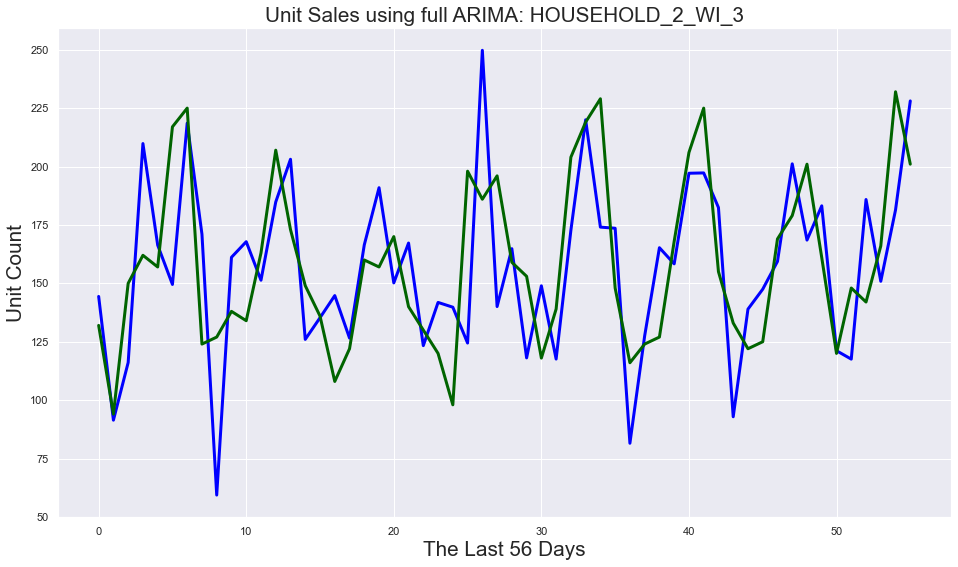

In [37]:
columns_and_CODs_ARIMA = []
for each_series in train_data_lvl9.columns[1:]:
    series = pd.Series(sales_pd_lvl9[each_series])
    X = series.values
    size = len(X) - 56
    train, test = X[0:size], X[size:]
    history = [x for x in train]
    predictions_ARIMA = list()
    observations_ARIMA = list()
    for t in range(len(test)):
        model = ARIMA(history, order=(1,0,1))
        model_fit = model.fit(trend='nc', disp=False)
        ar_coef, ma_coef = model_fit.arparams, model_fit.maparams
        resid = model_fit.resid
        diff = difference(history)
        yhat = history[-1] + predict_using_ARIMA(ar_coef, diff) + predict_using_ARIMA(ma_coef, resid)
        predictions_ARIMA.append(yhat)
        obs = test[t]
        history.append(obs)
        observations_ARIMA.append(obs)
        # print('>predicted=%.3f, expected=%.3f' % (yhat, obs))
    rmse = sqrt(mean_squared_error(test, predictions_ARIMA))
    print(str(each_series), 'Test RMSE: %.3f' % rmse)
    
    dict_of_this_column_and_its_COD = {
        "Column Name": each_series,
        "COD" : r2_score(Y_test, Y_pred),
        "RMSE" : rmse
    }
    columns_and_CODs_ARIMA.append(dict_of_this_column_and_its_COD)
    
    #print('Coefficient of determination: %.2f'
              #% r2_score(test, predictions_ARIMA))

    plt.plot(predictions_ARIMA, color='blue', linewidth=3)
    plt.plot(observations_ARIMA, color='darkgreen', linewidth=3)
    plt.title("Unit Sales using full ARIMA: " + each_series, fontsize = "xx-large")
    plt.xlabel("The Last 56 Days", fontsize = "xx-large")
    plt.ylabel("Unit Count", fontsize = "xx-large")
    plt.show()

## 4. LR vs ARIMA: Comparing RMSE

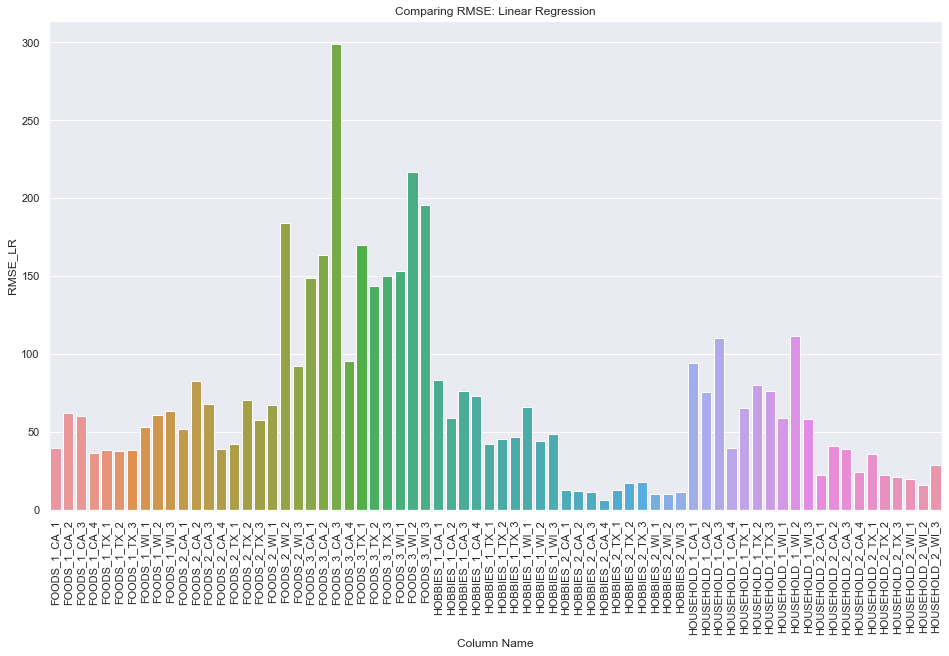

In [41]:
COD_dataframe_LR = pd.DataFrame(columns_and_CODs)
sns.set(rc={'figure.figsize':(16,9)})
# ax = sns.barplot(x="Column Name", y="COD", data=COD_dataframe)
ax = sns.barplot(x="Column Name", y="RMSE_LR", data=COD_dataframe_LR)
ax.set_title("Comparing RMSE: Linear Regression")
ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
pass

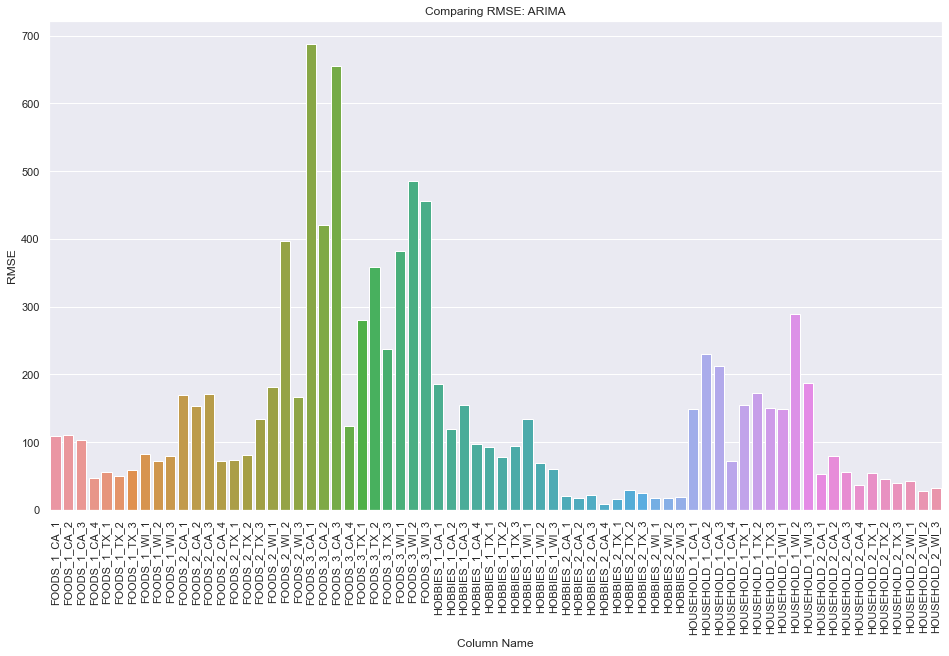

In [40]:
COD_dataframe_ARIMA = pd.DataFrame(columns_and_CODs_ARIMA)
sns.set(rc={'figure.figsize':(16,9)})
# ax = sns.barplot(x="Column Name", y="COD", data=COD_dataframe)
ax = sns.barplot(x="Column Name", y="RMSE", data=COD_dataframe_ARIMA)
ax.set_title("Comparing RMSE: ARIMA")
ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
pass

In [53]:
COD_dataframe_LR = COD_dataframe_LR.rename(columns={'COD': 'COD_LR'})
COD_dataframe_ARIMA = COD_dataframe_ARIMA.rename(columns={'COD' : 'COD_ARIMA', 'RMSE' : 'RMSE_ARIMA'})
COD_plus_RMSE_LR_vs_ARIMA = pd.merge(COD_dataframe_LR, COD_dataframe_ARIMA, on = "Column Name")
COD_plus_RMSE_LR_vs_ARIMA

,Column Name,COD_LR,RMSE_LR,COD_ARIMA,RMSE_ARIMA
0,FOODS_1_CA_1,0.756502,39.835485,0.353165,109.393055
1,FOODS_1_CA_2,0.721124,62.080647,0.353165,111.168370
2,FOODS_1_CA_3,0.566549,60.218791,0.353165,103.703461
3,FOODS_1_CA_4,0.081191,36.364313,0.353165,47.099535
4,FOODS_1_TX_1,0.278097,38.250711,0.353165,55.364342
...,...,...,...,...,...
65,HOUSEHOLD_2_TX_2,0.643592,22.251539,0.353165,45.862013
66,HOUSEHOLD_2_TX_3,0.456802,21.343343,0.353165,39.989556
67,HOUSEHOLD_2_WI_1,0.775386,20.005266,0.353165,42.725974
68,HOUSEHOLD_2_WI_2,0.665890,15.737186,0.353165,28.494637


D:\Anaconda\lib\site-packages\seaborn\categorical.py:3666: UserWarning: The `factorplot` function has been renamed to `catplot`. The original name will be removed in a future release. Please update your code. Note that the default `kind` in `factorplot` (`'point'`) has changed `'strip'` in `catplot`.
  warnings.warn(msg)
D:\Anaconda\lib\site-packages\seaborn\categorical.py:3672: UserWarning: The `size` paramter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)


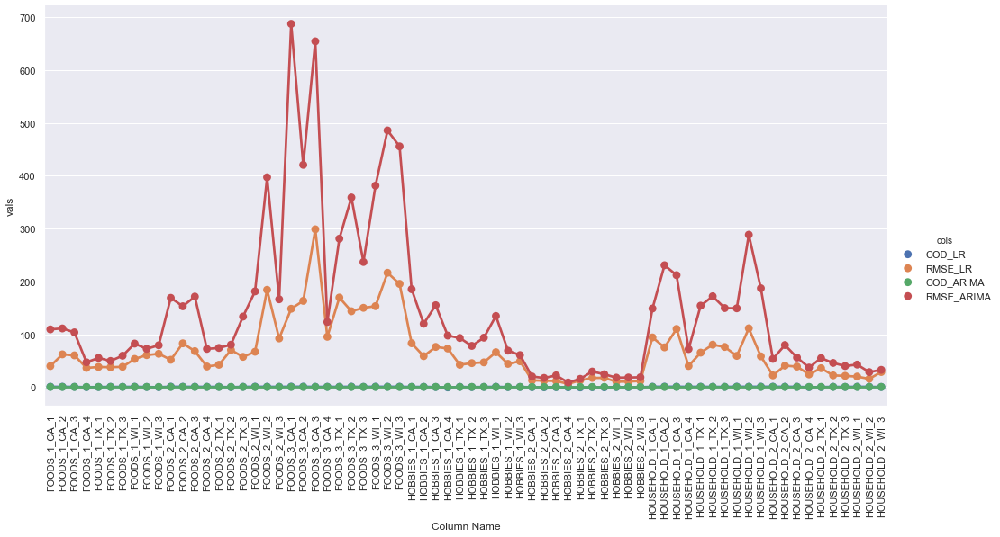

In [59]:
COD_plus_RMSE_LR_vs_ARIMA_melted = COD_plus_RMSE_LR_vs_ARIMA.melt('Column Name', var_name='cols',  value_name='vals')
sns.set(rc={'figure.figsize':(16,9)})
ax = sns.factorplot(x="Column Name", y="vals", hue='cols', data=COD_plus_RMSE_LR_vs_ARIMA_melted, 
                    kind = "point", size=7, aspect=2)
ax.set_xticklabels(rotation=90)
pass